# ---------------------------------------------------------------------------------------------------------------
# __A Comparative Study of Long Short Term Memory Neural Network and GARCH Econometric Model in Predicting Stock Prices Volatility and Estimating Value at Risk__
# ---------------------------------------------------------------------------------------------------------------

__Made By:__
-  __Riechie (01112210038)__
-  __Ferell Aaron Wirjanto (01112210025)__

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import datetime
from tensorflow.keras.optimizers import Adam
import math
import plotly.express as px
import plotly.figure_factory as ff
import yfinance as yf
import statsmodels.api as sm
from statistics import mode
from statistics import stdev
from statistics import variance
from scipy.stats import kstest
from scipy.stats import shapiro
from scipy.stats import skew
from scipy.stats import kurtosis
import plotly.graph_objects as go

# I. Exploratory Data Analysis
***
***

In this study, we employ the Long Short-Term Memory (LSTM), a subset of the Artificial Neural Network (ANN), and the GARCH Model to forecast rolling stock prices volatility in Indonesia, and using the forecasted volatility to estimate the Value at Risk. Our data is sourced from Yahoo Finance, and we concentrate on three stocks, each symbolizing a distinct market industry. Specifically, BBCA.JK represents the finance industry, TLKM.JK corresponds to the telecommunication and network industry, and INDF.JK stands for the food industry.

## Reading and Inspecting the data
***

In [ ]:
BCA = yf.download("BBCA.JK", start = '2015-10-15', end = '2023-10-14', interval = '1d')
BCA.head(10)

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2015-10-15,2600.0,2630.0,2585.0,2595.0,2221.270020,112243500
2015-10-16,2600.0,2600.0,2550.0,2560.0,2191.311768,80741500
2015-10-19,2560.0,2655.0,2560.0,2625.0,2246.950195,75688000
2015-10-20,2655.0,2660.0,2630.0,2640.0,2259.789795,76519500
2015-10-21,2660.0,2700.0,2660.0,2665.0,2281.189697,48500500
2015-10-22,2690.0,2700.0,2670.0,2680.0,2294.028809,41297500
2015-10-23,2755.0,2755.0,2685.0,2695.0,2306.868408,54593500
2015-10-26,2730.0,2745.0,2715.0,2730.0,2336.828613,72511000
2015-10-27,2710.0,2740.0,2690.0,2730.0,2336.828613,41899000


In [ ]:
UNVR = yf.download("UNVR.JK", start = '2015-10-15', end = '2023-10-14', interval = '1d')
UNVR.head(10)

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2015-10-15,7705.0,7865.0,7600.0,7600.0,5860.415527,6535000
2015-10-16,7660.0,7700.0,7425.0,7515.0,5794.872559,12202000
2015-10-19,7540.0,7700.0,7540.0,7665.0,5910.538574,6589000
2015-10-20,7670.0,7780.0,7665.0,7745.0,5972.228027,9242500
2015-10-21,7740.0,7785.0,7670.0,7740.0,5968.370117,3650500
2015-10-22,7720.0,7740.0,7600.0,7650.0,5898.972168,4874000
2015-10-23,7840.0,7840.0,7680.0,7685.0,5925.961426,7230500
2015-10-26,7685.0,7785.0,7685.0,7730.0,5960.660645,6848000
2015-10-27,7730.0,7760.0,7655.0,7730.0,5960.660645,8163500


In [ ]:
BYAN = yf.download("BYAN.JK", start = '2015-10-15', end = '2023-10-14', interval = '1d')
BYAN.head(10)

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2015-10-15,825.0,825.0,825.0,825.0,557.963074,20000
2015-10-16,825.0,825.0,825.0,825.0,557.963074,30000
2015-10-19,825.0,825.0,825.0,825.0,557.963074,0
2015-10-20,825.0,825.0,825.0,825.0,557.963074,0
2015-10-21,825.0,825.0,825.0,825.0,557.963074,0
2015-10-22,825.0,825.0,825.0,825.0,557.963074,0
2015-10-23,825.0,825.0,825.0,825.0,557.963074,0
2015-10-26,800.0,800.0,800.0,800.0,541.054993,30000
2015-10-27,810.0,810.0,810.0,810.0,547.818237,40000


In [ ]:
len(BCA), len(UNVR), len(BYAN)

(1993, 1993, 1993)

It seems that the three datasets have different numbers of rows; therefore, in the next cell, we will only select the rows with dates that are common to all three datasets.

In [ ]:
UNVR, BYAN = UNVR.align(BYAN, join = 'inner', axis = 0)
BCA, UNVR = BCA.align(UNVR, join='inner', axis=0)

In [ ]:
len(BCA), len(UNVR), len(BYAN)

(1993, 1993, 1993)

In [ ]:
BCA['Adj Close'].isnull().sum(), UNVR['Adj Close'].isnull().sum(), BYAN['Adj Close'].isnull().sum(),

(0, 0, 0)

It can be seen that all three datasets now share an equal number of rows, and there are no missing values in any of them. Therefore, the data is now ready to use.

The data consists of 1992 rows and 7 columns, with the columns being _Date, Open, High, Low, Close, Adj Close, and Volume_. Below is the description of each features.

-  __Open price__: the starting price when the market opens for the day
-  __High price__: indicate the highest values reached during the day.
-  __Low price__: indicate the lowest values reached during the day.
-  __Close price__: the final trading price before market close
-  __Adj Close__: adjusts for events like dividends and stock splits.
-  __Volume__: represents the total shares or units traded that day, signifying market activity and liquidity

Out of all the available features, we will exclusively utilize the "Adj Close" feature as our focus is on examining the volatility of daily stock prices. We opt for "Adj Close" instead of "Close" because the former has already been adjusted for external occurrences like dividends or stock splits that may influence stock prices.

In [ ]:
BCA = BCA[['Adj Close']]
UNVR = UNVR[['Adj Close']]
BYAN = BYAN[['Adj Close']]

## Data Visualization and Descriptive Statistics
***

In the following step, we will create visualizations for the Adjusted Closing Price in each sector and the descriptive statistics to examine both the normality and stationarity of the data. This is crucial, especially when working with GARCH models, as we require stationary data and an understanding of the data distribution.

<ipython-input-15-b79cb26135ea>:2: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, 2, 1)


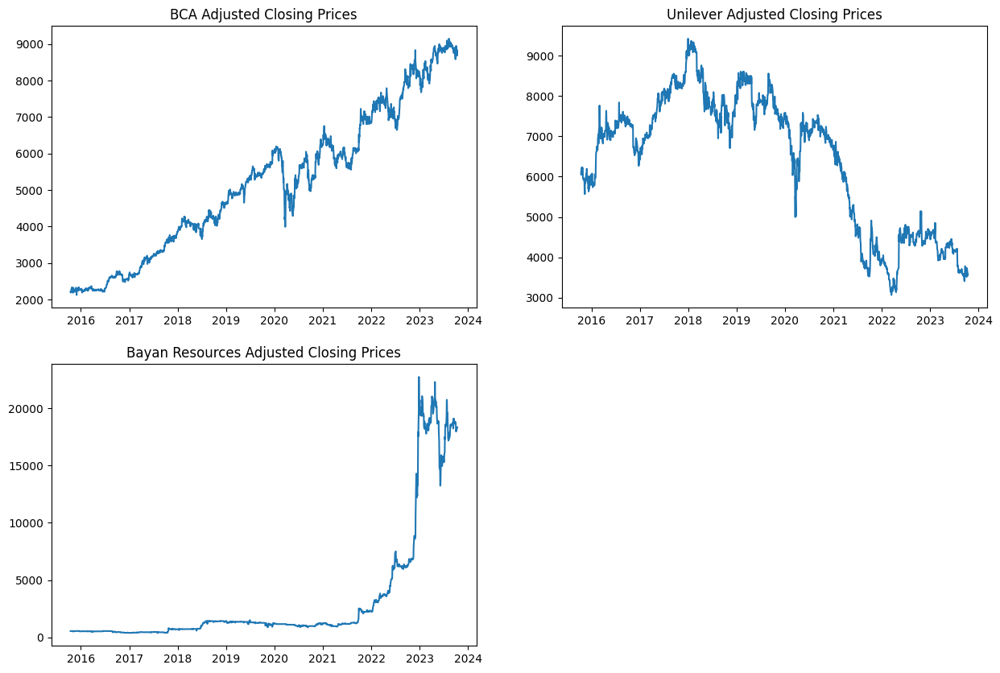

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
plt.subplot(2, 2, 1)
plt.plot(BCA.index, BCA['Adj Close'])
plt.title('BCA Adjusted Closing Prices')
plt.subplot(2, 2, 2)
plt.plot(UNVR.index, UNVR['Adj Close'])
plt.title('Unilever Adjusted Closing Prices')
plt.subplot(2, 2, 3)
plt.plot(BYAN.index, BYAN['Adj Close'])
plt.title('Bayan Resources Adjusted Closing Prices');

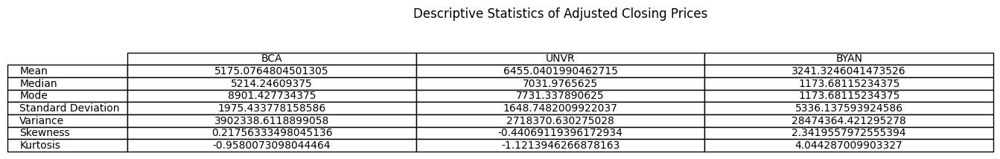

In [ ]:
BCA_Close_mean = BCA['Adj Close'].mean()
BCA_Close_median = BCA['Adj Close'].median()
BCA_Close_mode = mode(BCA['Adj Close'])
BCA_Close_std = stdev(BCA['Adj Close'])
BCA_Close_var = variance(BCA['Adj Close'])
BCA_Close_skew = skew(BCA['Adj Close'])
BCA_Close_kurtosis = kurtosis(BCA['Adj Close'])

UNVR_Close_mean = UNVR['Adj Close'].mean()
UNVR_Close_median = UNVR['Adj Close'].median()
UNVR_Close_mode = mode(UNVR['Adj Close'])
UNVR_Close_std = stdev(UNVR['Adj Close'])
UNVR_Close_var = variance(UNVR['Adj Close'])
UNVR_Close_skew = skew(UNVR['Adj Close'])
UNVR_Close_kurtosis = kurtosis(UNVR['Adj Close'])


BYAN_Close_mean = BYAN['Adj Close'].mean()
BYAN_Close_median = BYAN['Adj Close'].median()
BYAN_Close_mode = mode(BYAN['Adj Close'])
BYAN_Close_std = stdev(BYAN['Adj Close'])
BYAN_Close_var = variance(BYAN['Adj Close'])
BYAN_Close_skew = skew(BYAN['Adj Close'])
BYAN_Close_kurtosis = kurtosis(BYAN['Adj Close'])


stats = {'Mean':[BCA_Close_mean, UNVR_Close_mean, BYAN_Close_mean],
         'Median':[BCA_Close_median,UNVR_Close_median, BYAN_Close_median],
         'Mode':[BCA_Close_mode,UNVR_Close_mode, BYAN_Close_mode],
         'Standard Deviation': [BCA_Close_std,UNVR_Close_std, BYAN_Close_std],
         'Variance': [BCA_Close_var, UNVR_Close_var, BYAN_Close_var],
         'Skewness':[BCA_Close_skew,UNVR_Close_skew, BYAN_Close_skew],
         'Kurtosis':[BCA_Close_kurtosis,UNVR_Close_kurtosis,BYAN_Close_kurtosis]
        }
Desc_stats = pd.DataFrame(stats,index=['BCA','UNVR','BYAN'])
Desc_stats = Desc_stats.transpose()

fig = plt.figure(figsize = (15, .5))
ax = fig.add_subplot(111)

#create table
ax.table(cellText = Desc_stats.values, rowLabels = Desc_stats.index,
         colLabels = Desc_stats.columns, cellLoc='center')

#add title to table
ax.set_title('Descriptive Statistics of Adjusted Closing Prices')

#turn axes off
ax.axis('off');


<ipython-input-17-82a48f680035>:2: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, 2, 1)


Text(0.5, 1.0, 'BYAN Adjusted Closing Prices')

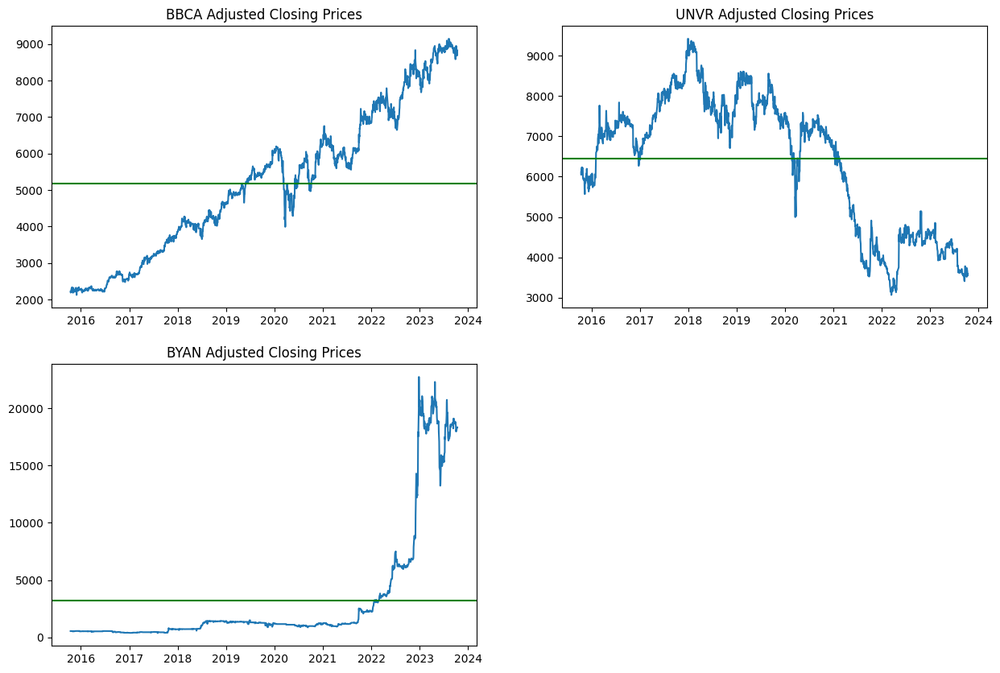

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
plt.subplot(2, 2, 1)
plt.plot(BCA.index, BCA['Adj Close'])
plt.axhline(BCA_Close_mean, color = 'g')
plt.title('BBCA Adjusted Closing Prices')
plt.subplot(2, 2, 2)
plt.plot(UNVR.index, UNVR['Adj Close'])
plt.axhline(UNVR_Close_mean, color = 'g')
plt.title('UNVR Adjusted Closing Prices')
plt.subplot(2, 2, 3)
plt.plot(BYAN.index, BYAN['Adj Close'])
plt.axhline(BYAN_Close_mean, color = 'g')
plt.title('BYAN Adjusted Closing Prices')

From the visualization above alone, it is already evident that the data does not have a constant mean, which means the Adjusted Closing Price is not stationary and cannot be used for a GARCH model. Next, we will examine the normality of the Adjusted Closing Price in each sector using a QQ-Plot.

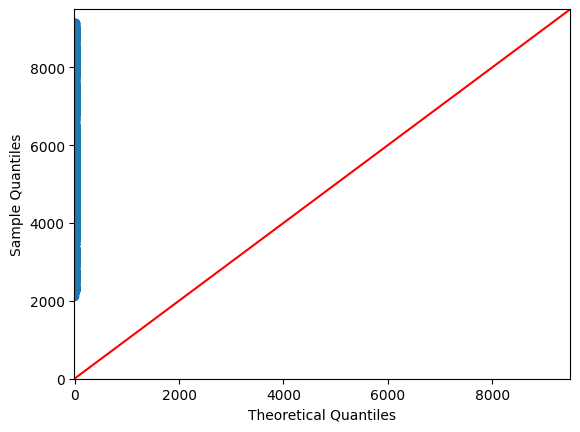

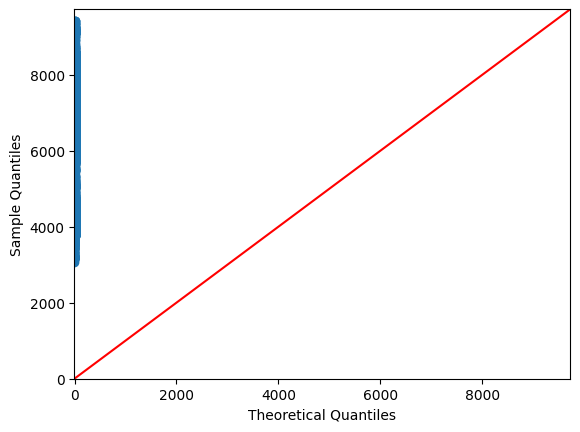

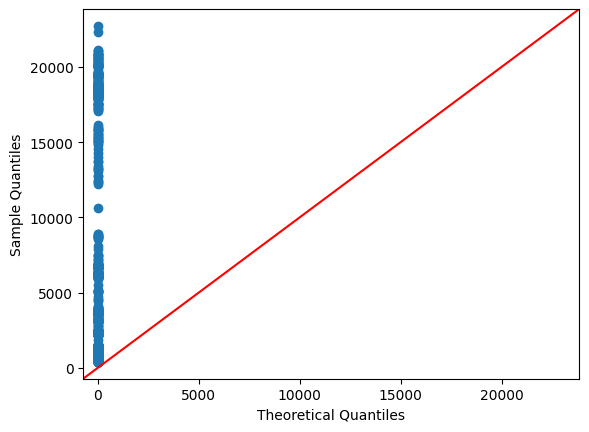

In [ ]:
sm.qqplot(BCA['Adj Close'], line ='45') ;
sm.qqplot(UNVR['Adj Close'], line ='45') ;
sm.qqplot(BYAN['Adj Close'], line ='45') ;

Once again, it's clear that the data does not follow a normal distribution. To confirm this, we will conduct several hypothesis tests to assess the normality of the data.

The initial test we will use is the __Kolmogorov-Smirnov test__, a test designed to compare a sample with a specific distribution, in this case, the normal distribution. The null and alternative hypotheses are as follows:
- Null Hypothesis ($H_{0}$): The data follows a normal distribution.
- Alternative Hypothesis ($H_{a}$): The data does not follow a normal distribution.

Next, we will use the __Shapiro-Wilk test__, which is a statistical test for assessing the normality of a dataset. The test is sensitive to deviations from normality in both tails of the distribution and is widely used for small to moderately sized samples. The null and alternative hypotheses for the Shapiro-Wilk test are as follows:
- Null Hypothesis ($H_{0}$): The data follows a normal distribution.
- Alternative Hypothesis ($H_{a}$): The data does not follow a normal distribution.

In [ ]:
BCA_Close_ks = kstest(BCA['Adj Close'], 'norm')
BCA_Close_sw = shapiro(BCA['Adj Close'])

UNVR_Close_ks = kstest(UNVR['Adj Close'], 'norm')
UNVR_Close_sw = shapiro(UNVR['Adj Close'])

BYAN_Close_ks = kstest(BYAN['Adj Close'], 'norm')
BYAN_Close_sw = shapiro(BYAN['Adj Close'])

print('Kolmogorov Smirnov test for BBCA Adj Close has a p-value of ', BCA_Close_ks[1])
print('Shapiro Wilkin test for BBCA Adj Close has a pvalue of ', BCA_Close_sw[1])
print('\n')
print('Kolmogorov Smirnov test for UNVR Adj Close has a p-value of ', UNVR_Close_ks[1])
print('Shapiro Wilkin test for UNVR Adj Close has a pvalue of ', UNVR_Close_sw[1])
print('\n')
print('Kolmogorov Smirnov test for BYAN Adj Close has a p-value of ', BYAN_Close_ks[1])
print('Shapiro Wilkin test for BYAN Adj Close has a pvalue of ', BYAN_Close_sw[1])

Kolmogorov Smirnov test for BBCA Adj Close has a p-value of  0.0
Shapiro Wilkin test for BBCA Adj Close has a pvalue of  3.305762446880495e-24


Kolmogorov Smirnov test for UNVR Adj Close has a p-value of  0.0
Shapiro Wilkin test for UNVR Adj Close has a pvalue of  7.396671249159355e-32


Kolmogorov Smirnov test for BYAN Adj Close has a p-value of  0.0
Shapiro Wilkin test for BYAN Adj Close has a pvalue of  0.0


For all sectors, the Adjusted Closing Price exhibits a p-value < 0.05 in both hypothesis tests, leading to the rejection of the null hypothesis that the data follows a normal distribution. As a result, we can conclude that the "Adj Close" column does not follow a normal distribution.

In [ ]:
#We create a distribution plot using plotly.figure_factory, we reshape the data to have them in a vector
return_dist_plot1  = ff.create_distplot([BCA['Adj Close'].values.reshape(-1)], group_labels = [' '])
#We specify the plot layout
return_dist_plot1.update_layout(showlegend=False, title_text='Distribution of BBCA Adjusted Close', width=1000, height=500)
#Printing the plot
return_dist_plot1.show()

#We create a distribution plot using plotly.figure_factory, we reshape the data to have them in a vector
return_dist_plot2  = ff.create_distplot([UNVR['Adj Close'].values.reshape(-1)], group_labels = [' '])
#We specify the plot layout
return_dist_plot2.update_layout(showlegend=False, title_text='Distribution of UNVR Adjusted Close', width=1000, height=500)
#Printing the plot
return_dist_plot2.show()

#We create a distribution plot using plotly.figure_factory, we reshape the data to have them in a vector
return_dist_plot3  = ff.create_distplot([BYAN['Adj Close'].values.reshape(-1)], group_labels = [' '])
#We specify the plot layout
return_dist_plot3.update_layout(showlegend=False, title_text='Distribution of BYAN Adjusted Close', width=1000, height=500)
#Printing the plot
return_dist_plot3.show()

## Use of Stock Returns
***

Using stock returns instead of raw stock prices is particularly essential when employing econometric models in financial analysis. Econometric models, such as ARIMA (AutoRegressive Integrated Moving Average) and GARCH (Generalized Autoregressive Conditional Heteroskedasticity), are designed for stationary time series data. Returns, with their inherent stationarity, align more closely with the assumptions of these models, ensuring more accurate and reliable results. Attempting to model raw prices directly may lead to violations of the stationarity assumption, undermining the validity of the econometric analysis. Therefore, for econometric modeling purposes, the use of stock returns becomes imperative for maintaining the integrity and effectiveness of the models.

Simple return are calculated as follows:<br>
$$ r = \frac{P_{t}-P_{t-1}}{P_{t-1}} * 100 $$

Log return are calculated as follows:<br>
$$ r = ln(\frac{P_{t}}{P_{t-1}}) * 100$$

In [ ]:
BCA['simple return'] = 100 * BCA['Adj Close'].pct_change()
BCA['log return'] = 100 * (np.log(BCA['Adj Close']) - np.log(BCA['Adj Close'].shift(1)))

UNVR['simple return'] = 100 * UNVR['Adj Close'].pct_change()
UNVR['log return'] = 100 * (np.log(UNVR['Adj Close']) - np.log(UNVR['Adj Close'].shift(1)))

BYAN['simple return'] = 100 * BYAN['Adj Close'].pct_change()
BYAN['log return'] = 100 * (np.log(BYAN['Adj Close']) - np.log(BYAN['Adj Close'].shift(1)))

BCA = BCA.dropna()
UNVR = UNVR.dropna()
BYAN = BYAN.dropna()

BCA, UNVR, BYAN

(              Adj Close  simple return  log return
 Date                                              
 2015-10-16  2191.311768      -1.348699   -1.357877
 2015-10-19  2246.950195       2.539047    2.507348
 2015-10-20  2259.789795       0.571423    0.569797
 2015-10-21  2281.189697       0.946986    0.942531
 2015-10-22  2294.028809       0.562825    0.561247
 ...                 ...            ...         ...
 2023-10-09  8804.144531       0.277013    0.276630
 2023-10-10  8682.540039      -1.381219   -1.390846
 2023-10-11  8682.540039       0.000000    0.000000
 2023-10-12  8804.144531       1.400564    1.390846
 2023-10-13  8828.464844       0.276237    0.275856
 
 [1992 rows x 3 columns],
               Adj Close  simple return  log return
 Date                                              
 2015-10-16  5794.872559      -1.118401   -1.124703
 2015-10-19  5910.538574       1.996006    1.976347
 2015-10-20  5972.228027       1.043720    1.038311
 2015-10-21  5968.370117      -0.064

Simple return and log return both measure the percentage change in the value of an asset, but log return is often preferred in financial analysis. While the difference between them is minimal for small changes, log return is advantageous due to its mathematical properties, including additivity and suitability for statistical applications. Log returns are particularly useful in financial modeling and portfolio analysis, providing a continuous measure of the percentage change and ensuring consistency in calculations over multiple periods. Overall, while simple return is straightforward, log return is favored for its precision and compatibility with various analytical techniques in the financial domain. So, we will utilize log return instead of simple return in this study.

Next, we will visualize the log returns of each sector, along with the descriptive statistics.

<ipython-input-12-b7d782c4fbbb>:2: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, 2, 1)


Text(0.5, 1.0, 'BYAN log returns')

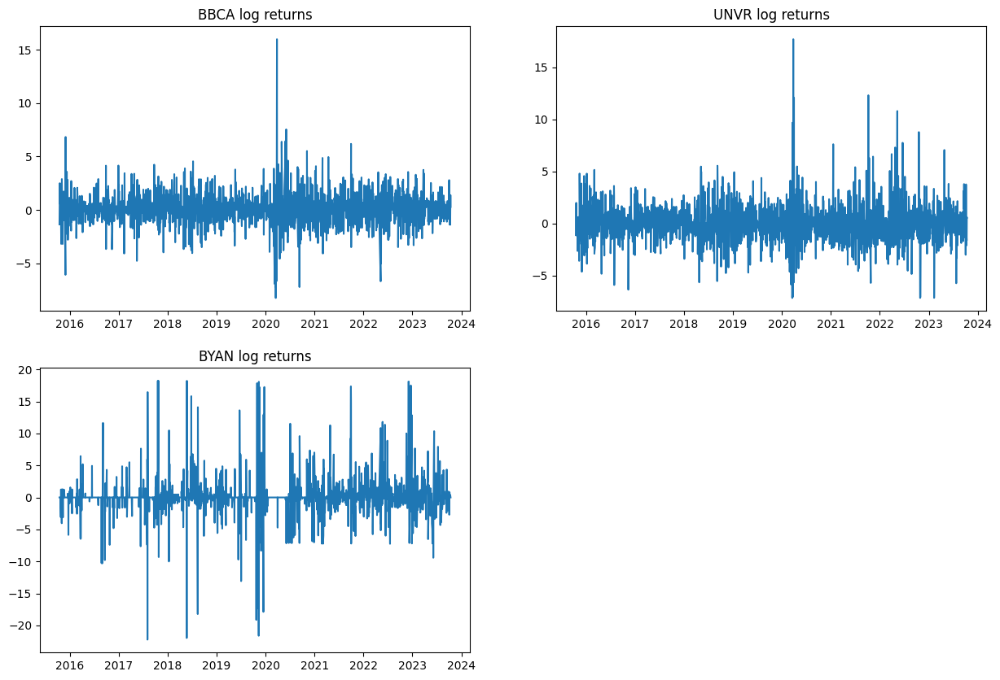

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
plt.subplot(2, 2, 1)
plt.plot(BCA.index, BCA['log return'])
plt.title('BBCA log returns')
plt.subplot(2, 2, 2)
plt.plot(UNVR.index, UNVR['log return'])
plt.title('UNVR log returns')
plt.subplot(2, 2, 3)
plt.plot(BYAN.index, BYAN['log return'])
plt.title('BYAN log returns')

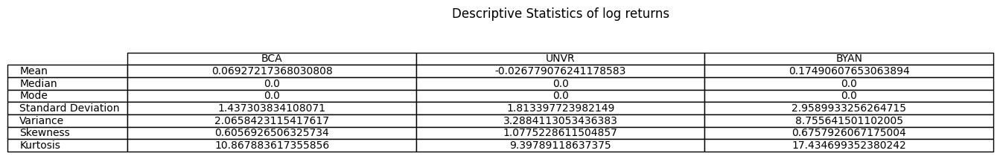

In [ ]:
BCA_Return_mean = BCA['log return'].mean()
BCA_Return_median = BCA['log return'].median()
BCA_Return_mode = mode(BCA['log return'])
BCA_Return_std = stdev(BCA['log return'])
BCA_Return_var = variance(BCA['log return'])
BCA_Return_skew = skew(BCA['log return'])
BCA_Return_kurtosis = kurtosis(BCA['log return'])

UNVR_Return_mean = UNVR['log return'].mean()
UNVR_Return_median = UNVR['log return'].median()
UNVR_Return_mode = mode(UNVR['log return'])
UNVR_Return_std = stdev(UNVR['log return'])
UNVR_Return_var = variance(UNVR['log return'])
UNVR_Return_skew = skew(UNVR['log return'])
UNVR_Return_kurtosis = kurtosis(UNVR['log return'])


BYAN_Return_mean = BYAN['log return'].mean()
BYAN_Return_median = BYAN['log return'].median()
BYAN_Return_mode = mode(BYAN['log return'])
BYAN_Return_std = stdev(BYAN['log return'])
BYAN_Return_var = variance(BYAN['log return'])
BYAN_Return_skew = skew(BYAN['log return'])
BYAN_Return_kurtosis = kurtosis(BYAN['log return'])


stats_returns = {'Mean':[BCA_Return_mean, UNVR_Return_mean, BYAN_Return_mean],
                 'Median':[BCA_Return_median,UNVR_Return_median, BYAN_Return_median],
                 'Mode':[BCA_Return_mode,UNVR_Return_mode, BYAN_Return_mode],
                 'Standard Deviation': [BCA_Return_std,UNVR_Return_std, BYAN_Return_std],
                 'Variance': [BCA_Return_var,UNVR_Return_var, BYAN_Return_var],
                 'Skewness':[BCA_Return_skew,UNVR_Return_skew, BYAN_Return_skew],
                 'Kurtosis':[BCA_Return_kurtosis,UNVR_Return_kurtosis,BYAN_Return_kurtosis]
        }
Desc_stats_returns = pd.DataFrame(stats_returns,index=['BCA','UNVR','BYAN'])
Desc_stats_returns = Desc_stats_returns.transpose()

fig = plt.figure(figsize = (15, .5))
ax = fig.add_subplot(111)

#create table
ax.table(cellText = Desc_stats_returns.values, rowLabels = Desc_stats_returns.index,
         colLabels = Desc_stats_returns.columns, cellLoc='center')

#add title to table
ax.set_title('Descriptive Statistics of log returns')

#turn axes off
ax.axis('off');

<ipython-input-24-162572f1c33f>:2: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



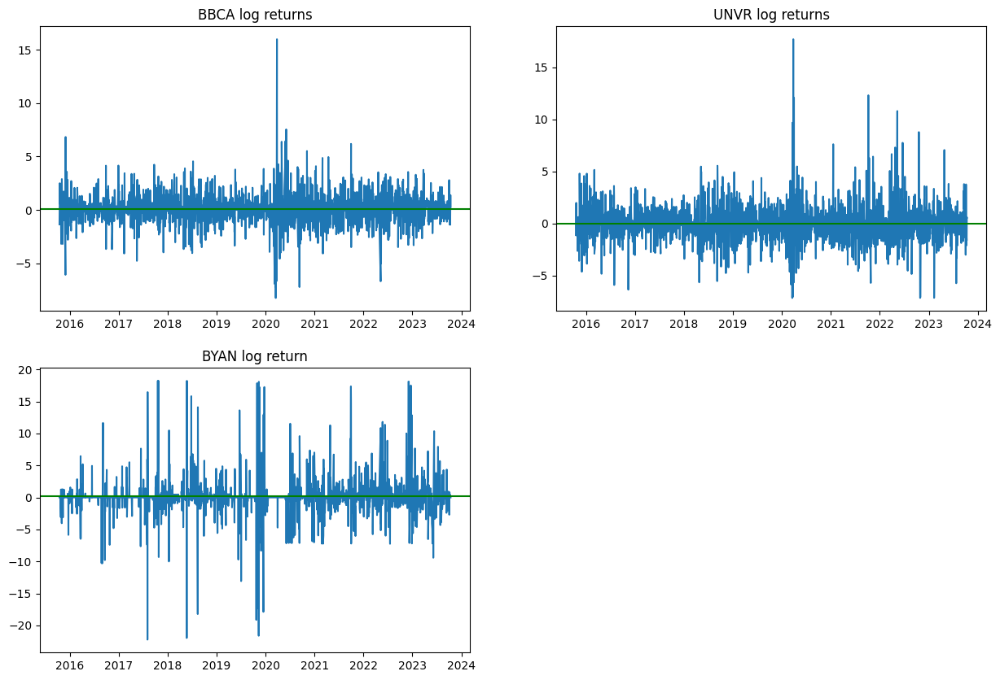

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
plt.subplot(2, 2, 1)
plt.plot(BCA.index, BCA['log return'])
plt.axhline(BCA_Return_mean, color = 'g')
plt.title('BBCA log returns')
plt.subplot(2, 2, 2)
plt.plot(UNVR.index, UNVR['log return'])
plt.axhline(UNVR_Return_mean, color = 'g')
plt.title('UNVR log returns')
plt.subplot(2, 2, 3)
plt.plot(BYAN.index, BYAN['log return'])
plt.axhline(BYAN_Return_mean, color = 'g')
plt.title('BYAN log return');

From the figures above, it would appear that all data have a constant mean, later on we will do a proper hypothesis test to check wether or not the data is stationary. But before that, we will first check wether or not the data comes from a normal distribution.

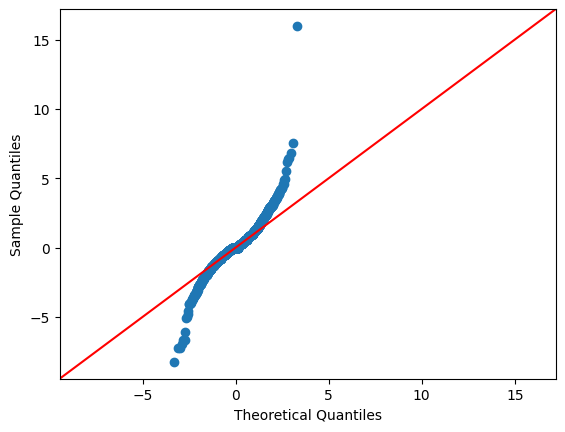

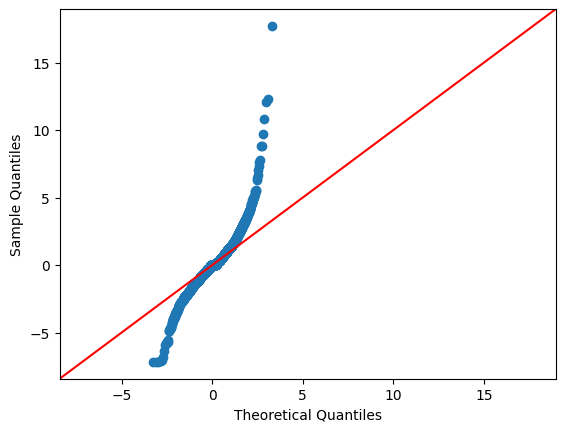

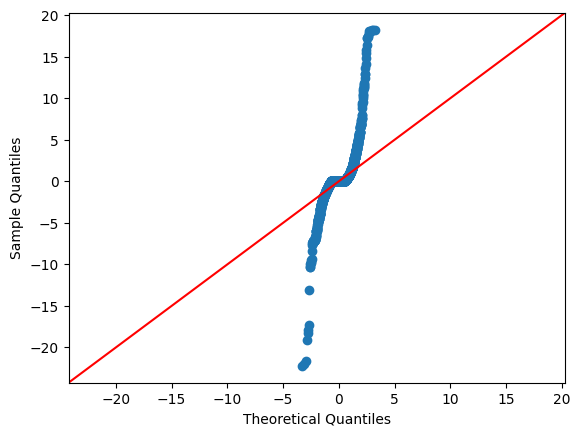

In [ ]:
sm.qqplot(BCA['log return'], line ='45');
sm.qqplot(UNVR['log return'], line ='45');
sm.qqplot(BYAN['log return'], line ='45');

In [ ]:
BCA_Returns_ks = kstest(BCA['log return'], 'norm')
BCA_Returns_sw = shapiro(BCA['log return'])

UNVR_Returns_ks = kstest(UNVR['log return'], 'norm')
UNVR_Returns_sw = shapiro(UNVR['log return'])

BYAN_Returns_ks = kstest(BYAN['log return'], 'norm')
BYAN_Returns_sw = shapiro(BYAN['log return'])

print('Kolmogorov Smirnov test for BBCA Log Returns has a p-value of ', BCA_Returns_ks[1])
print('Shapiro Wilkin test for BBCA Adj Close has a pvalue of ', BCA_Returns_sw[1])
print('\n')
print('Kolmogorov Smirnov test for UNVR Log Returns has a p-value of ', UNVR_Returns_ks[1])
print('Shapiro Wilkin test for UNVR Adj Close has a pvalue of ', UNVR_Returns_sw[1])
print('\n')
print('Kolmogorov Smirnov test for BYAN Log Returns has a p-value of ', BYAN_Returns_ks[1])
print('Shapiro Wilkin test for BYAN Adj Close has a pvalue of ', BYAN_Returns_sw[1])

Kolmogorov Smirnov test for BBCA Log Returns has a p-value of  5.3191678888788694e-09
Shapiro Wilkin test for BBCA Adj Close has a pvalue of  6.79341107480041e-32


Kolmogorov Smirnov test for UNVR Log Returns has a p-value of  1.2254966291335906e-14
Shapiro Wilkin test for UNVR Adj Close has a pvalue of  2.785328868422419e-32


Kolmogorov Smirnov test for BYAN Log Returns has a p-value of  3.7184943858090578e-115
Shapiro Wilkin test for BYAN Adj Close has a pvalue of  0.0


Despite the considerable improvement in normality with log returns compared to using Adjusted Closing Price, the data doesn't meet the criteria for normal distribution. As a result, we will proceed by assuming a student t distribution for the data.

In [ ]:
#We create a distribution plot using plotly.figure_factory, we reshape the data to have them in a vector
return_dist_plot1  = ff.create_distplot([BCA['log return'].values.reshape(-1)], group_labels = [' '])
#We specify the plot layout
return_dist_plot1.update_layout(showlegend=False, title_text='Distribution of BCA log Returns', width=1000, height=500)
#create another figure to to plot normal distribution
fig1 = ff.create_distplot([BCA['log return'].values.reshape(-1)], group_labels= [''], curve_type = 'normal')
normal_x1 = fig1.data[1]['x']
normal_y1 = fig1.data[1]['y']
return_dist_plot1.add_traces(go.Scatter(x=normal_x1, y=normal_y1, mode = 'lines',
                          line = dict(color='rgba(0,255,0, 0.6)',
                                      #dash = 'dash'
                                      width = 1),
                          name = 'normal'
                         ))
#Printing the plot
return_dist_plot1.show()

#We create a distribution plot using plotly.figure_factory, we reshape the data to have them in a vector
return_dist_plot2  = ff.create_distplot([UNVR['log return'].values.reshape(-1)], group_labels = [''])
#We specify the plot layout
return_dist_plot2.update_layout(showlegend=False, title_text='Distribution of UNVR log Returns', width=1000, height=500)
#create another figure to to plot normal distribution
fig2 = ff.create_distplot([UNVR['log return'].values.reshape(-1)], group_labels= [''], curve_type = 'normal')
normal_x2 = fig2.data[1]['x']
normal_y2 = fig2.data[1]['y']
return_dist_plot2.add_traces(go.Scatter(x=normal_x2, y=normal_y2, mode = 'lines',
                          line = dict(color='rgba(0,255,0, 0.6)',
                                      #dash = 'dash'
                                      width = 1),
                          name = 'normal'
                         ))
#Printing the plot
return_dist_plot2.show()

#We create a distribution plot using plotly.figure_factory, we reshape the data to have them in a vector
return_dist_plot3  = ff.create_distplot([BYAN['log return'].values.reshape(-1)], group_labels = [' '])
#We specify the plot layout
return_dist_plot3.update_layout(showlegend=False, title_text='Distribution of BYAN log Returns', width=1000, height=500)
#create another figure to to plot normal distribution
fig3 = ff.create_distplot([BYAN['log return'].values.reshape(-1)], group_labels= [''], curve_type = 'normal')
normal_x3 = fig3.data[1]['x']
normal_y3 = fig3.data[1]['y']
return_dist_plot3.add_traces(go.Scatter(x=normal_x3, y=normal_y3, mode = 'lines',
                          line = dict(color='rgba(0,255,0, 0.6)',
                                      #dash = 'dash'
                                      width = 1),
                          name = 'normal'
                         ))
#Printing the plot
return_dist_plot3.show()

# II. GARCH
***
***

The GARCH (Generalized Autoregressive Conditional Heteroskedasticity) model is a widely used statistical tool in financial econometrics for modeling and forecasting volatility in time series data. GARCH models extend traditional time series models by explicitly accounting for the conditional heteroskedasticity, or time-varying volatility, often observed in financial returns. The model assumes that the variance of the error term in a time series is a function of past squared observations and past variances, capturing the clustering of volatility over time. GARCH models are particularly useful for addressing volatility clustering, where periods of high volatility tend to be followed by additional periods of high volatility. Estimation of GARCH parameters involves optimizing the model to fit historical data, and once estimated, the model can be used for volatility forecasting, risk management, and portfolio optimization in financial markets.

In [ ]:
# !pip install arch

In [ ]:
import arch
from statsmodels.compat import lzip
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from scipy.stats import chi2, jarque_bera
from scipy.stats import t, norm, gennorm

## Test for Stationarity with Augmented Dickey-Fuller Test
***

Before we proceed with the GARCH model, first we will have to confirm the stationarity of the data as stationarity is a crucial assumption for GARCH (Generalized Autoregressive Conditional Heteroskedasticity) models. GARCH models are designed to capture time-varying volatility or heteroskedasticity in a time series. The assumption of stationarity is essential because it ensures that the statistical properties of the time series do not change over time.

__The Augmented Dickey-Fuller (ADF) test__ is a statistical test commonly used to assess the stationarity of a time series data. Specifically applied to univariate time series, the ADF test investigates whether a unit root is present, indicating non-stationarity. The test involves estimating a regression model on the time series data and examining the significance of the coefficient associated with the lagged difference term. The ADF test is widely used in econometrics and time series analysis to guide the proper specification of models, such as those used in financial forecasting or macroeconomic research. Below is the null and alternative hypothesis for ADF test:
- Null Hypothesis ($H_{0}$): The time series has unit roots (it is non-stationary)
- Alternative Hypothesis ($H_{a}$): The time series does not have unit roots (it is stationary)

First, we will check the stationarity of the Adjusted Closing Price column.

In [ ]:
BCA_adftest_close = sm.tsa.stattools.adfuller(BCA['Adj Close'])
UNVR_adftest_close = sm.tsa.stattools.adfuller(UNVR['Adj Close'])
BYAN_adftest_close = sm.tsa.stattools.adfuller(BYAN['Adj Close'])

adf_close = {'Test Statistics':[BCA_adftest_close[0], UNVR_adftest_close[0], BYAN_adftest_close[0]],
             'p-value':[BCA_adftest_close[1],UNVR_adftest_close[1], BYAN_adftest_close[1]]
        }
adftest_close = pd.DataFrame(adf_close,index=['BCA','UNVR','BYAN'])
adftest_close

,Test Statistics,p-value
BCA,-0.294530,0.926276
UNVR,-0.764970,0.829196
BYAN,0.026546,0.960673


The $p-value$ is generally quite large ( > 0.05), the only sector that rejects the null hypothesis is INDF stock. This confirms that the Adjusted Closing Price is not stationary for most sectors, hence we will not use it for the GARCH model.

next, we will check the stationarity of the log return column

In [ ]:
BCA_adftest_returns = sm.tsa.stattools.adfuller(BCA['log return'])
UNVR_adftest_returns = sm.tsa.stattools.adfuller(UNVR['log return'])
BYAN_adftest_returns = sm.tsa.stattools.adfuller(BYAN['log return'])

adf_returns = {'Test Statistics':[BCA_adftest_returns[0], UNVR_adftest_returns[0], BYAN_adftest_returns[0]],
             'p-value':[BCA_adftest_returns[1],UNVR_adftest_returns[1], BYAN_adftest_returns[1]]
        }
adftest_returns = pd.DataFrame(adf_returns,index=['BCA','UNVR','BYAN'])
adftest_returns

,Test Statistics,p-value
BCA,-34.046539,0.000000e+00
UNVR,-16.672743,1.539945e-29
BYAN,-10.531005,9.152260e-19


It can be observed that all three sectors have very small p-values, indicating that the log return column is stationary.

## Checking for Heteroscedasticity on Stocks with Breusch - Pagan Test
***

In [ ]:
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms

In [ ]:
BCA_copy = BCA.copy()
UNVR_copy = UNVR.copy()
BYAN_copy = BYAN.copy()

BCA_copy = BCA_copy.rename(columns={'log return': 'log_return'})
UNVR_copy = UNVR_copy.rename(columns={'log return': 'log_return'})
BYAN_copy = BYAN_copy.rename(columns={'log return': 'log_return'})

In [ ]:
BCA_copy

,Adj Close,simple return,log_return
Date,,,
2015-10-16,2191.311768,-1.348699,-1.357877
2015-10-19,2246.950195,2.539047,2.507348
2015-10-20,2259.789795,0.571423,0.569797
2015-10-21,2281.189697,0.946986,0.942531
2015-10-22,2294.028809,0.562825,0.561247
...,...,...,...
2023-10-09,8804.144531,0.277013,0.276630
2023-10-10,8682.540039,-1.381219,-1.390846
2023-10-11,8682.540039,0.000000,0.000000


In [ ]:
BCA_copy['TIME'] = np.array(range(len(BCA_copy)))
UNVR_copy['TIME'] = np.array(range(len(UNVR_copy)))
BYAN_copy['TIME'] = np.array(range(len(BYAN_copy)))

In [ ]:
fit_BCA = smf.ols('log_return ~ TIME', data=BCA_copy).fit()
fit_UNVR = smf.ols('log_return ~ TIME', data=UNVR_copy).fit()
fit_BYAN = smf.ols('log_return ~ TIME', data=BYAN_copy).fit()

names = ['Lagrange multiplier statistic', 'p-value',
         'f-value', 'f p-value']

def test_model(col):
  s = []
  for i in col:
    a = [1,i]
    s.append(a)
  return (np.array(s))

BCA_log_model = test_model(BCA_copy['log_return'])
UNVR_log_model = test_model(UNVR_copy['log_return'])
BYAN_log_model = test_model(BYAN_copy['log_return'])

# Get the test result
BCA_test_result = sms.het_breuschpagan(fit_BCA.resid, BCA_log_model)
UNVR_test_result = sms.het_breuschpagan(fit_UNVR.resid, UNVR_log_model)
BYAN_test_result = sms.het_breuschpagan(fit_BYAN.resid, BYAN_log_model)

In [ ]:
lzip(names, BCA_test_result)

[('Lagrange multiplier statistic', 57.126864430861474),
 ('p-value', 4.0858617113528796e-14),
 ('f-value', 58.754477555953606),
 ('f p-value', 2.772899185917796e-14)]

In [ ]:
lzip(names, UNVR_test_result)

[('Lagrange multiplier statistic', 206.09254360829337),
 ('p-value', 9.781363266881672e-47),
 ('f-value', 229.64468864984136),
 ('f p-value', 3.547902424449138e-49)]

In [ ]:
lzip(names, BYAN_test_result)

[('Lagrange multiplier statistic', 44.86056115620323),
 ('p-value', 2.115766370333594e-11),
 ('f-value', 45.84803477343883),
 ('f p-value', 1.67631584345287e-11)]

## Checking for ARCH Effect on Stocks
***

The ARCH effect (Autoregressive Conditional Heteroskedasticity) refers to the phenomenon in time series data where the conditional variance of the series is not constant over time but instead exhibits autocorrelation.

The presence of the ARCH effect implies that periods of high volatility are followed by periods of high volatility, and the same holds for low volatility. The concept is particularly relevant in financial time series analysis, where volatility clustering is often observed.

### ACF and PACF Plots

__Autocorrelation Function (ACF)__ and __Partial Autocorrelation Function (PACF)__ plots play a crucial role in determining the presence of ARCH (Autoregressive Conditional Heteroskedasticity) effects in time series data. The ACF plot showcases autocorrelation at different lags, and for a series with ARCH effects, significant autocorrelation at higher lags implies persistence in squared residuals. Elevated ACF values outside the confidence interval indicate potential volatility clustering, characteristic of non-constant variance over time.

Similarly, the PACF plot displays partial autocorrelation, accounting for the influence of earlier lags. In the context of ARCH effects, significant partial autocorrelation at higher lags in the PACF plot suggests a direct relationship with squared residuals. Values outside the confidence interval provide visual cues for identifying ARCH effects, aiding in the assessment of non-constant variance and volatility patterns in the time series data.

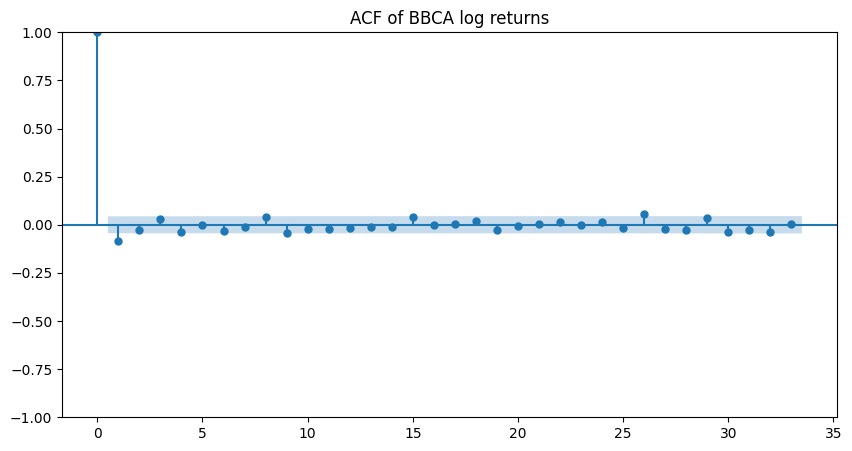

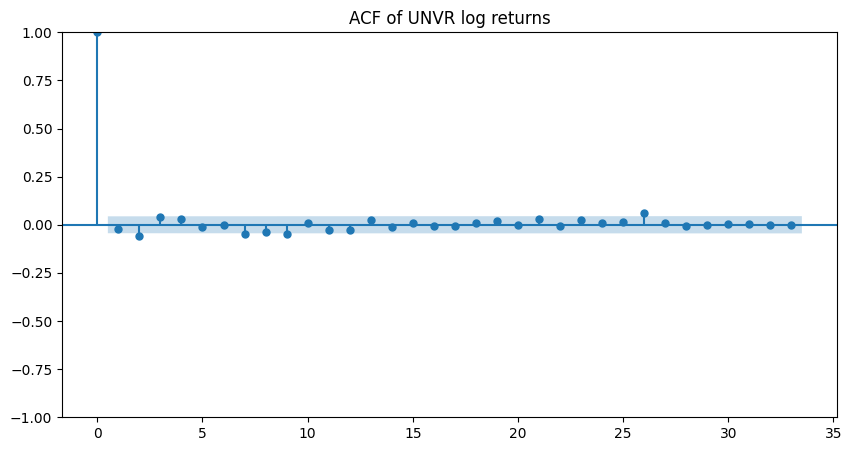

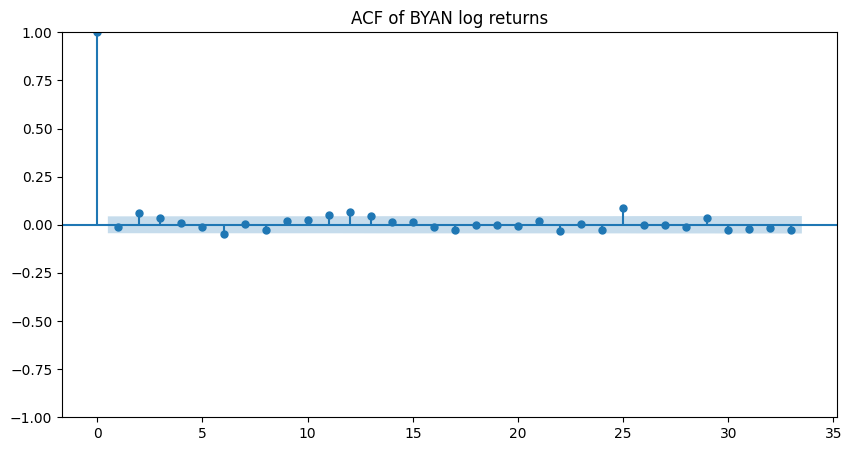

In [ ]:
plt.rc("figure",figsize = (10,5))
plot_acf(BCA['log return']);
plt.title('ACF of BBCA log returns')
plot_acf(UNVR['log return']);
plt.title('ACF of UNVR log returns')
plot_acf(BYAN['log return']);
plt.title('ACF of BYAN log returns');

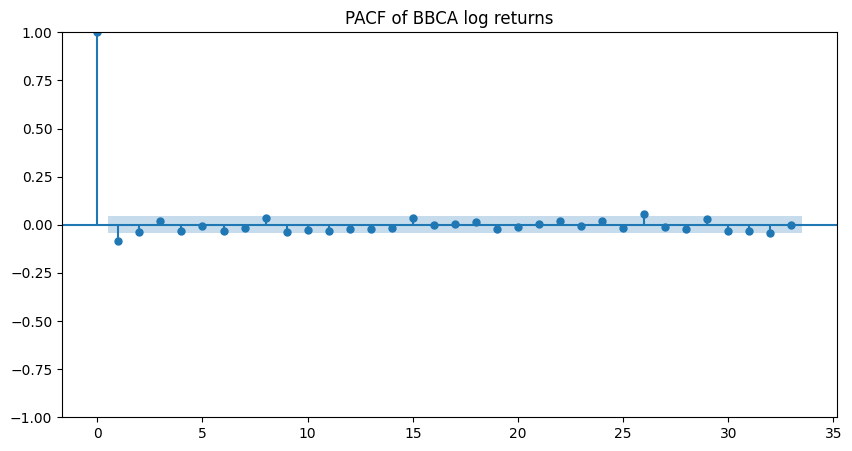

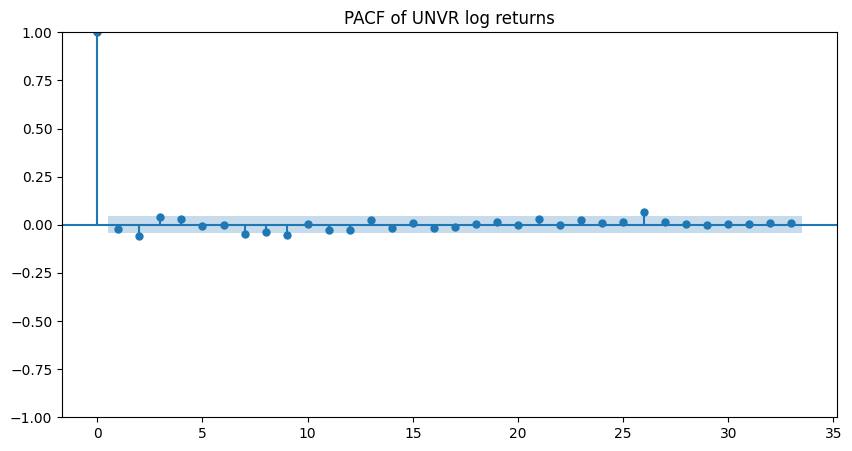

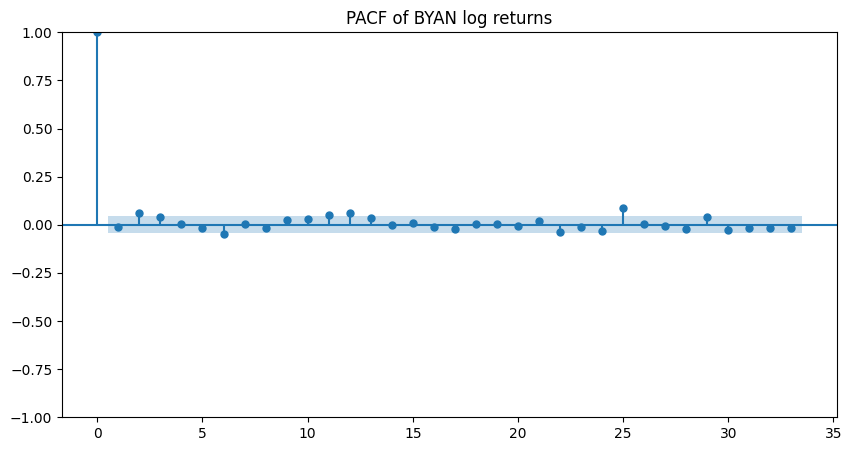

In [ ]:
plt.rc("figure",figsize = (10,5))
plot_pacf(BCA['log return']);
plt.title('PACF of BBCA log returns')
plot_pacf(UNVR['log return']);
plt.title('PACF of UNVR log returns')
plot_pacf(BYAN['log return']);
plt.title('PACF of BYAN log returns');

The ACF and PACF plots above don't show any signs of ARCH and GARCH effects. Specifically, we'd expect to see indications that the series is not independent, visible as lags where ACF and PACF values go beyond the blue area. Such deviations would suggest a notable departure from 0 and provide reasons to model ARCH effects.

To check the independence of the series, or in other words, to test if it's not independent, we remember that an independent series is one where transformations of the series are themselves independent. Therefore, we can repeat the process using squared or absolute returns. Choosing absolute returns, a common practice in financial data to minimize the impact of outliers, helps ensure that we're examining the independence of the series.

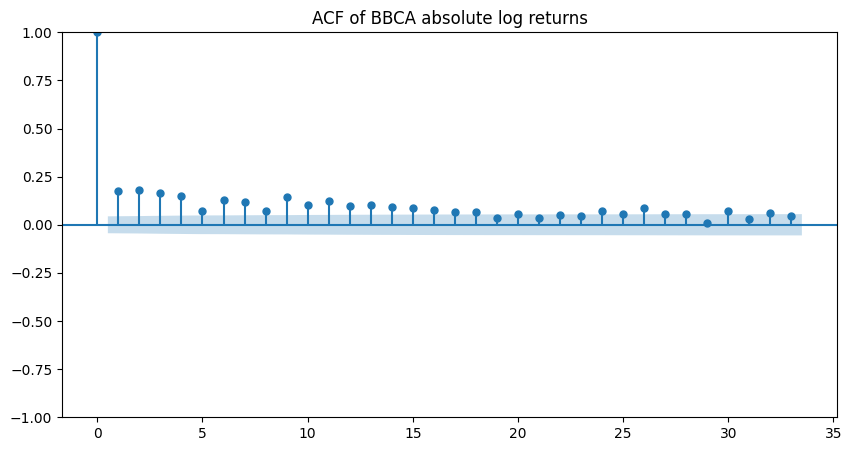

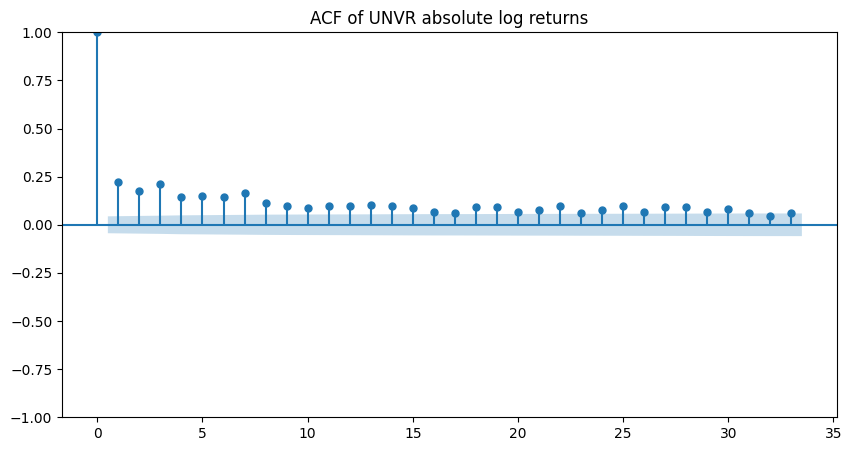

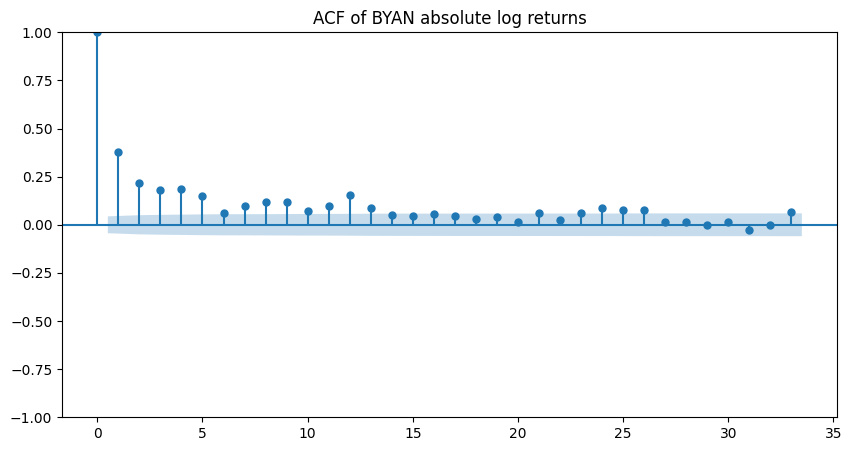

In [ ]:
plt.rc("figure",figsize = (10,5))
plot_acf(BCA['log return'].abs());
plt.title('ACF of BBCA absolute log returns')
plot_acf(UNVR['log return'].abs());
plt.title('ACF of UNVR absolute log returns')
plot_acf(BYAN['log return'].abs());
plt.title('ACF of BYAN absolute log returns');

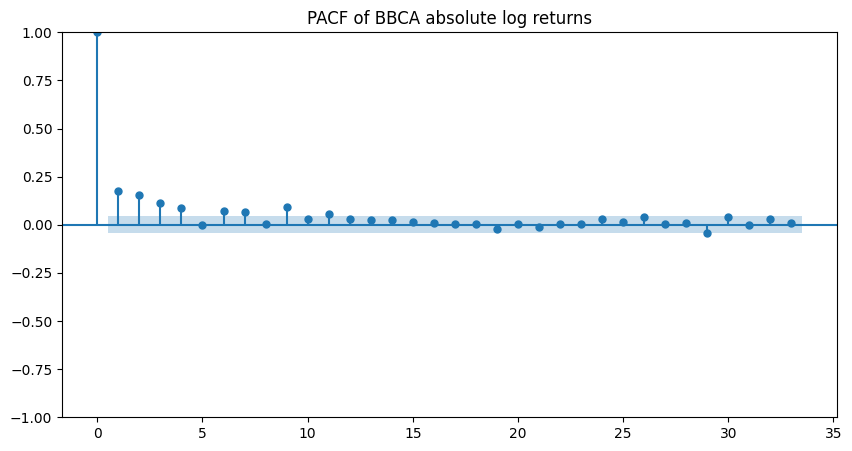

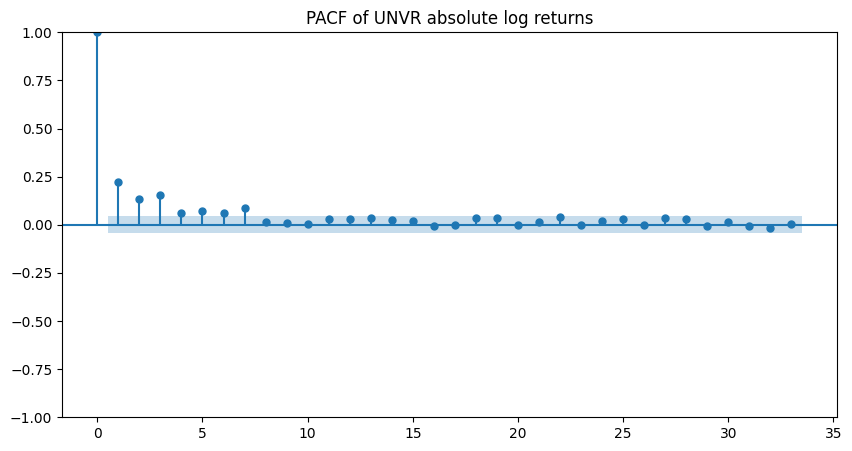

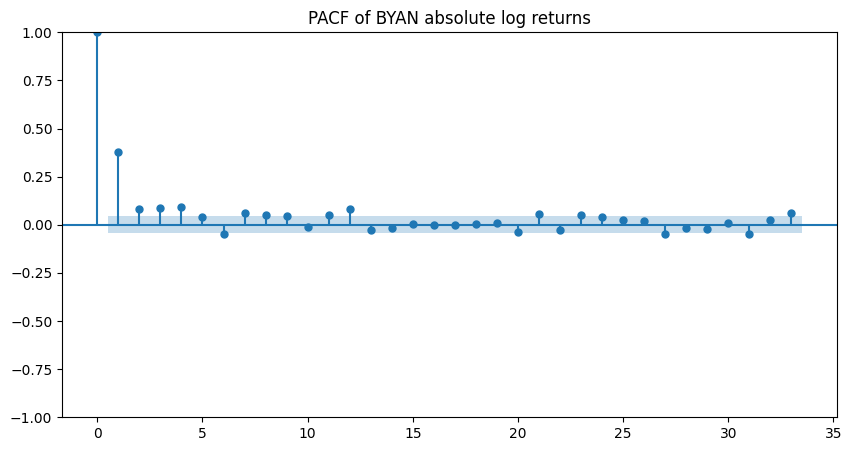

In [ ]:
plt.rc("figure",figsize = (10,5))
plot_pacf(BCA['log return'].abs());
plt.title('PACF of BBCA absolute log returns')
plot_pacf(UNVR['log return'].abs());
plt.title('PACF of UNVR absolute log returns')
plot_pacf(BYAN['log return'].abs());
plt.title('PACF of BYAN absolute log returns');

Upon transforming log returns into absolute values, the emergence of ARCH effects becomes apparent. The transition to absolute values unveils patterns in the squared residuals, signaling volatility clustering and non-constant variance in the time series data. This observation is indicative of ARCH effects, highlighting the necessity for models capable of capturing the evolving volatility dynamics over time. We will formally examine these effects by employing the McLeod-Li test to assess the presence of ARCH and GARCH effects.

### McLeod-Li Test

The __McLeod-Li test__, often referred to as the McLeod test, is a statistical test used to detect the presence of ARCH (Autoregressive Conditional Heteroskedasticity) effects in a time series. Specifically, the McLeod test is designed to identify the existence of ARCH effects up to a certain lag order. Below is the null and alternative hypothesis.

- Null Hypothesis ($H_{0}$): There is no ARCH effect in the time series up to the specified lag order.
- Alternative Hypothesis ($H_{a}$): There is an ARCH effect in the time series up to the specified lag order.

In [ ]:
def mcleod_li_test(x, k):
    n = len(x)
    x_sq = x ** 2
    x_sum = np.sum(x_sq)
    x_lag_sum = np.sum(x_sq[:-k])
    test_stat = n * (n + 2) * x_lag_sum / (x_sum ** 2)
    df = k
    p_value = 1 - chi2.cdf(test_stat, df)
    return test_stat, p_value

In [ ]:
BCA_test_stat, BCA_p_value = mcleod_li_test(BCA['log return'].abs(), 50)
UNVR_test_stat, UNVR_p_value = mcleod_li_test(UNVR['log return'].abs(), 50)
BYAN_test_stat, BYAN_p_value = mcleod_li_test(BYAN['log return'].abs(), 50)

McLeod = {'BCA': [BCA_test_stat, BCA_p_value],
          'UNVR': [UNVR_test_stat, UNVR_p_value],
          'BYAN': [BYAN_test_stat, BYAN_p_value]
}

McLeod_table = pd.DataFrame(McLeod, index = ['McLeod test statistics', 'p-value'])

McLeod_table

,BCA,UNVR,BYAN
McLeod test statistics,954.69838,597.317643,225.745897
p-value,0.00000,0.000000,0.000000


## Find best GARCH model for each sector
***

The __Akaike Information Criterion (AIC)__ is a statistical measure used for model selection, balancing the trade-off between the goodness of fit and the complexity of a model. Developed by Hirotugu Akaike, the AIC quantifies the relative quality of competing models by considering both their likelihood and the number of parameters used. A lower AIC value indicates a more favorable balance, suggesting a model that provides a good fit to the data without unnecessary complexity. In the context of time series analysis, such as GARCH modeling, selecting a GARCH model with the lowest AIC helps identify the model that best explains the observed volatility patterns, promoting parsimony and effective forecasting.


The __Bayesian Information Criterion (BIC)__, also known as the Schwarz criterion, is a statistical criterion used for model selection, particularly in the context of time series analysis and econometrics. Developed by Gideon E. Schwarz, the BIC is similar to the Akaike Information Criterion (AIC) but places a stronger penalty on models with a higher number of parameters. The BIC aims to strike a balance between goodness of fit and model simplicity by incorporating a penalty term that increases logarithmically with the number of parameters. As a result, the BIC encourages the selection of models that are not only effective in explaining the data but are also more parsimonious. In applications like GARCH modeling, choosing the GARCH model with the lowest BIC helps identify a well-fitting model that avoids overfitting and contributes to robust forecasting.

If AIC (Akaike Information Criterion) and BIC (Bayesian Information Criterion) results differ, it suggests a discrepancy in the trade-off between model fit and complexity. Both criteria aim to balance these factors, with lower values indicating a better-fitting model. If AIC favors one model while BIC favors another, it implies a divergence in their preferences for model complexity. AIC tends to favor more complex models, potentially capturing nuances in the data, whereas BIC penalizes complexity more severely, preferring simpler models. As this study aims to compare the best models for each sector, an accurate representation is necessary, hence we will AIC results rather than those of BIC.

### Find best GARCH model for BCA

We will fit several different GARCH model to find the best model for predicting BCA stock prive volatility. The model that will be tested are GARCH(1,1), GARCH(1,2), GARCH(2,1), and GARCH(2,2).

In [ ]:
BCAgarch11 = arch.arch_model(BCA['log return'],dist = 't', vol = 'GARCH', p=1, q=1, rescale = False)
BCAgarch11_fit = BCAgarch11.fit(disp='off', show_warning = False)

BCAgarch12 = arch.arch_model(BCA['log return'],dist = 't', vol = 'GARCH', p=1, q=2, rescale = False)
BCAgarch12_fit = BCAgarch12.fit(disp='off', show_warning = False)

BCAgarch21 = arch.arch_model(BCA['log return'],dist = 't', vol = 'GARCH', p=2, q=1, rescale = False)
BCAgarch21_fit = BCAgarch21.fit(disp='off', show_warning = False)

BCAgarch22 = arch.arch_model(BCA['log return'],dist = 't', vol = 'GARCH', p=2, q=2, rescale = False)
BCAgarch22_fit = BCAgarch22.fit(disp='off', show_warning = False)

BCAAICBIC = {'AIC': [BCAgarch11_fit.aic, BCAgarch12_fit.aic, BCAgarch21_fit.aic, BCAgarch22_fit.aic],
          'BIC': [BCAgarch11_fit.bic, BCAgarch12_fit.bic, BCAgarch21_fit.bic, BCAgarch22_fit.bic]
}

bestmodel_BCA = pd.DataFrame(BCAAICBIC, index = ['GARCH(1,1)', 'GARCH(1,2)', 'GARCH(2,1)', 'GARCH(2,2)'])
bestmodel_BCA

,AIC,BIC
"GARCH(1,1)",6472.793599,6500.778071
"GARCH(1,2)",6473.420925,6507.002292
"GARCH(2,1)",6474.793599,6508.374966
"GARCH(2,2)",6475.420925,6514.599186


The AIC and BIC results both show that GARCH(1,1) is the best model for BCA.

In [ ]:
BCAgarch11_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                        Constant Mean - GARCH Model Results                         
====================================================================================
Dep. Variable:                   log return   R-squared:                       0.000
Mean Model:                   Constant Mean   Adj. R-squared:                  0.000
Vol Model:                            GARCH   Log-Likelihood:               -3231.40
Distribution:      Standardized Student's t   AIC:                           6472.79
Method:                  Maximum Likelihood   BIC:                           6500.78
                                              No. Observations:                 1992
Date:                      Tue, May 21 2024   Df Residuals:                     1991
Time:                              13:20:20   Df Model:                            1
                                 Mean Model                                 
============================================================================
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu             0.0460  2.145e-02      2.146  3.186e-02 [3.995e-03,8.808e-02]
                              Volatility Model                             
===========================================================================
                 coef    std err          t      P>|t|     95.0% Conf. Int.
---------------------------------------------------------------------------
omega          0.1576      0.100      1.575      0.115 [-3.857e-02,  0.354]
alpha[1]       0.1886  7.548e-02      2.499  1.246e-02  [4.067e-02,  0.337]
beta[1]        0.7787  9.527e-02      8.174  2.992e-16    [  0.592,  0.965]
                              Distribution                              
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
nu             3.3849      0.288     11.743  7.659e-32 [  2.820,  3.950]
========================================================================

Covariance estimator: robust
"""

### Find best GARCH model for UNVR

We will fit several different GARCH model to find the best model for predicting UNVR stock prive volatility. The model that will be tested are GARCH(1,1), GARCH(1,2), GARCH(2,1), and GARCH(2,2).

In [ ]:
UNVRgarch11 = arch.arch_model(UNVR['log return'],dist = 't', vol = 'GARCH', p=1, q=1, rescale = False)
UNVRgarch11_fit = UNVRgarch11.fit(disp='off', show_warning = False)

UNVRgarch12 = arch.arch_model(UNVR['log return'],dist = 't', vol = 'GARCH', p=1, q=2, rescale = False)
UNVRgarch12_fit = UNVRgarch12.fit(disp='off', show_warning = False)

UNVRgarch21 = arch.arch_model(UNVR['log return'],dist = 't', vol = 'GARCH', p=2, q=1, rescale = False)
UNVRgarch21_fit = UNVRgarch21.fit(disp='off', show_warning = False)

UNVRgarch22 = arch.arch_model(UNVR['log return'],dist = 't', vol = 'GARCH', p=2, q=2, rescale = False)
UNVRgarch22_fit = UNVRgarch22.fit(disp='off', show_warning = False)

UNVRAICBIC = {'AIC': [UNVRgarch11_fit.aic, UNVRgarch12_fit.aic, UNVRgarch21_fit.aic, UNVRgarch22_fit.aic],
          'BIC': [UNVRgarch11_fit.bic, UNVRgarch12_fit.bic, UNVRgarch21_fit.bic, UNVRgarch22_fit.bic]
}

bestmodel_UNVR = pd.DataFrame(UNVRAICBIC, index = ['GARCH(1,1)', 'GARCH(1,2)', 'GARCH(2,1)', 'GARCH(2,2)'])
bestmodel_UNVR

,AIC,BIC
"GARCH(1,1)",7413.185926,7441.170399
"GARCH(1,2)",7411.587537,7445.168903
"GARCH(2,1)",7415.185926,7448.767293
"GARCH(2,2)",7413.587537,7452.765798


The AIC results show that GARCH(1,2) is the best model, while the BIC results show that GARCH(1,1) is the best model. However, as previously mentioned, we will favor AIC results rather than BIC, hence we will choose GARCH(1,2) as the model to predict UNVR stock price volatility.

In [ ]:
UNVRgarch12_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                        Constant Mean - GARCH Model Results                         
====================================================================================
Dep. Variable:                   log return   R-squared:                       0.000
Mean Model:                   Constant Mean   Adj. R-squared:                  0.000
Vol Model:                            GARCH   Log-Likelihood:               -3699.79
Distribution:      Standardized Student's t   AIC:                           7411.59
Method:                  Maximum Likelihood   BIC:                           7445.17
                                              No. Observations:                 1992
Date:                      Tue, May 21 2024   Df Residuals:                     1991
Time:                              13:23:45   Df Model:                            1
                                Mean Model                                
==========================================================================
                 coef    std err          t      P>|t|    95.0% Conf. Int.
--------------------------------------------------------------------------
mu            -0.0555  2.848e-02     -1.950  5.121e-02 [ -0.111,2.910e-04]
                              Volatility Model                             
===========================================================================
                 coef    std err          t      P>|t|     95.0% Conf. Int.
---------------------------------------------------------------------------
omega          0.1627  7.108e-02      2.289  2.210e-02  [2.337e-02,  0.302]
alpha[1]       0.1641  4.643e-02      3.534  4.094e-04  [7.309e-02,  0.255]
beta[1]        0.3338      0.266      1.254      0.210    [ -0.188,  0.856]
beta[2]        0.4758      0.245      1.945  5.178e-02 [-3.667e-03,  0.955]
                              Distribution                              
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
nu             3.7501      0.346     10.833  2.410e-27 [  3.072,  4.429]
========================================================================

Covariance estimator: robust
"""

### Find best GARCH model for BYAN

We will fit several different GARCH model to find the best model for predicting BYAN stock prive volatility. The model that will be tested are GARCH(1,1), GARCH(1,2), GARCH(2,1), and GARCH(2,2).

In [ ]:
BYANgarch11 = arch.arch_model(BYAN['log return'],dist = 'GED', vol = 'GARCH', p=1, q=1, rescale = False)
BYANgarch11_fit = BYANgarch11.fit(disp='off', show_warning = False)

BYANgarch12 = arch.arch_model(BYAN['log return'],dist = 'GED', vol = 'GARCH', p=1, q=2, rescale = False)
BYANgarch12_fit = BYANgarch12.fit(disp='off', show_warning = False)

BYANgarch21 = arch.arch_model(BYAN['log return'],dist = 'GED', vol = 'GARCH', p=2, q=1, rescale = False)
BYANgarch21_fit = BYANgarch21.fit(disp='off', show_warning = False)

BYANgarch22 = arch.arch_model(BYAN['log return'],dist = 'GED', vol = 'GARCH', p=2, q=2, rescale = False)
BYANgarch22_fit = BYANgarch22.fit(disp='off', show_warning = False)

BYANAICBIC = {'AIC': [BYANgarch11_fit.aic, BYANgarch12_fit.aic, BYANgarch21_fit.aic, BYANgarch22_fit.aic],
          'BIC': [BYANgarch11_fit.bic, BYANgarch12_fit.bic, BYANgarch21_fit.bic, BYANgarch22_fit.bic]
}

bestmodel_BYAN = pd.DataFrame(BYANAICBIC, index = ['GARCH(1,1)', 'GARCH(1,2)', 'GARCH(2,1)', 'GARCH(2,2)'])
bestmodel_BYAN

,AIC,BIC
"GARCH(1,1)",6946.466347,6974.450819
"GARCH(1,2)",6939.125884,6972.707251
"GARCH(2,1)",6948.469126,6982.050493
"GARCH(2,2)",6944.585589,6983.763850


The AIC and BIC results both show that GARCH(1,2) is the best model for BYAN.

In [ ]:
BYANgarch21_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                        Constant Mean - GARCH Model Results                         
====================================================================================
Dep. Variable:                   log return   R-squared:                       0.000
Mean Model:                   Constant Mean   Adj. R-squared:                  0.000
Vol Model:                            GARCH   Log-Likelihood:               -1710.08
Distribution:      Standardized Student's t   AIC:                           3432.16
Method:                  Maximum Likelihood   BIC:                           3465.74
                                              No. Observations:                 1992
Date:                      Tue, May 21 2024   Df Residuals:                     1991
Time:                              13:26:16   Df Model:                            1
                                 Mean Model                                 
============================================================================
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
mu         2.3891e-05  2.739e-06      8.722  2.721e-18 [1.852e-05,2.926e-05]
                               Volatility Model                              
=============================================================================
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
omega      8.7512e-08  9.542e-08      0.917      0.359 [-9.951e-08,2.745e-07]
alpha[1]       0.5980  4.136e-02     14.457  2.254e-47      [  0.517,  0.679]
alpha[2]       0.4020  3.316e-02     12.124  7.905e-34      [  0.337,  0.467]
beta[1]    3.5486e-08  7.962e-07  4.457e-02      0.964 [-1.525e-06,1.596e-06]
                              Distribution                              
========================================================================
                 coef    std err          t      P>|t|  95.0% Conf. Int.
------------------------------------------------------------------------
nu             2.1765  1.401e-02    155.394      0.000 [  2.149,  2.204]
========================================================================

Covariance estimator: robust
"""

### Confirming Arch Effect of stocks

In the context of testing for the ARCH effect in a time series, LM (Lagrange Multiplier) statistics and F statistics are commonly employed.  If the $p-value$ is below 0.05, it means that the ARCH effect is present in the data, and we can use ARCH models to forecast volatility.

In [ ]:
BCAresiduals = BCAgarch11_fit.resid
BCAsquared_residuals = BCAresiduals**2
BCA_arch_test = sm.stats.diagnostic.het_arch(BCAsquared_residuals)

UNVRresiduals = UNVRgarch12_fit.resid
UNVRsquared_residuals = UNVRresiduals**2
UNVR_arch_test = sm.stats.diagnostic.het_arch(UNVRsquared_residuals)

BYANresiduals = BYANgarch21_fit.resid
BYANsquared_residuals = BYANresiduals**2
BYAN_arch_test = sm.stats.diagnostic.het_arch(BYANsquared_residuals)

arch_result = {'BCA': [BCA_arch_test[0],BCA_arch_test[1],BCA_arch_test[2],BCA_arch_test[3]],
               'UNVR': [UNVR_arch_test[0],UNVR_arch_test[1],UNVR_arch_test[2],UNVR_arch_test[3]],
               'BYAN': [BYAN_arch_test[0],BYAN_arch_test[1],BYAN_arch_test[2],BYAN_arch_test[3]]
}

arch_table = pd.DataFrame(arch_result, index = ['LM Statistics','p-value','F Statistic', 'p-value'])
arch_table

,BCA,UNVR,BYAN
LM Statistics,16.214373,1.478820e+02,2.667687e+02
p-value,0.093658,1.016159e-26,1.604143e-51
F Statistic,1.625738,1.589186e+01,3.065482e+01
p-value,0.093410,8.396424e-28,1.801789e-55


It can be observed that the stocks of UNVR and BYAN have $p-values$ below 0.05 for both tests, indicating that they exhibit an ARCH Effect. However, the stock of BCA has a p-value above 0.05, suggesting that the GARCH model might be less suitable for predicting the volatility of BCA stock.

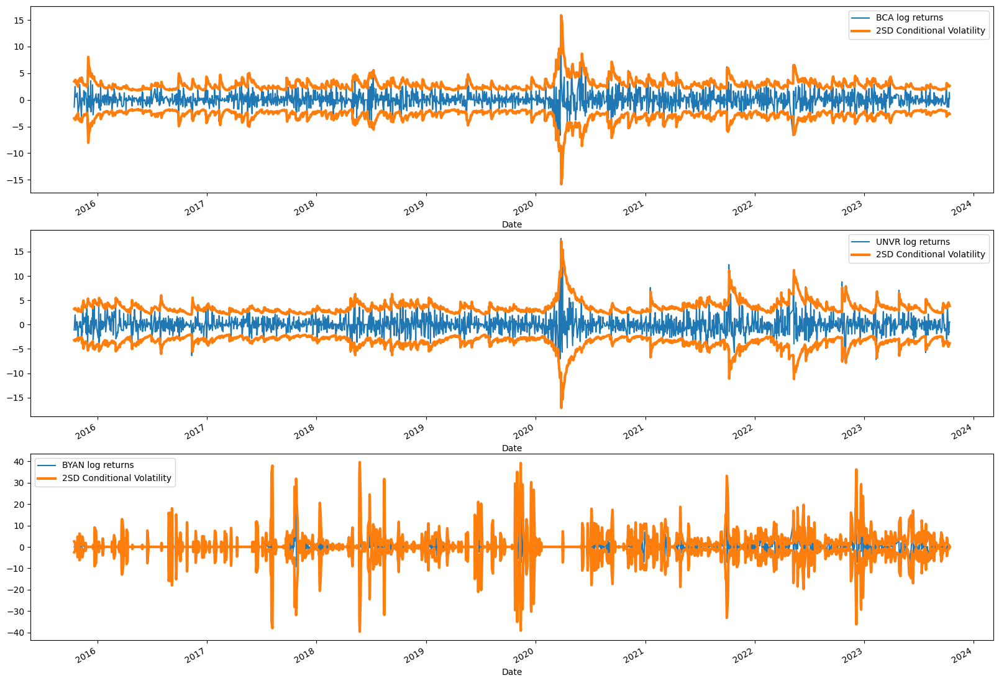

In [ ]:
fig, ax = plt.subplots(3,1,figsize=(20, 15))
#plt.plot(data.index, data['10 day forward Volatility'])
plt.subplot(3, 1, 1)
plt.plot(BCA['log return'])
(2*BCAgarch11_fit.conditional_volatility).plot(color = 'C1', linewidth = 3)
(-2*BCAgarch11_fit.conditional_volatility).plot(color = 'C1', linewidth = 3)
plt.legend(['BCA log returns', '2SD Conditional Volatility']);

plt.subplot(3, 1, 2)
plt.plot(UNVR['log return'])
(2*UNVRgarch12_fit.conditional_volatility).plot(color = 'C1', linewidth = 3)
(-2*UNVRgarch12_fit.conditional_volatility).plot(color = 'C1', linewidth = 3)
plt.legend(['UNVR log returns', '2SD Conditional Volatility']);

plt.subplot(3, 1, 3)
plt.plot(BYAN['log return'])
(2*BYANgarch21_fit.conditional_volatility).plot(color = 'C1', linewidth = 3)
(-2*BYANgarch21_fit.conditional_volatility).plot(color = 'C1', linewidth = 3)
plt.legend(['BYAN log returns', '2SD Conditional Volatility']);

From the above figure, it can be seen that the conditional volatility of each model is able to follow the patterns observed in the original stock data.

## Predicting Stock Volatility using GARCH
***

Our aim is to predict stock price volatility, and to do so, we'll create a "10-day volatility" feature that captures the rolling volatility over a 10-day period through log returns. Following this, we'll evaluate how well the GARCH model performs in comparison to this new feature. Specifically, we will forecast the volatility of the last 10% portion of the log return feature using the GARCH model. Afterward, we'll gauge the accuracy of these predictions by comparing them with the corresponding segment of the "10-day volatility" feature.

<ipython-input-48-ae37234c86c3>:19: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



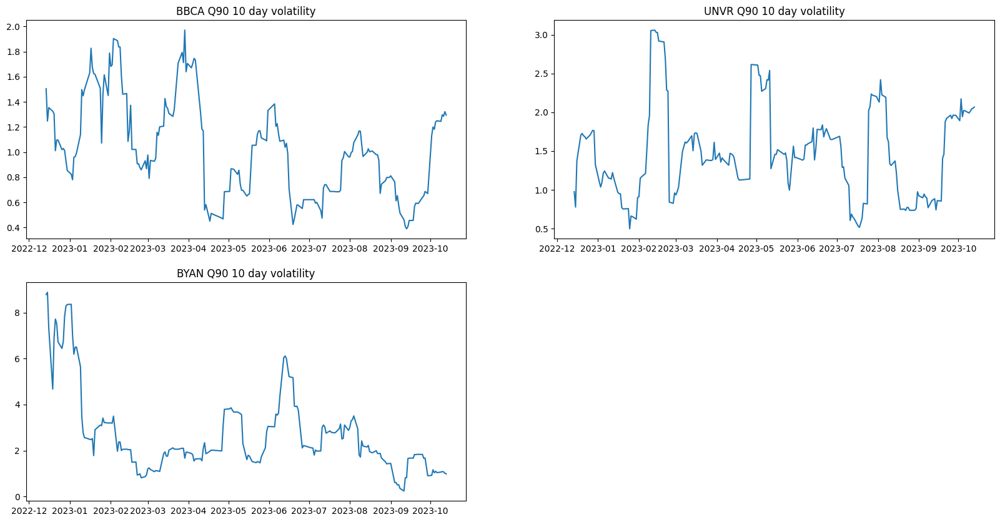

In [ ]:
BCAgarch = BCA.copy()
UNVRgarch = UNVR.copy()
BYANgarch = BYAN.copy()

BCAgarch['10 day volatility'] = BCAgarch['log return'].rolling(window=10).std()
BCAgarch = BCAgarch.dropna()
UNVRgarch['10 day volatility'] = UNVRgarch['log return'].rolling(window=10).std()
UNVRgarch = UNVRgarch.dropna()
BYANgarch['10 day volatility'] = BYANgarch['log return'].rolling(window=10).std()
BYANgarch = BYANgarch.dropna()

q_90 = int(len(BCAgarch) * .9)

BCA_test = BCAgarch[q_90:]
UNVR_test = UNVRgarch[q_90:]
BYAN_test = BYANgarch[q_90:]

fig, ax = plt.subplots(figsize = (20,10))
plt.subplot(2,2,1)
plt.plot(BCA_test['10 day volatility'])
plt.title('BBCA Q90 10 day volatility')

plt.subplot(2,2,2)
plt.plot(UNVR_test['10 day volatility'])
plt.title('UNVR Q90 10 day volatility')

plt.subplot(2,2,3)
plt.plot(BYAN_test['10 day volatility'])
plt.title('BYAN Q90 10 day volatility');

In [ ]:
BCA_predictions = []
UNVR_predictions = []
BYAN_predictions = []
test_size = len(BCAgarch) - q_90

for i in range(test_size):
    # Create test data
    BCA_train = BCAgarch.iloc[: -(test_size - i)]
    UNVR_train = UNVRgarch.iloc[: -(test_size - i)]
    BYAN_train = BYANgarch.iloc[: -(test_size - i)]

    # Train model
    BCAmodel = arch.arch_model(BCA_train['log return'],dist = 't', vol = 'GARCH', p=1, q=1, rescale = False)
    BCAmodel_fit = BCAmodel.fit(disp='off', show_warning = False)

    UNVRmodel = arch.arch_model(UNVR_train['log return'],dist = 't', vol = 'GARCH', p=1, q=2, rescale = False)
    UNVRmodel_fit = UNVRmodel.fit(disp='off', show_warning = False)

    BYANmodel = arch.arch_model(BYAN_train['log return'],dist = 'GED', vol = 'GARCH', p=1, q=2, rescale = False)
    BYANmodel_fit = BYANmodel.fit(disp='off', show_warning = False)

    # Generate next prediction (volatility, not variance)
    BCA_next_pred = BCAmodel_fit.forecast(horizon=1, reindex=False).variance.iloc[0,0] ** 0.5
    UNVR_next_pred = UNVRmodel_fit.forecast(horizon=1, reindex=False).variance.iloc[0,0] ** 0.5
    BYAN_next_pred = BYANmodel_fit.forecast(horizon=1, reindex=False).variance.iloc[0,0] ** 0.5

    # Append prediction to list
    BCA_predictions.append(BCA_next_pred)
    UNVR_predictions.append(UNVR_next_pred)
    BYAN_predictions.append(BYAN_next_pred)

BCA_predictions = pd.Series(BCA_predictions, index = BCAgarch.tail(test_size).index)
UNVR_predictions = pd.Series(UNVR_predictions, index = UNVRgarch.tail(test_size).index)
BYAN_predictions = pd.Series(BYAN_predictions, index = BYANgarch.tail(test_size).index)

<ipython-input-214-7d7576384118>:2: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



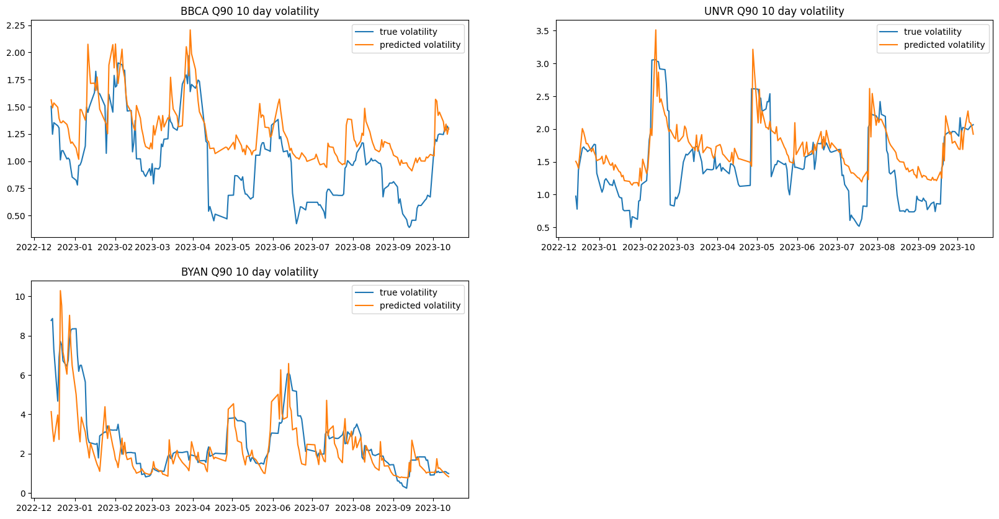

In [ ]:
fig, ax = plt.subplots(figsize = (20,10))
plt.subplot(2,2,1)
plt.plot(BCA_test['10 day volatility'])
plt.plot(BCA_predictions)
plt.legend(['true volatility', 'predicted volatility'])
plt.title('BBCA Q90 10 day volatility')

plt.subplot(2,2,2)
plt.plot(UNVR_test['10 day volatility'])
plt.plot(UNVR_predictions)
plt.legend(['true volatility', 'predicted volatility'])
plt.title('UNVR Q90 10 day volatility')

plt.subplot(2,2,3)
plt.plot(BYAN_test['10 day volatility'])
plt.plot(BYAN_predictions)
plt.legend(['true volatility', 'predicted volatility'])
plt.title('BYAN Q90 10 day volatility');

In [ ]:
BCAgarch_test_mae = mean_absolute_error(BCA_test['10 day volatility'], BCA_predictions)
BCAgarch_test_rmse = np.sqrt(mean_squared_error(BCA_test['10 day volatility'], BCA_predictions))
BCAgarch_test_mape = mean_absolute_percentage_error(BCA_test['10 day volatility'], BCA_predictions)


UNVRgarch_test_mae = mean_absolute_error(UNVR_test['10 day volatility'], UNVR_predictions)
UNVRgarch_test_rmse = np.sqrt(mean_squared_error(UNVR_test['10 day volatility'], UNVR_predictions))
UNVRgarch_test_mape = mean_absolute_percentage_error(UNVR_test['10 day volatility'], UNVR_predictions)

BYANgarch_test_mae = mean_absolute_error(BYAN_test['10 day volatility'], BYAN_predictions)
BYANgarch_test_rmse = np.sqrt(mean_squared_error(BYAN_test['10 day volatility'], BYAN_predictions))
BYANgarch_test_mape = mean_absolute_percentage_error(BYAN_test['10 day volatility'], BYAN_predictions)

print("Validation MAE for BBCA Prediction: {}".format(BCAgarch_test_mae))
print("Validation RMSE for BBCA Prediction: {}".format(BCAgarch_test_rmse))
print("Validation MAPE for BBCA Prediction: {}".format(BCAgarch_test_mape))
print('\n')
print("Validation MAE for UNVR Prediction: {}".format(UNVRgarch_test_mae))
print("Validation RMSE for UNVR Prediction: {}".format(UNVRgarch_test_rmse))
print("Validation MAPE for UNVR Prediction: {}".format(UNVRgarch_test_mape))
print('\n')
print("Validation MAE for BYAN Prediction: {}".format(BYANgarch_test_mae))
print("Validation RMSE for BYAN Prediction: {}".format(BYANgarch_test_rmse))
print("Validation MAPE for BYAN Prediction: {}".format(BYANgarch_test_mape))

Validation MAE for BBCA Prediction: 0.28645151022564896
Validation RMSE for BBCA Prediction: 0.3297488940987975
Validation MAPE for BBCA Prediction: 0.37328795406623616


Validation MAE for UNVR Prediction: 0.34881820060766155
Validation RMSE for UNVR Prediction: 0.4235553595471676
Validation MAPE for UNVR Prediction: 0.3181450858194816


Validation MAE for BYAN Prediction: 0.7776386320384676
Validation RMSE for BYAN Prediction: 1.1990151814579024
Validation MAPE for BYAN Prediction: 0.2710199674651019


## Value at Risk using GARCH
***

__Value at Risk (VaR)__ is a widely used financial risk management metric that quantifies the potential loss of a portfolio or investment over a specific time horizon at a given confidence level. It provides an estimate, typically expressed as a monetary amount, of the maximum loss that a portfolio may experience within a specified confidence interval. VaR is calculated based on various methodologies, with a common formula assuming a normal distribution of returns. However, more advanced techniques, including historical simulation and Monte Carlo simulation, are employed for portfolios with complex structures or when dealing with non-normal distributions. VaR is an essential tool for assessing and managing downside risk, although it has limitations and is often complemented by other risk measures in comprehensive risk management practices.

The VaR formula assuming a normal distribution is as follows:
$$VaR^{\alpha}_{t+1} = \mu_{t+1} + \sigma_{t+1}Z(\alpha)$$
where $\alpha$ denotes the confidence interval, $\mu$ denotes the mean, $\sigma$ denotes the volatility, and $Z(\alpha)$ denotes the standardized normal distribution quantile.

However, as stated earlier, we will not be assuming normal distribution for the log returns, instead we'll be using the student's t distribution. Assuming a normal distribution for stock returns when calculating Value at Risk (VaR) can lead to inaccurate risk estimates, primarily because financial markets exhibit characteristics such as fat tails, volatility clustering, and skewness that deviate from normality. The Student's t-distribution is often preferred for VaR calculations as it accommodates these features more effectively. With heavier tails, the t-distribution better captures the likelihood of extreme events, which are more common in financial markets. It also provides flexibility in modeling changing volatility regimes and is less sensitive to outliers, enhancing its suitability for risk assessments in dynamic and unpredictable market conditions. Nonetheless, accurate estimation of the degrees of freedom parameter in the t-distribution is crucial for ensuring the reliability of risk estimates.

The Student t distribution is formally given by its pdf:
$$ f_{\nu}(x) = \sqrt{\nu\pi}\Gamma(\frac{\nu}{2})^{-1}\Gamma(\frac{\nu+1}{2})(1+\nu^{-1}x^{2})^{-(\nu+1)/2} $$

Where $\Gamma$ represents the gamma function and $\nu$ denotes the degrees of freedom. For $\nu$ > 2, the variance for $X$ is given by $\frac{\nu}{\nu - 2}$, and the distribution has a finite excess kurtosis of $\frac{6}{\nu-4}$ for $\nu$ > 4. Notably, as $\nu$ approaches infinity, the Student t probability density function (pdf) converges to the Normal pdf. It is improbable to have large values of $\nu$ for the fitted Student t pdf in the case of daily financial asset returns unless the Normal distribution is the most suitable model, which is achievable for very large samples.

The q-quantile of the Student t distribution ($\mu$ = 0 and $\sigma$ = 1) is obtained through pdf integration, often denoted as $ \mu + \sqrt{\frac{\nu - 2}{\nu}}t^{-1}_{\nu}(\alpha)\sigma $ where $t^{-1}_{\nu}$ is the percent point function of the t distribution. Considering the practical scenario of dealing with random variables of the form $ X = \mu + \sigma T$, where $X$ describes the asset return as a transformation of the standardized Student t random variable, we formally define the Student t VaR as follows:
$$ VaR= \mu + \sqrt{\frac{\nu-2}{\nu}}t^{-1}_{\nu}(\alpha)\sigma  $$
In this study, we will be using $\alpha$ of 1%, 5%, and 10%.

In [ ]:
#alpha = 0.05
#dx = 0.0001  # resolution
#x = np.arange(-0.1, 0.1, dx)
#parm = t.fit(BCAgarch['log return'][:q_90])
#nu, mu_t, sig_t = parm
#pdf2 = t.pdf(x, nu, mu_t, sig_t)
#print("Integral t.pdf(x; mu, sig) dx = %.2f" % (np.sum(pdf2*dx)))
#print("nu = %.2f" % nu)

In [ ]:
alpha = [0.01, 0.05, 0.1]
BCA_VaR_garch = pd.DataFrame(index = BCAgarch.tail(test_size).index, columns = ['1%', '5%', '10%'] )
UNVR_VaR_garch = pd.DataFrame(index = UNVRgarch.tail(test_size).index, columns = ['1%', '5%', '10%'] )
BYAN_VaR_garch = pd.DataFrame(index = BYANgarch.tail(test_size).index, columns = ['1%', '5%', '10%'] )
for i in range(test_size):
    BCA_nu, _, _ = t.fit(BCAgarch[:q_90+i]['log return'])
    UNVR_nu, _, _ = t.fit(UNVRgarch[:q_90+i]['log return'])
    BYAN_nu, _ = norm.fit(BYANgarch[:q_90+i]['log return'])

    #test = t.ppf(alpha, nu) * BCA_predictions[i] + BCAgarch[:q_90+i]['log return'].mean()
    #test = norm.ppf(0.05) * BCA_predictions[i] + BCAgarch[:q_90+i]['log return'].mean()
    for j in range(len(alpha)):
        BCA_VaR_garch.iloc[i,j] = ((BCA_nu-2)/BCA_nu)**0.5 * t.ppf(alpha[j], BCA_nu) * BCA_predictions[i] + BCAgarch[:q_90+i]['log return'].mean()
        UNVR_VaR_garch.iloc[i,j] = ((UNVR_nu-2)/UNVR_nu)**0.5 * t.ppf(alpha[j], UNVR_nu) * UNVR_predictions[i] + UNVRgarch[:q_90+i]['log return'].mean()
        # BYAN_VaR_garch.iloc[i,j] = ((BYAN_nu-2)/BYAN_nu)**0.5 * t.ppf(alpha[j], BYAN_nu) * BYAN_predictions[i] + BYANgarch[:q_90+i]['log return'].mean()
        BYAN_VaR_garch.iloc[i,j] = norm.ppf(alpha[j], BYAN_nu) * BYAN_predictions[i] + BYANgarch[:q_90+i]['log return'].mean()

<ipython-input-211-86381f41166d>:15: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



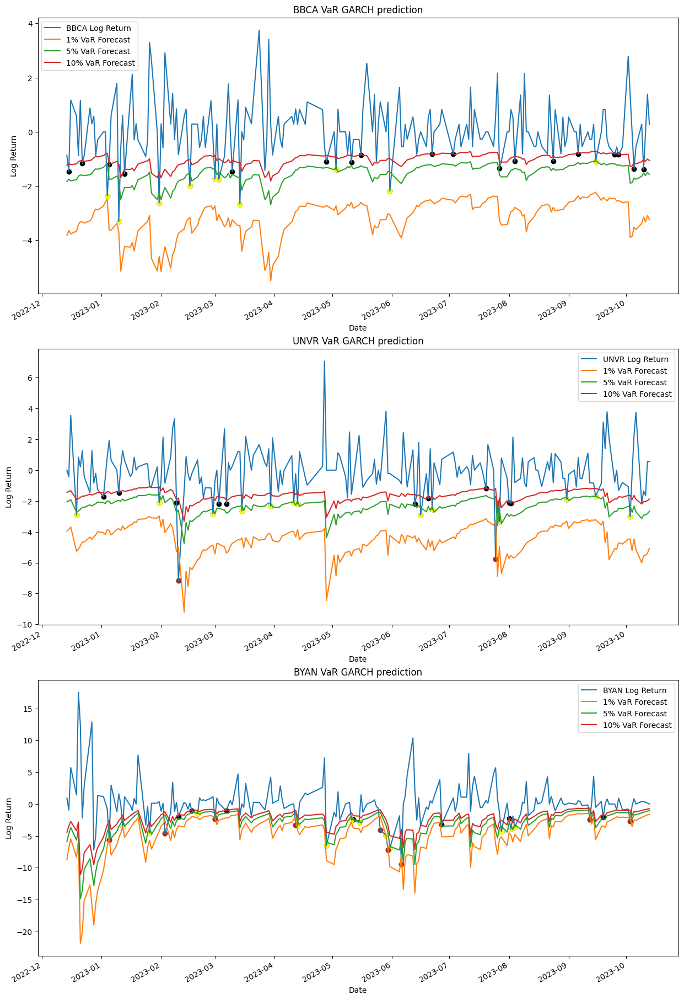

In [ ]:
BCA_failed1 = BCA_test[BCA_test['log return'] < BCA_VaR_garch['1%']]['log return']
BCA_failed5 = BCA_test[BCA_test['log return'] < BCA_VaR_garch['5%']]['log return']
BCA_failed10 = BCA_test[BCA_test['log return'] < BCA_VaR_garch['10%']]['log return']

UNVR_failed1 = UNVR_test[UNVR_test['log return'] < UNVR_VaR_garch['1%']]['log return']
UNVR_failed5 = UNVR_test[UNVR_test['log return'] < UNVR_VaR_garch['5%']]['log return']
UNVR_failed10 = UNVR_test[UNVR_test['log return'] < UNVR_VaR_garch['10%']]['log return']

BYAN_failed1 = BYAN_test[BYAN_test['log return'] < BYAN_VaR_garch['1%']]['log return']
BYAN_failed5 = BYAN_test[BYAN_test['log return'] < BYAN_VaR_garch['5%']]['log return']
BYAN_failed10 = BYAN_test[BYAN_test['log return'] < BYAN_VaR_garch['10%']]['log return']

plt.subplots(figsize = (15,25))

plt.subplot(3,1,1)
BCA_test['log return'].plot(ylabel = 'Log Return')
BCA_VaR_garch['1%'].plot()
BCA_VaR_garch['5%'].plot()
BCA_VaR_garch['10%'].plot()
plt.legend(['BBCA Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(BCA_failed10.index, BCA_failed10.values, color='black')
plt.scatter(BCA_failed5.index, BCA_failed5.values, color='yellow')
plt.scatter(BCA_failed1.index, BCA_failed1.values, color='brown')
plt.title('BBCA VaR GARCH prediction')

plt.subplot(3,1,2)
UNVR_test['log return'].plot(ylabel = 'Log Return')
UNVR_VaR_garch['1%'].plot()
UNVR_VaR_garch['5%'].plot()
UNVR_VaR_garch['10%'].plot()
plt.legend(['UNVR Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(UNVR_failed10.index, UNVR_failed10.values, color='black')
plt.scatter(UNVR_failed5.index, UNVR_failed5.values, color='yellow')
plt.scatter(UNVR_failed1.index, UNVR_failed1.values, color='brown')
plt.title('UNVR VaR GARCH prediction')

plt.subplot(3,1,3)
BYAN_test['log return'].plot(ylabel = 'Log Return')
BYAN_VaR_garch['1%'].plot()
BYAN_VaR_garch['5%'].plot()
BYAN_VaR_garch['10%'].plot()
plt.legend(['BYAN Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(BYAN_failed10.index, BYAN_failed10.values, color='black')
plt.scatter(BYAN_failed5.index, BYAN_failed5.values, color='yellow')
plt.scatter(BYAN_failed1.index, BYAN_failed1.values, color='brown')
plt.title('BYAN VaR GARCH prediction');

In [ ]:
overexceedgarch = {'BCA': [BCA_failed1.value_counts().sum(), BCA_failed5.value_counts().sum(), BCA_failed10.value_counts().sum()],
              'UNVR': [UNVR_failed1.value_counts().sum(), UNVR_failed5.value_counts().sum(), UNVR_failed10.value_counts().sum()],
              'BYAN': [BYAN_failed1.value_counts().sum(), BYAN_failed5.value_counts().sum(), BYAN_failed10.value_counts().sum()]
}

overexceed_garch = pd.DataFrame(overexceedgarch, index = ['1%', '5%', '10%'])
overexceed_garch

,BCA,UNVR,BYAN
1%,0,2,9
5%,10,15,21
10%,28,25,28


In [ ]:
(1 - (overexceed_garch/len(BCA_test)))*100

,BCA,UNVR,BYAN
1%,100.000000,98.994975,95.477387
5%,94.974874,92.462312,89.447236
10%,85.929648,87.437186,85.929648


# III. Univariate LSTM
***
***

In Time Series Analysis, two key concepts are at play for
feature selection, they area Univariate and Multivariate Prediction. Univariate Prediction involves forecasting a target
variable using its own historical data, while Multivariate Prediction considers multiple variables beyond the target. Univariate's strength lies in its simplicity and efficiency, but it neglects external factors that may impact predictions . In
contrast, Multivariate Prediction leverages a variety of data for potentially more accurate forecasts due to a deeper
understanding of complex variable relationships. However, it's more complex and data-intensive.

In the LSTM models, we will employ both Univariate and Multivariate features to forecast stock price volatility. In the case of Univariate prediction, our input and target variable will solely consist of the '10-day volatility' feature.

In [ ]:
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping

<ipython-input-77-9558c9ca066f>:13: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



Text(0.5, 1.0, 'BYAN 10 day volatility')

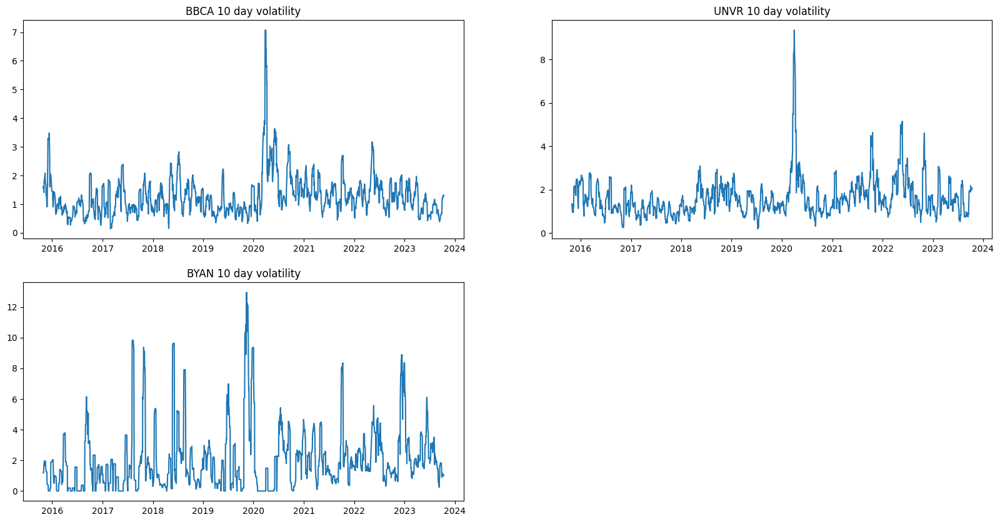

In [ ]:
BCA_uni = BCA.copy()
UNVR_uni = UNVR.copy()
BYAN_uni = BYAN.copy()

BCA_uni['10 day volatility'] = BCA_uni['log return'].rolling(window=10).std()
BCA_uni = BCA_uni.dropna()
UNVR_uni['10 day volatility'] = UNVR_uni['log return'].rolling(window=10).std()
UNVR_uni = UNVR_uni.dropna()
BYAN_uni['10 day volatility'] = BYAN_uni['log return'].rolling(window=10).std()
BYAN_uni = BYAN_uni.dropna()

fig, ax = plt.subplots(figsize = (20,10))
plt.subplot(2,2,1)
plt.plot(BCA_uni['10 day volatility'])
plt.title('BBCA 10 day volatility')

plt.subplot(2,2,2)
plt.plot(UNVR_uni['10 day volatility'])
plt.title('UNVR 10 day volatility')

plt.subplot(2,2,3)
plt.plot(BYAN_uni['10 day volatility'])
plt.title('BYAN 10 day volatility')

In the cell below, we create a function that produces a windowed dataframe containing sequences of 6 days of the '10-day volatility' feature, where the 6th day serves as our target variable.

In [ ]:
def windowed_df(data, n):
    data_as_np = data.to_numpy()
    l = data.shape[0]
    dates = []
    X, Y = [], []
    for i in range(n, l):
        indexes = data.index[i-n:i+1]
        data_subset = data.loc[indexes]
        values = data_subset['10 day volatility'].to_numpy()
        x, y = values[:-1], values[-1]
        dates.append(indexes[-1])
        X.append(x)
        Y.append(y)

    ret_df = pd.DataFrame({})
    ret_df['Target Date'] = dates
    X = np.array(X)
    for i in range(0, n):
        X[:, i]
        ret_df[f'Target-{n-i}'] = X[:, i]

    ret_df['Target'] = Y
    return ret_df

In [ ]:
BCA_windowed = windowed_df(BCA_uni, 5)
UNVR_windowed = windowed_df(UNVR_uni, 5)
BYAN_windowed = windowed_df(BYAN_uni, 5)
BCA_windowed

,Target Date,Target-5,Target-4,Target-3,Target-2,Target-1,Target
0,2015-11-05,1.559104,1.627417,1.407425,1.718832,1.824014,1.838454
1,2015-11-06,1.627417,1.407425,1.718832,1.824014,1.838454,1.831842
2,2015-11-09,1.407425,1.718832,1.824014,1.838454,1.831842,2.032625
3,2015-11-10,1.718832,1.824014,1.838454,1.831842,2.032625,2.057551
4,2015-11-11,1.824014,1.838454,1.831842,2.032625,2.057551,2.078519
...,...,...,...,...,...,...,...
1973,2023-10-09,1.130581,1.200054,1.181731,1.241945,1.249824,1.244855
1974,2023-10-10,1.200054,1.181731,1.241945,1.249824,1.244855,1.296590
1975,2023-10-11,1.181731,1.241945,1.249824,1.244855,1.296590,1.285913
1976,2023-10-12,1.241945,1.249824,1.244855,1.296590,1.285913,1.322246


In [ ]:
def windowed_df_to_date_X_y(windowed_dataframe):
    df_as_np = windowed_dataframe.to_numpy()
    dates = df_as_np[:, 0]

    middle_matrix = df_as_np[:, 1:-1]
    X = middle_matrix.reshape((len(dates), middle_matrix.shape[1], 1))

    Y = df_as_np[:, -1]
    return dates, X.astype(np.float32), Y.astype(np.float32)

BCA_dates, BCA_X, BCA_y = windowed_df_to_date_X_y(BCA_windowed)
UNVR_dates, UNVR_X, UNVR_y = windowed_df_to_date_X_y(UNVR_windowed)
BYAN_dates, BYAN_X, BYAN_y = windowed_df_to_date_X_y(BYAN_windowed)

BCA_dates.shape, BCA_X.shape, BCA_y.shape

((1978,), (1978, 5, 1), (1978,))

We will split our data as follows: 80% for training, 10% for validation, and 10% for testing.

<ipython-input-81-1cbc3ea2858b>:19: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



((1582,), (1582, 5, 1), (1582,))

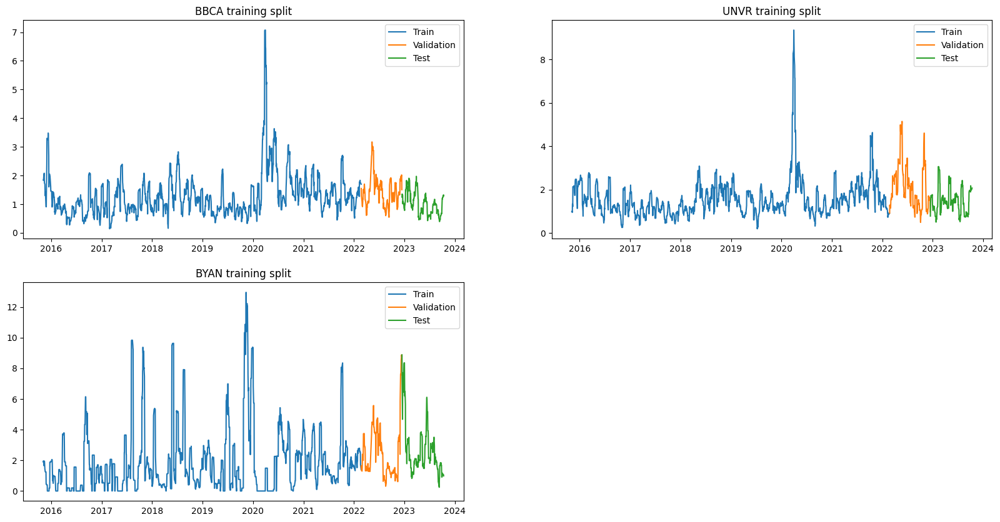

In [ ]:
Uq_80 = int(len(BCA_dates) * .8)
Uq_90 = int(len(BCA_dates) * .9)

BCA_dates_train, BCA_X_train, BCA_y_train = BCA_dates[:Uq_80], BCA_X[:Uq_80], BCA_y[:Uq_80]
UNVR_dates_train, UNVR_X_train, UNVR_y_train = UNVR_dates[:Uq_80], UNVR_X[:Uq_80], UNVR_y[:Uq_80]
BYAN_dates_train, BYAN_X_train, BYAN_y_train = BYAN_dates[:Uq_80], BYAN_X[:Uq_80], BYAN_y[:Uq_80]


BCA_dates_val, BCA_X_val, BCA_y_val = BCA_dates[Uq_80:Uq_90], BCA_X[Uq_80:Uq_90], BCA_y[Uq_80:Uq_90]
UNVR_dates_val, UNVR_X_val, UNVR_y_val = UNVR_dates[Uq_80:Uq_90], UNVR_X[Uq_80:Uq_90], UNVR_y[Uq_80:Uq_90]
BYAN_dates_val, BYAN_X_val, BYAN_y_val = BYAN_dates[Uq_80:Uq_90], BYAN_X[Uq_80:Uq_90], BYAN_y[Uq_80:Uq_90]


BCA_dates_test, BCA_X_test, BCA_y_test = BCA_dates[Uq_90:], BCA_X[Uq_90:], BCA_y[Uq_90:]
UNVR_dates_test, UNVR_X_test, UNVR_y_test = UNVR_dates[Uq_90:], UNVR_X[Uq_90:], UNVR_y[Uq_90:]
BYAN_dates_test, BYAN_X_test, BYAN_y_test = BYAN_dates[Uq_90:], BYAN_X[Uq_90:], BYAN_y[Uq_90:]

fig, ax = plt.subplots(figsize = (20,10))
plt.subplot(2,2,1)
plt.plot(BCA_dates_train, BCA_y_train)
plt.plot(BCA_dates_val, BCA_y_val)
plt.plot(BCA_dates_test, BCA_y_test)
plt.legend(['Train', 'Validation', 'Test'])
plt.title('BBCA training split')

plt.subplot(2,2,2)
plt.plot(UNVR_dates_train, UNVR_y_train)
plt.plot(UNVR_dates_val, UNVR_y_val)
plt.plot(UNVR_dates_test, UNVR_y_test)
plt.legend(['Train', 'Validation', 'Test'])
plt.title('UNVR training split')

plt.subplot(2,2,3)
plt.plot(BYAN_dates_train, BYAN_y_train)
plt.plot(BYAN_dates_val, BYAN_y_val)
plt.plot(BYAN_dates_test, BYAN_y_test)
plt.legend(['Train', 'Validation', 'Test'])
plt.title('BYAN training split')


BCA_dates_train.shape, BCA_X_train.shape, BCA_y_train.shape

## Finding Best Univariate LSTM Model for BCA
***

We will fit several different univariate LSTM model to find the best model for predicting BCA stock price volatility. The model that will be tested are as follows:
- 1 LSTM layer, 1 Dense Layer
- 2 LSTM layer, 1 Dense Layer
- 1 LSTM layer, 2 Dense Layer
- 2 LSTM layer, 2 Dense Layer
- 3 LSTM layer, 3 Dense Layer

#### Define Early Stopping

In [ ]:
early_stopping = EarlyStopping(
    monitor = 'val_loss',
    min_delta=0.0001,
    patience=5,
    restore_best_weights=True,
)

### 1 LSTM 1 Dense

In [ ]:
BCAUnivariate11 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', input_shape = (5,1)),
    layers.Dense(1, activation = 'linear')
])

BCAUnivariate11.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

BCAUnivariate11.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 64)                16896     
                                                                 
 dense (Dense)               (None, 1)                 65        
                                                                 
Total params: 16961 (66.25 KB)
Trainable params: 16961 (66.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch 1/1000
50/50 [==============================] - 3s 20ms/step - loss: 1.2297 - mean_absolute_error: 0.7985 - val_loss: 0.2301 - val_mean_absolute_error: 0.3700
Epoch 2/1000
50/50 [==============================] - 1s 11ms/step - loss: 0.4754 - mean_absolute_error: 0.4742 - val_loss: 0.2184 - val_mean_absolute_error: 0.3567
Epoch 3/1000
50/50 [==============================] - 1s 10ms/step - loss: 0.4200 - mean_absolute_error: 0.4447 - val_loss: 0.1852 - val_mean_absolute_error: 0.3302
Epoch 4/1000
50/50 [==============================] - 1s 10ms/step - loss: 0.3681 - mean_absolute_error: 0.4154 - val_loss: 0.1639 - val_mean_absolute_error: 0.3097
Epoch 5/1000
50/50 [==============================] - 0s 5ms/step - loss: 0.3182 - mean_absolute_error: 0.3845 - val_loss: 0.1394 - val_mean_absolute_error: 0.2852
Epoch 6/1000
50/50 [==============================] - 0s 6ms/step - loss: 0.2662 - mean_absolute_error: 0.3489 - val_loss: 0.1171 - val_mean_absolute_error: 0.2606
Epoch 7/1000

<Axes: >

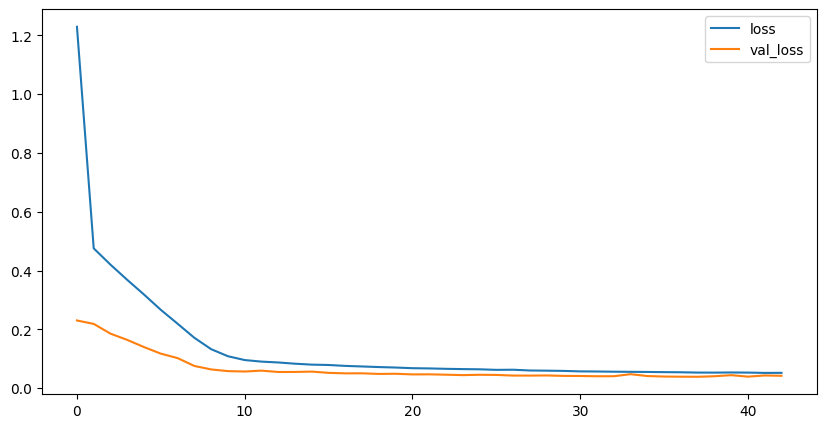

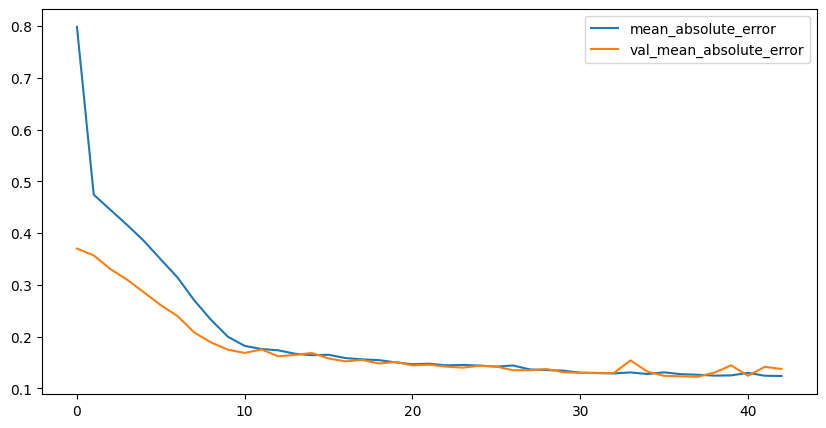

In [ ]:
BCAU11_history = BCAUnivariate11.fit(BCA_X_train, BCA_y_train, validation_data=(BCA_X_val, BCA_y_val), epochs=1000, callbacks = [early_stopping])

BCAU11_history_df = pd.DataFrame(BCAU11_history.history)
BCAU11_history_df.loc[:, ['loss', 'val_loss']].plot()
BCAU11_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BCAU11_test_predictions = BCAUnivariate11.predict(BCA_X_test).flatten()
BCAU11_test_mae = mean_absolute_error(BCA_y_test, BCAU11_test_predictions)
BCAU11_test_rmse = np.sqrt(mean_squared_error(BCA_y_test, BCAU11_test_predictions))
BCAU11_test_mape = mean_absolute_percentage_error(BCA_y_test, BCAU11_test_predictions)
BCAU11_test_mae, BCAU11_test_rmse, BCAU11_test_mape

7/7 [==============================] - 1s 4ms/step


(0.09112413, 0.1368601, 0.10222445)

### 2 LSTM 1 Dense

In [ ]:
BCAUnivariate21 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,1)),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(1, activation = 'linear')
])

BCAUnivariate21.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

BCAUnivariate21.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 5, 64)             16896     
                                                                 
 lstm_2 (LSTM)               (None, 64)                33024     
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 49985 (195.25 KB)
Trainable params: 49985 (195.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch 1/1000
50/50 [==============================] - 15s 45ms/step - loss: 0.6510 - mean_absolute_error: 0.5737 - val_loss: 0.2932 - val_mean_absolute_error: 0.4060
Epoch 2/1000
50/50 [==============================] - 1s 18ms/step - loss: 0.5142 - mean_absolute_error: 0.4917 - val_loss: 0.2719 - val_mean_absolute_error: 0.3888
Epoch 3/1000
50/50 [==============================] - 1s 24ms/step - loss: 0.3489 - mean_absolute_error: 0.4121 - val_loss: 0.1091 - val_mean_absolute_error: 0.2547
Epoch 4/1000
50/50 [==============================] - 1s 24ms/step - loss: 0.1677 - mean_absolute_error: 0.2797 - val_loss: 0.1180 - val_mean_absolute_error: 0.2608
Epoch 5/1000
50/50 [==============================] - 1s 23ms/step - loss: 0.1422 - mean_absolute_error: 0.2490 - val_loss: 0.0916 - val_mean_absolute_error: 0.2241
Epoch 6/1000
50/50 [==============================] - 1s 21ms/step - loss: 0.1369 - mean_absolute_error: 0.2472 - val_loss: 0.1119 - val_mean_absolute_error: 0.2558
Epoch 7/1

<Axes: >

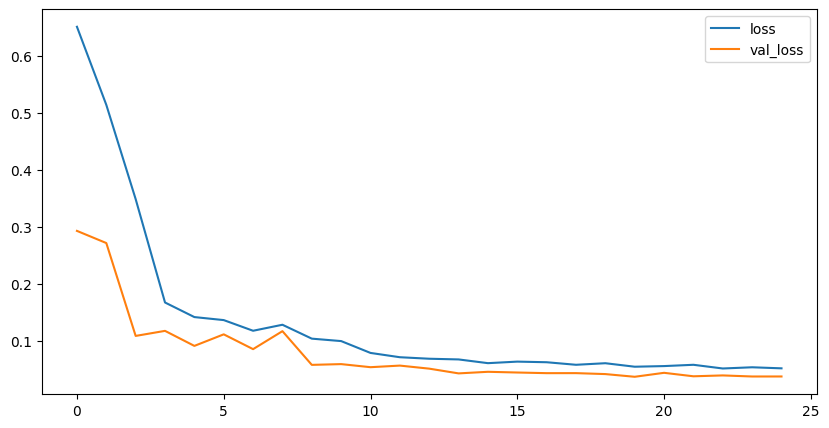

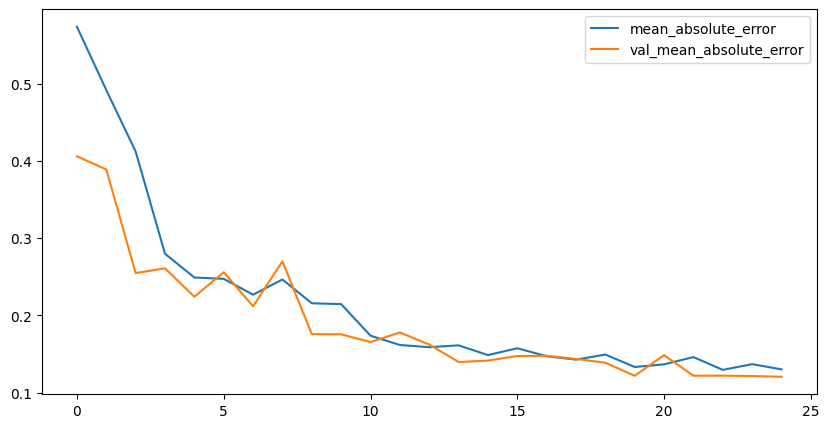

In [ ]:
BCAU21_history = BCAUnivariate21.fit(BCA_X_train, BCA_y_train, validation_data=(BCA_X_val, BCA_y_val), epochs=1000, callbacks = [early_stopping])

BCAU21_history_df = pd.DataFrame(BCAU21_history.history)
BCAU21_history_df.loc[:, ['loss', 'val_loss']].plot()
BCAU21_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BCAU21_test_predictions = BCAUnivariate21.predict(BCA_X_test).flatten()
BCAU21_test_mae = mean_absolute_error(BCA_y_test, BCAU21_test_predictions)
BCAU21_test_rmse = np.sqrt(mean_squared_error(BCA_y_test, BCAU21_test_predictions))
BCAU21_test_mape = mean_absolute_percentage_error(BCA_y_test, BCAU21_test_predictions)
BCAU21_test_mae, BCAU21_test_rmse, BCAU21_test_mape

7/7 [==============================] - 1s 7ms/step


(0.10560296, 0.1435834, 0.12438125)

### 1 LSTM 2 Dense

In [ ]:
BCAUnivariate12 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', input_shape = (5,1)),
    layers.Dense(32,activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

BCAUnivariate12.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

BCAUnivariate12.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 64)                16896     
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                                 
Total params: 19009 (74.25 KB)
Trainable params: 19009 (74.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch 1/1000
50/50 [==============================] - 10s 39ms/step - loss: 0.6021 - mean_absolute_error: 0.5354 - val_loss: 0.2221 - val_mean_absolute_error: 0.3620
Epoch 2/1000
50/50 [==============================] - 1s 14ms/step - loss: 0.4406 - mean_absolute_error: 0.4577 - val_loss: 0.1845 - val_mean_absolute_error: 0.3313
Epoch 3/1000
50/50 [==============================] - 1s 18ms/step - loss: 0.3484 - mean_absolute_error: 0.4035 - val_loss: 0.1607 - val_mean_absolute_error: 0.2986
Epoch 4/1000
50/50 [==============================] - 1s 16ms/step - loss: 0.2208 - mean_absolute_error: 0.3169 - val_loss: 0.0722 - val_mean_absolute_error: 0.2064
Epoch 5/1000
50/50 [==============================] - 0s 7ms/step - loss: 0.1012 - mean_absolute_error: 0.1967 - val_loss: 0.0623 - val_mean_absolute_error: 0.1865
Epoch 6/1000
50/50 [==============================] - 1s 12ms/step - loss: 0.0753 - mean_absolute_error: 0.1634 - val_loss: 0.0639 - val_mean_absolute_error: 0.1896
Epoch 7/10

<Axes: >

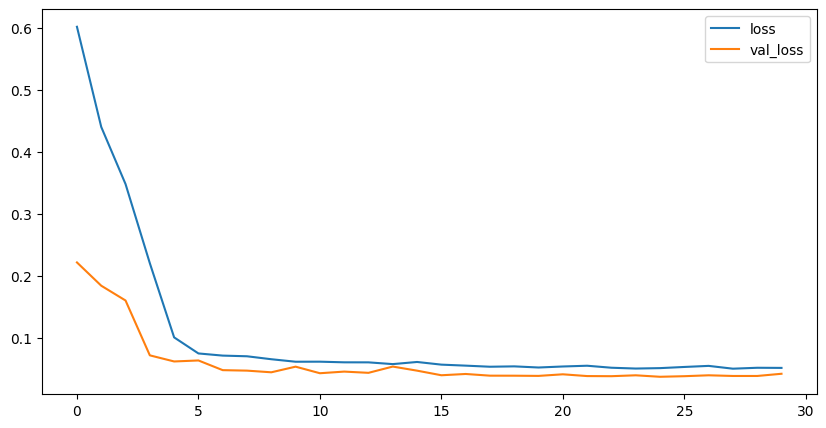

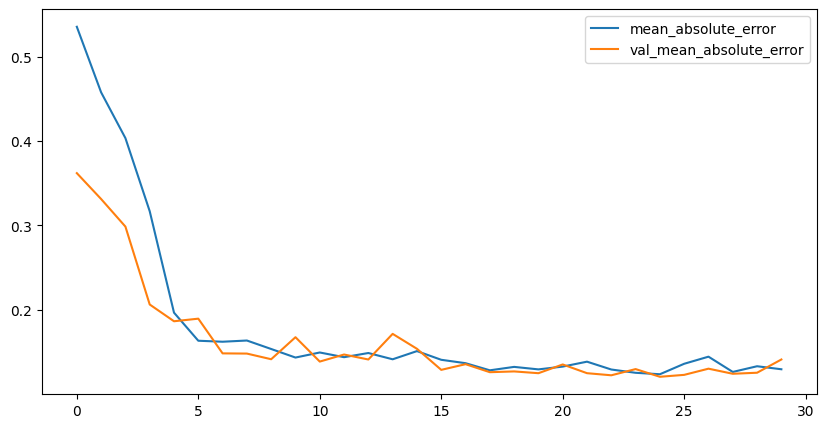

In [ ]:
BCAU12_history = BCAUnivariate12.fit(BCA_X_train, BCA_y_train, validation_data=(BCA_X_val, BCA_y_val), epochs=1000, callbacks = [early_stopping])

BCAU12_history_df = pd.DataFrame(BCAU12_history.history)
BCAU12_history_df.loc[:, ['loss', 'val_loss']].plot()
BCAU12_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BCAU12_test_predictions = BCAUnivariate12.predict(BCA_X_test).flatten()
BCAU12_test_mae = mean_absolute_error(BCA_y_test, BCAU12_test_predictions)
BCAU12_test_rmse = np.sqrt(mean_squared_error(BCA_y_test, BCAU12_test_predictions))
BCAU12_test_mape = mean_absolute_percentage_error(BCA_y_test, BCAU12_test_predictions)
BCAU12_test_mae, BCAU12_test_rmse, BCAU12_test_mape

7/7 [==============================] - 0s 13ms/step


(0.09370257, 0.13726051, 0.10605191)

### 2 LSTM 2 Dense

In [ ]:
BCAUnivariate22 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,1)),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(32,activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

BCAUnivariate22.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

BCAUnivariate22.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 5, 64)             16896     
                                                                 
 lstm_5 (LSTM)               (None, 64)                33024     
                                                                 
 dense_4 (Dense)             (None, 32)                2080      
                                                                 
 dense_5 (Dense)             (None, 1)                 33        
                                                                 
Total params: 52033 (203.25 KB)
Trainable params: 52033 (203.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch 1/1000
50/50 [==============================] - 10s 32ms/step - loss: 0.6471 - mean_absolute_error: 0.5627 - val_loss: 0.2768 - val_mean_absolute_error: 0.3959
Epoch 2/1000
50/50 [==============================] - 1s 10ms/step - loss: 0.4685 - mean_absolute_error: 0.4708 - val_loss: 0.1689 - val_mean_absolute_error: 0.3188
Epoch 3/1000
50/50 [==============================] - 0s 10ms/step - loss: 0.2242 - mean_absolute_error: 0.3159 - val_loss: 0.1242 - val_mean_absolute_error: 0.2684
Epoch 4/1000
50/50 [==============================] - 0s 9ms/step - loss: 0.1559 - mean_absolute_error: 0.2636 - val_loss: 0.1136 - val_mean_absolute_error: 0.2543
Epoch 5/1000
50/50 [==============================] - 0s 8ms/step - loss: 0.1403 - mean_absolute_error: 0.2460 - val_loss: 0.1135 - val_mean_absolute_error: 0.2576
Epoch 6/1000
50/50 [==============================] - 0s 8ms/step - loss: 0.1275 - mean_absolute_error: 0.2367 - val_loss: 0.1192 - val_mean_absolute_error: 0.2637
Epoch 7/1000

<Axes: >

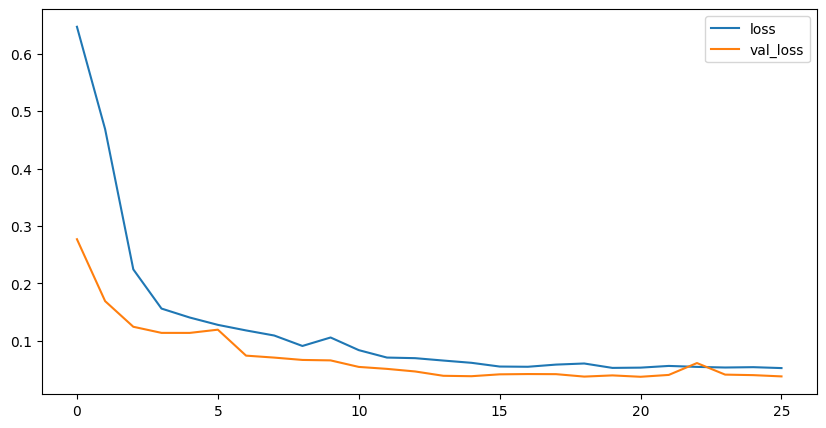

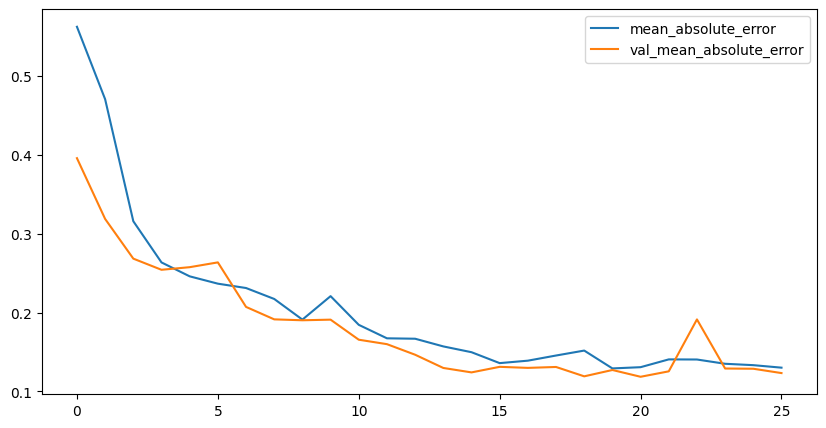

In [ ]:
BCAU22_history = BCAUnivariate22.fit(BCA_X_train, BCA_y_train, validation_data=(BCA_X_val, BCA_y_val), epochs=1000, callbacks = [early_stopping])

BCAU22_history_df = pd.DataFrame(BCAU22_history.history)
BCAU22_history_df.loc[:, ['loss', 'val_loss']].plot()
BCAU22_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BCAU22_test_predictions = BCAUnivariate22.predict(BCA_X_test).flatten()
BCAU22_test_mae = mean_absolute_error(BCA_y_test, BCAU22_test_predictions)
BCAU22_test_rmse = np.sqrt(mean_squared_error(BCA_y_test, BCAU22_test_predictions))
BCAU22_test_mape = mean_absolute_percentage_error(BCA_y_test, BCAU22_test_predictions)
BCAU22_test_mae, BCAU22_test_rmse, BCAU22_test_mape

7/7 [==============================] - 1s 4ms/step


(0.09496229, 0.13688941, 0.107022226)

### 3 LSTM 3 Dense

In [ ]:
BCAUnivariate33 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,1)),
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(64,activation = 'relu'),
    layers.Dense(32, activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

BCAUnivariate33.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

BCAUnivariate33.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 5, 64)             16896     
                                                                 
 lstm_7 (LSTM)               (None, 5, 64)             33024     
                                                                 
 lstm_8 (LSTM)               (None, 64)                33024     
                                                                 
 dense_6 (Dense)             (None, 64)                4160      
                                                                 
 dense_7 (Dense)             (None, 32)                2080      
                                                                 
 dense_8 (Dense)             (None, 1)                 33        
                                                                 
Total params: 89217 (348.50 KB)
Trainable params: 8921

Epoch 1/1000
50/50 [==============================] - 9s 49ms/step - loss: 0.7182 - mean_absolute_error: 0.5954 - val_loss: 0.2950 - val_mean_absolute_error: 0.4088
Epoch 2/1000
50/50 [==============================] - 1s 23ms/step - loss: 0.5502 - mean_absolute_error: 0.5103 - val_loss: 0.2787 - val_mean_absolute_error: 0.4000
Epoch 3/1000
50/50 [==============================] - 1s 29ms/step - loss: 0.5460 - mean_absolute_error: 0.5089 - val_loss: 0.2447 - val_mean_absolute_error: 0.3810
Epoch 4/1000
50/50 [==============================] - 1s 28ms/step - loss: 0.5065 - mean_absolute_error: 0.4935 - val_loss: 0.2051 - val_mean_absolute_error: 0.3477
Epoch 5/1000
50/50 [==============================] - 1s 24ms/step - loss: 0.2884 - mean_absolute_error: 0.3753 - val_loss: 0.1064 - val_mean_absolute_error: 0.2514
Epoch 6/1000
50/50 [==============================] - 1s 21ms/step - loss: 0.1591 - mean_absolute_error: 0.2667 - val_loss: 0.1135 - val_mean_absolute_error: 0.2517
Epoch 7/10

<Axes: >

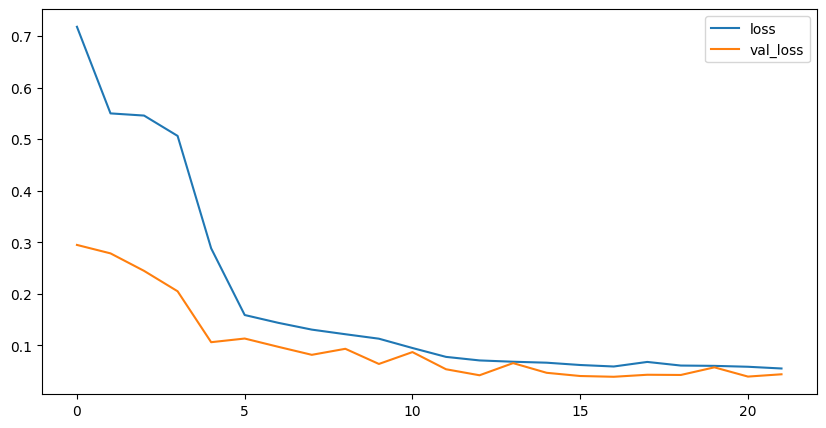

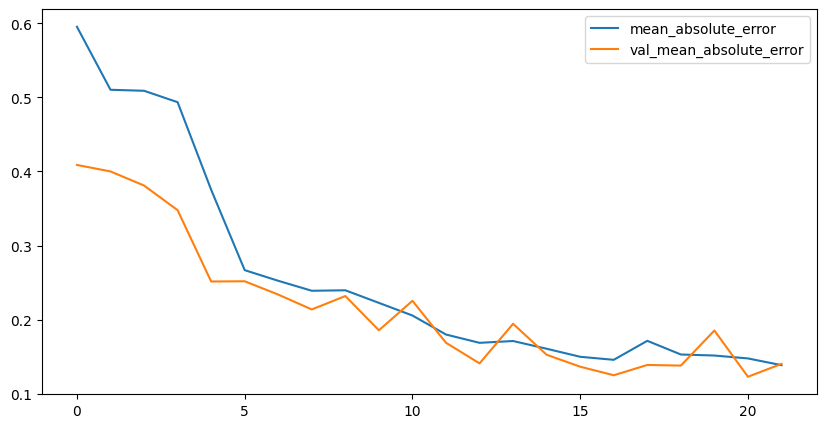

In [ ]:
BCAU33_history = BCAUnivariate33.fit(BCA_X_train, BCA_y_train, validation_data=(BCA_X_val, BCA_y_val), epochs=1000, callbacks = [early_stopping])

BCAU33_history_df = pd.DataFrame(BCAU33_history.history)
BCAU33_history_df.loc[:, ['loss', 'val_loss']].plot()
BCAU33_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BCAU33_test_predictions = BCAUnivariate33.predict(BCA_X_test).flatten()
BCAU33_test_mae = mean_absolute_error(BCA_y_test, BCAU33_test_predictions)
BCAU33_test_rmse = np.sqrt(mean_squared_error(BCA_y_test, BCAU33_test_predictions))
BCAU33_test_mape = mean_absolute_percentage_error(BCA_y_test, BCAU33_test_predictions)
BCAU33_test_mae, BCAU33_test_rmse, BCAU33_test_mape

7/7 [==============================] - 3s 6ms/step


(0.112678595, 0.14970951, 0.13765863)

### Evaluate

<ipython-input-99-812f59b592bf>:2: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



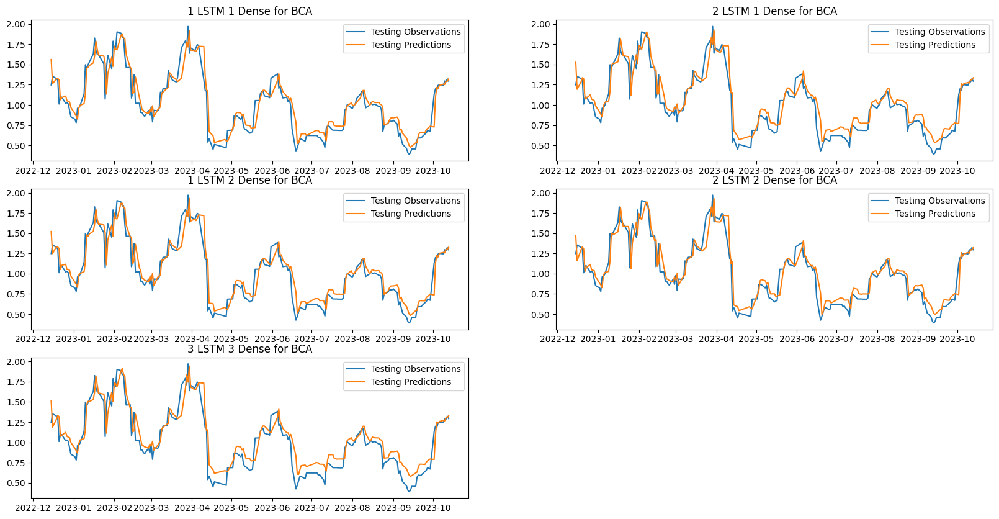

In [ ]:
fig, ax = plt.subplots(figsize = (20,10))
plt.subplot(3,2,1)
plt.plot(BCA_dates_test, BCA_y_test)
plt.plot(BCA_dates_test, BCAU11_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('1 LSTM 1 Dense for BCA')

plt.subplot(3,2,2)
plt.plot(BCA_dates_test, BCA_y_test)
plt.plot(BCA_dates_test, BCAU21_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('2 LSTM 1 Dense for BCA')

plt.subplot(3,2,3)
plt.plot(BCA_dates_test, BCA_y_test)
plt.plot(BCA_dates_test, BCAU12_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('1 LSTM 2 Dense for BCA')

plt.subplot(3,2,4)
plt.plot(BCA_dates_test, BCA_y_test)
plt.plot(BCA_dates_test, BCAU22_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('2 LSTM 2 Dense for BCA')

plt.subplot(3,2,5)
plt.plot(BCA_dates_test, BCA_y_test)
plt.plot(BCA_dates_test, BCAU33_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('3 LSTM 3 Dense for BCA');

In [ ]:
BCA_Eval = {'MAE': [BCAU11_test_mae, BCAU21_test_mae, BCAU12_test_mae, BCAU22_test_mae, BCAU33_test_mae],
            'RMSE': [BCAU11_test_rmse, BCAU21_test_rmse, BCAU12_test_rmse, BCAU22_test_rmse, BCAU33_test_rmse],
            'MAPE': [BCAU11_test_mape, BCAU21_test_mape, BCAU12_test_mape, BCAU22_test_mape, BCAU33_test_mape]
           }

BCA_Table = pd.DataFrame(BCA_Eval, index =['1 LSTM 1 Dense', '2 LSTM 1 Dense', '1 LSTM 2 Dense', '2 LSTM 2 Dense', '3 LSTM 3 Dense'])
BCA_Table

,MAE,RMSE,MAPE
1 LSTM 1 Dense,0.091124,0.136860,0.102224
2 LSTM 1 Dense,0.105603,0.143583,0.124381
1 LSTM 2 Dense,0.093703,0.137261,0.106052
2 LSTM 2 Dense,0.094962,0.136889,0.107022
3 LSTM 3 Dense,0.112679,0.149710,0.137659


<Axes: >

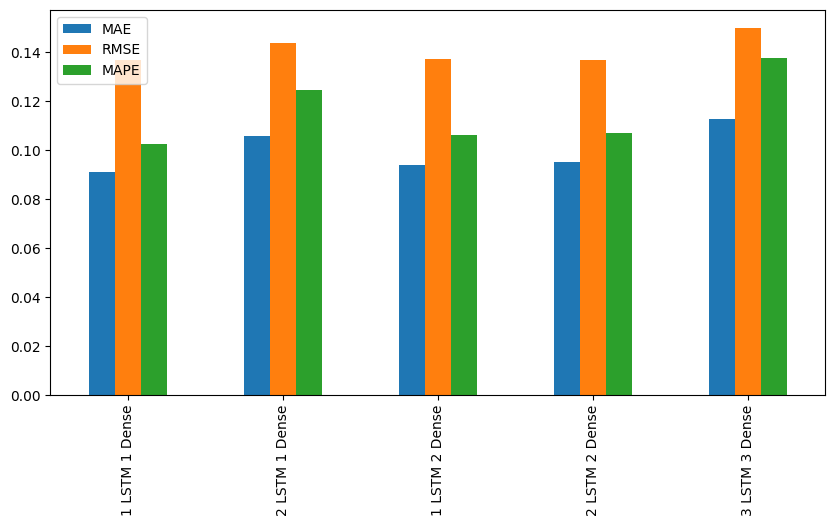

In [ ]:
BCA_Table.plot(kind = 'bar')

The MAE, RMSE, and MAPE results show that 1 LSTM layer and 1 Dense layer is the best Univariate model for BCA

In [ ]:
BCAUnivariate11.save("BCAUnivariate11.h5")
BCAUnivariate11.save("BCAUnivariate_11")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



In [ ]:
#BCAUnivariate11 = keras.models.load_model("BCAUnivariate11.h5")

## Finding Best Univariate LSTM model for UNVR
***

We will fit several different univariate LSTM model to find the best model for predicting UNVR stock prive volatility. The model that will be tested are as follows:
- 1 LSTM layer, 1 Dense Layer
- 2 LSTM layer, 1 Dense Layer
- 1 LSTM layer, 2 Dense Layer
- 2 LSTM layer, 2 Dense Layer
- 3 LSTM layer, 3 Dense Layer

### 1 LSTM 1 Dense

In [ ]:
UNVRUnivariate11 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', input_shape = (5,1)),
    layers.Dense(1, activation = 'linear')
])

UNVRUnivariate11.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 2s 10ms/step - loss: 0.7071 - mean_absolute_error: 0.5585 - val_loss: 1.0543 - val_mean_absolute_error: 0.7471
Epoch 2/100
50/50 [==============================] - 0s 5ms/step - loss: 0.5058 - mean_absolute_error: 0.4636 - val_loss: 0.7614 - val_mean_absolute_error: 0.6323
Epoch 3/100
50/50 [==============================] - 0s 5ms/step - loss: 0.3646 - mean_absolute_error: 0.3876 - val_loss: 0.4691 - val_mean_absolute_error: 0.4895
Epoch 4/100
50/50 [==============================] - 0s 5ms/step - loss: 0.2262 - mean_absolute_error: 0.2933 - val_loss: 0.2560 - val_mean_absolute_error: 0.3592
Epoch 5/100
50/50 [==============================] - 0s 5ms/step - loss: 0.1456 - mean_absolute_error: 0.2273 - val_loss: 0.2041 - val_mean_absolute_error: 0.3012
Epoch 6/100
50/50 [==============================] - 0s 6ms/step - loss: 0.1246 - mean_absolute_error: 0.2033 - val_loss: 0.2024 - val_mean_absolute_error: 0.2990
Epoch 7/100
50/50 [==

<Axes: >

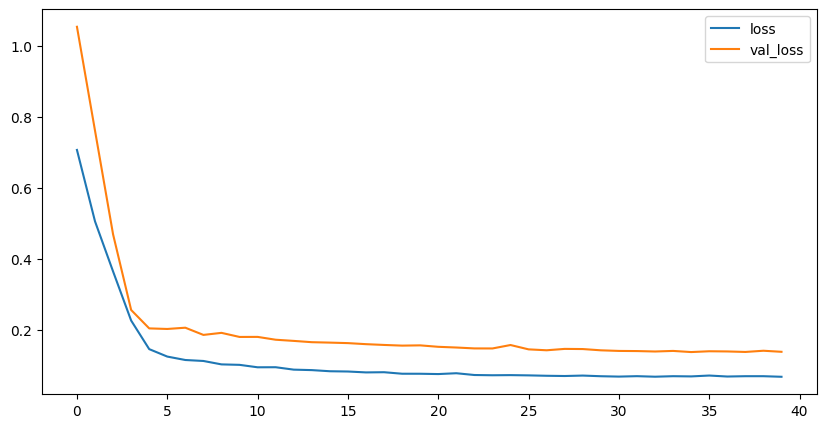

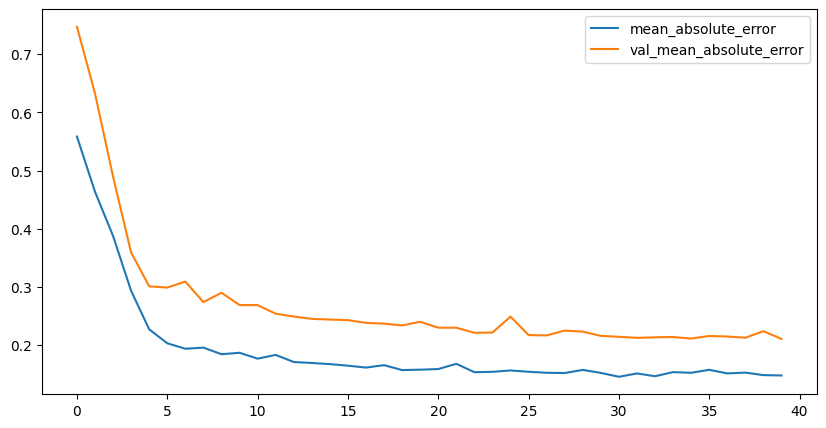

In [ ]:
UNVRU11_history = UNVRUnivariate11.fit(UNVR_X_train, UNVR_y_train, validation_data=(UNVR_X_val, UNVR_y_val), epochs=100, callbacks = [early_stopping])

UNVRU11_history_df = pd.DataFrame(UNVRU11_history.history)
UNVRU11_history_df.loc[:, ['loss', 'val_loss']].plot()
UNVRU11_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
UNVRU11_test_predictions = UNVRUnivariate11.predict(UNVR_X_test).flatten()
UNVRU11_test_mae = mean_absolute_error(UNVR_y_test, UNVRU11_test_predictions)
UNVRU11_test_rmse = np.sqrt(mean_squared_error(UNVR_y_test, UNVRU11_test_predictions))
UNVRU11_test_mape = mean_absolute_percentage_error(UNVR_y_test, UNVRU11_test_predictions)
UNVRU11_test_mae, UNVRU11_test_rmse, UNVRU11_test_mape

7/7 [==============================] - 0s 3ms/step


(0.14616466, 0.256113, 0.11830794)

### 2 LSTM 1 Dense

In [ ]:
UNVRUnivariate21 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,1)),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(1, activation = 'linear')
])

UNVRUnivariate21.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 6s 28ms/step - loss: 1.0901 - mean_absolute_error: 0.7183 - val_loss: 1.2117 - val_mean_absolute_error: 0.8032
Epoch 2/100
50/50 [==============================] - 1s 16ms/step - loss: 0.6991 - mean_absolute_error: 0.5541 - val_loss: 1.2817 - val_mean_absolute_error: 0.8268
Epoch 3/100
50/50 [==============================] - 1s 17ms/step - loss: 0.5941 - mean_absolute_error: 0.5060 - val_loss: 0.8998 - val_mean_absolute_error: 0.6907
Epoch 4/100
50/50 [==============================] - 1s 15ms/step - loss: 0.2898 - mean_absolute_error: 0.3495 - val_loss: 0.3797 - val_mean_absolute_error: 0.4308
Epoch 5/100
50/50 [==============================] - 1s 15ms/step - loss: 0.1904 - mean_absolute_error: 0.2879 - val_loss: 0.3795 - val_mean_absolute_error: 0.4599
Epoch 6/100
50/50 [==============================] - 1s 14ms/step - loss: 0.1770 - mean_absolute_error: 0.2787 - val_loss: 0.2901 - val_mean_absolute_error: 0.3778
Epoch 7/100
50/5

<Axes: >

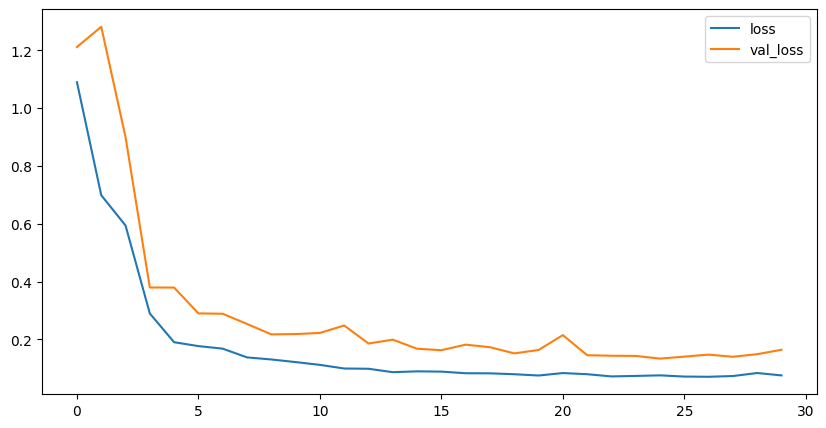

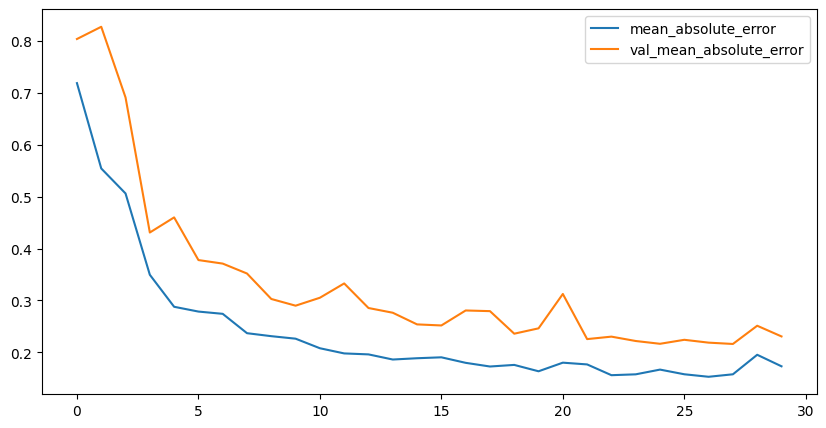

In [ ]:
UNVRU21_history = UNVRUnivariate21.fit(UNVR_X_train, UNVR_y_train, validation_data=(UNVR_X_val, UNVR_y_val), epochs=100, callbacks = [early_stopping])

UNVRU21_history_df = pd.DataFrame(UNVRU21_history.history)
UNVRU21_history_df.loc[:, ['loss', 'val_loss']].plot()
UNVRU21_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
UNVRU21_test_predictions = UNVRUnivariate21.predict(UNVR_X_test).flatten()
UNVRU21_test_mae = mean_absolute_error(UNVR_y_test, UNVRU21_test_predictions)
UNVRU21_test_rmse = np.sqrt(mean_squared_error(UNVR_y_test, UNVRU21_test_predictions))
UNVRU21_test_mape = mean_absolute_percentage_error(UNVR_y_test, UNVRU21_test_predictions)
UNVRU21_test_mae, UNVRU21_test_rmse, UNVRU21_test_mape

7/7 [==============================] - 1s 4ms/step


(0.16392058, 0.26308256, 0.1391118)

### 1 LSTM 2 Dense

In [ ]:
UNVRUnivariate12 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', input_shape = (5,1)),
    layers.Dense(32,activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

UNVRUnivariate12.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 4s 19ms/step - loss: 0.9346 - mean_absolute_error: 0.6559 - val_loss: 1.1313 - val_mean_absolute_error: 0.7736
Epoch 2/100
50/50 [==============================] - 0s 9ms/step - loss: 0.5755 - mean_absolute_error: 0.4947 - val_loss: 0.8610 - val_mean_absolute_error: 0.6745
Epoch 3/100
50/50 [==============================] - 0s 8ms/step - loss: 0.4253 - mean_absolute_error: 0.4280 - val_loss: 0.4803 - val_mean_absolute_error: 0.5054
Epoch 4/100
50/50 [==============================] - 0s 7ms/step - loss: 0.2262 - mean_absolute_error: 0.3048 - val_loss: 0.2245 - val_mean_absolute_error: 0.3323
Epoch 5/100
50/50 [==============================] - 0s 10ms/step - loss: 0.1129 - mean_absolute_error: 0.1993 - val_loss: 0.1811 - val_mean_absolute_error: 0.2678
Epoch 6/100
50/50 [==============================] - 0s 10ms/step - loss: 0.1018 - mean_absolute_error: 0.1961 - val_loss: 0.1811 - val_mean_absolute_error: 0.2743
Epoch 7/100
50/50 [

<Axes: >

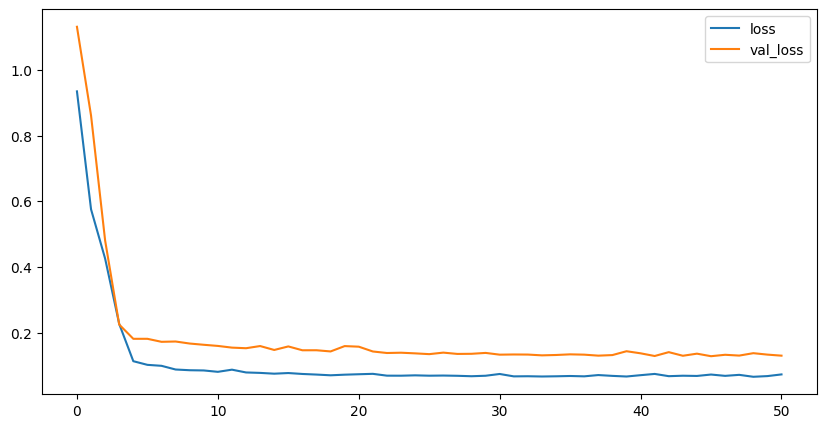

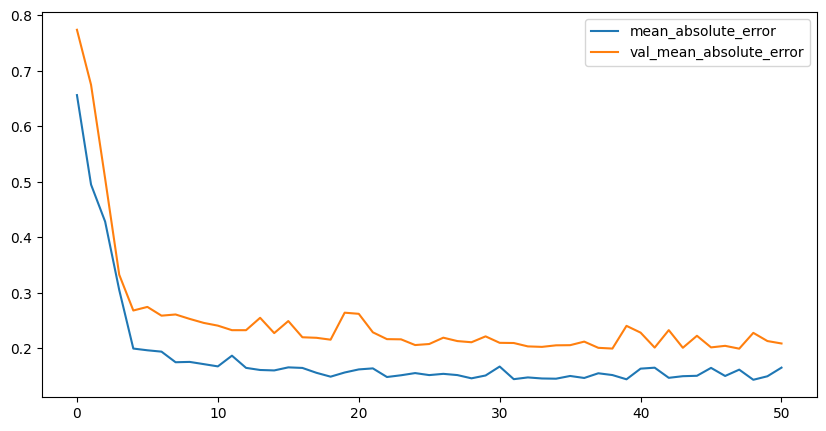

In [ ]:
UNVRU12_history = UNVRUnivariate12.fit(UNVR_X_train, UNVR_y_train, validation_data=(UNVR_X_val, UNVR_y_val), epochs=100, callbacks = [early_stopping])

UNVRU12_history_df = pd.DataFrame(UNVRU12_history.history)
UNVRU12_history_df.loc[:, ['loss', 'val_loss']].plot()
UNVRU12_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
UNVRU12_test_predictions = UNVRUnivariate12.predict(UNVR_X_test).flatten()
UNVRU12_test_mae = mean_absolute_error(UNVR_y_test, UNVRU12_test_predictions)
UNVRU12_test_rmse = np.sqrt(mean_squared_error(UNVR_y_test, UNVRU12_test_predictions))
UNVRU12_test_mape = mean_absolute_percentage_error(UNVR_y_test, UNVRU12_test_predictions)
UNVRU12_test_mae, UNVRU12_test_rmse, UNVRU12_test_mape

7/7 [==============================] - 0s 4ms/step


(0.14199375, 0.25371933, 0.11497475)

### 2 LSTM 2 Dense

In [ ]:
UNVRUnivariate22 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,1)),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(32,activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

UNVRUnivariate22.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 11s 36ms/step - loss: 1.0637 - mean_absolute_error: 0.6980 - val_loss: 1.2223 - val_mean_absolute_error: 0.8047
Epoch 2/100
50/50 [==============================] - 1s 15ms/step - loss: 0.5776 - mean_absolute_error: 0.5000 - val_loss: 0.7378 - val_mean_absolute_error: 0.6308
Epoch 3/100
50/50 [==============================] - 1s 14ms/step - loss: 0.2739 - mean_absolute_error: 0.3306 - val_loss: 0.3469 - val_mean_absolute_error: 0.4152
Epoch 4/100
50/50 [==============================] - 1s 13ms/step - loss: 0.1938 - mean_absolute_error: 0.2970 - val_loss: 0.3342 - val_mean_absolute_error: 0.4139
Epoch 5/100
50/50 [==============================] - 1s 18ms/step - loss: 0.1808 - mean_absolute_error: 0.2866 - val_loss: 0.3642 - val_mean_absolute_error: 0.4221
Epoch 6/100
50/50 [==============================] - 1s 21ms/step - loss: 0.1547 - mean_absolute_error: 0.2611 - val_loss: 0.3172 - val_mean_absolute_error: 0.4152
Epoch 7/100
50/

<Axes: >

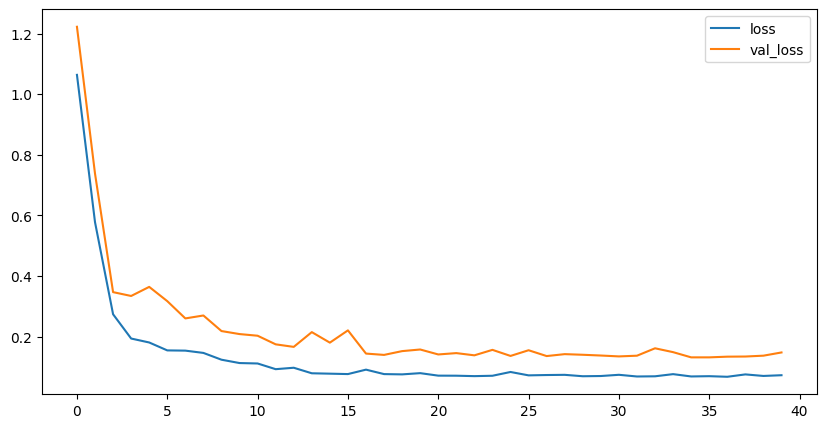

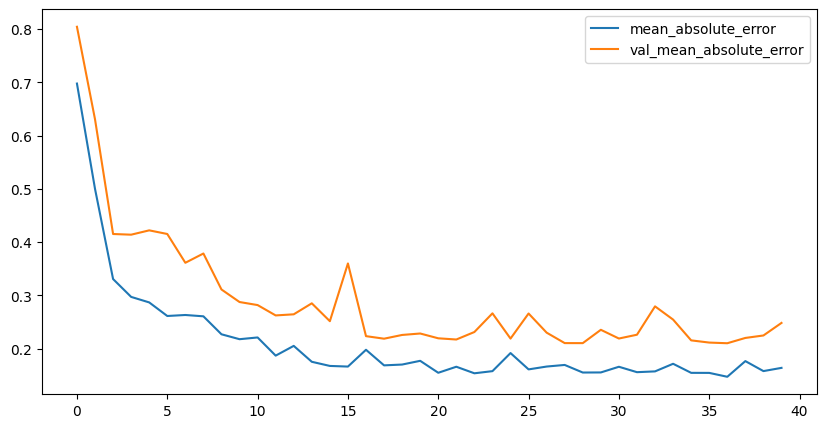

In [ ]:
UNVRU22_history = UNVRUnivariate22.fit(UNVR_X_train, UNVR_y_train, validation_data=(UNVR_X_val, UNVR_y_val), epochs=100, callbacks = [early_stopping])

UNVRU22_history_df = pd.DataFrame(UNVRU22_history.history)
UNVRU22_history_df.loc[:, ['loss', 'val_loss']].plot()
UNVRU22_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
UNVRU22_test_predictions = UNVRUnivariate22.predict(UNVR_X_test).flatten()
UNVRU22_test_mae = mean_absolute_error(UNVR_y_test, UNVRU22_test_predictions)
UNVRU22_test_rmse = np.sqrt(mean_squared_error(UNVR_y_test, UNVRU22_test_predictions))
UNVRU22_test_mape = mean_absolute_percentage_error(UNVR_y_test, UNVRU22_test_predictions)
UNVRU22_test_mae, UNVRU22_test_rmse, UNVRU22_test_mape

7/7 [==============================] - 1s 3ms/step


(0.16346318, 0.262948, 0.13973671)

### 3 LSTM 3 Dense

In [ ]:
UNVRUnivariate33 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,1)),
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(64,activation = 'relu'),
    layers.Dense(32, activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

UNVRUnivariate33.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 12s 66ms/step - loss: 0.9812 - mean_absolute_error: 0.6816 - val_loss: 1.2869 - val_mean_absolute_error: 0.8276
Epoch 2/100
50/50 [==============================] - 2s 31ms/step - loss: 0.7433 - mean_absolute_error: 0.5678 - val_loss: 1.2175 - val_mean_absolute_error: 0.8071
Epoch 3/100
50/50 [==============================] - 2s 35ms/step - loss: 0.7573 - mean_absolute_error: 0.5758 - val_loss: 1.1939 - val_mean_absolute_error: 0.7987
Epoch 4/100
50/50 [==============================] - 1s 23ms/step - loss: 0.7161 - mean_absolute_error: 0.5577 - val_loss: 1.1770 - val_mean_absolute_error: 0.7889
Epoch 5/100
50/50 [==============================] - 1s 25ms/step - loss: 0.5317 - mean_absolute_error: 0.4692 - val_loss: 0.3312 - val_mean_absolute_error: 0.4030
Epoch 6/100
50/50 [==============================] - 2s 35ms/step - loss: 0.2047 - mean_absolute_error: 0.3023 - val_loss: 0.3659 - val_mean_absolute_error: 0.4061
Epoch 7/100
50/

<Axes: >

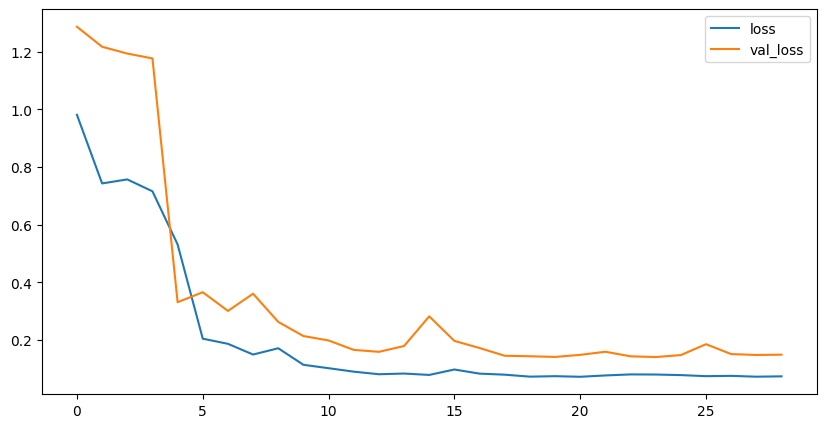

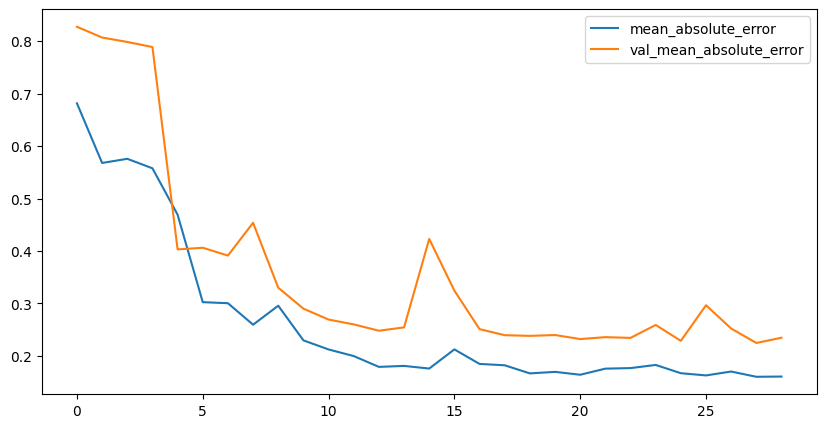

In [ ]:
UNVRU33_history = UNVRUnivariate33.fit(UNVR_X_train, UNVR_y_train, validation_data=(UNVR_X_val, UNVR_y_val), epochs=100, callbacks = [early_stopping])

UNVRU33_history_df = pd.DataFrame(UNVRU33_history.history)
UNVRU33_history_df.loc[:, ['loss', 'val_loss']].plot()
UNVRU33_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
UNVRU33_test_predictions = UNVRUnivariate33.predict(UNVR_X_test).flatten()
UNVRU33_test_mae = mean_absolute_error(UNVR_y_test, UNVRU33_test_predictions)
UNVRU33_test_rmse = np.sqrt(mean_squared_error(UNVR_y_test, UNVRU33_test_predictions))
UNVRU33_test_mape = mean_absolute_percentage_error(UNVR_y_test, UNVRU33_test_predictions)
UNVRU33_test_mae, UNVRU33_test_rmse, UNVRU33_test_mape

7/7 [==============================] - 1s 4ms/step


(0.23470567, 0.3100603, 0.21713)

### Evaluate

<ipython-input-119-a780b4a84bbd>:2: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



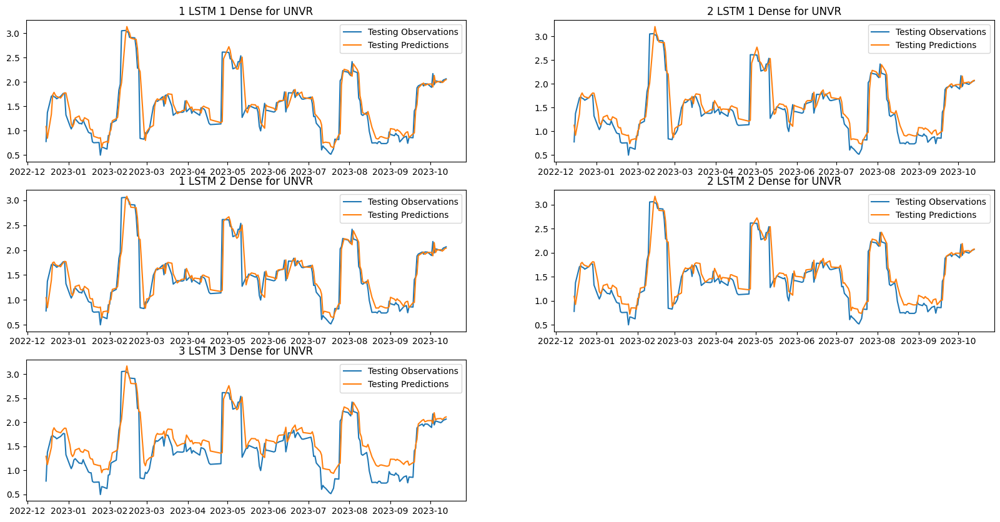

In [ ]:
fig, ax = plt.subplots(figsize = (20,10))
plt.subplot(3,2,1)
plt.plot(UNVR_dates_test, UNVR_y_test)
plt.plot(UNVR_dates_test, UNVRU11_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('1 LSTM 1 Dense for UNVR')

plt.subplot(3,2,2)
plt.plot(UNVR_dates_test, UNVR_y_test)
plt.plot(UNVR_dates_test, UNVRU21_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('2 LSTM 1 Dense for UNVR')

plt.subplot(3,2,3)
plt.plot(UNVR_dates_test, UNVR_y_test)
plt.plot(UNVR_dates_test, UNVRU12_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('1 LSTM 2 Dense for UNVR')

plt.subplot(3,2,4)
plt.plot(UNVR_dates_test, UNVR_y_test)
plt.plot(UNVR_dates_test, UNVRU22_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('2 LSTM 2 Dense for UNVR')

plt.subplot(3,2,5)
plt.plot(UNVR_dates_test, UNVR_y_test)
plt.plot(UNVR_dates_test, UNVRU33_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('3 LSTM 3 Dense for UNVR');

In [ ]:
UNVR_Eval = {'MAE': [UNVRU11_test_mae, UNVRU21_test_mae, UNVRU12_test_mae, UNVRU22_test_mae, UNVRU33_test_mae],
             'RMSE': [UNVRU11_test_rmse, UNVRU21_test_rmse, UNVRU12_test_rmse, UNVRU22_test_rmse, UNVRU33_test_rmse],
             'MAPE': [UNVRU11_test_mape, UNVRU21_test_mape, UNVRU12_test_mape, UNVRU22_test_mape, UNVRU33_test_mape]
            }

UNVR_Table = pd.DataFrame(UNVR_Eval, index =['1 LSTM 1 Dense', '2 LSTM 1 Dense', '1 LSTM 2 Dense', '2 LSTM 2 Dense', '3 LSTM 3 Dense'])
UNVR_Table

,MAE,RMSE,MAPE
1 LSTM 1 Dense,0.146165,0.256113,0.118308
2 LSTM 1 Dense,0.163921,0.263083,0.139112
1 LSTM 2 Dense,0.141994,0.253719,0.114975
2 LSTM 2 Dense,0.163463,0.262948,0.139737
3 LSTM 3 Dense,0.234706,0.310060,0.217130


<Axes: >

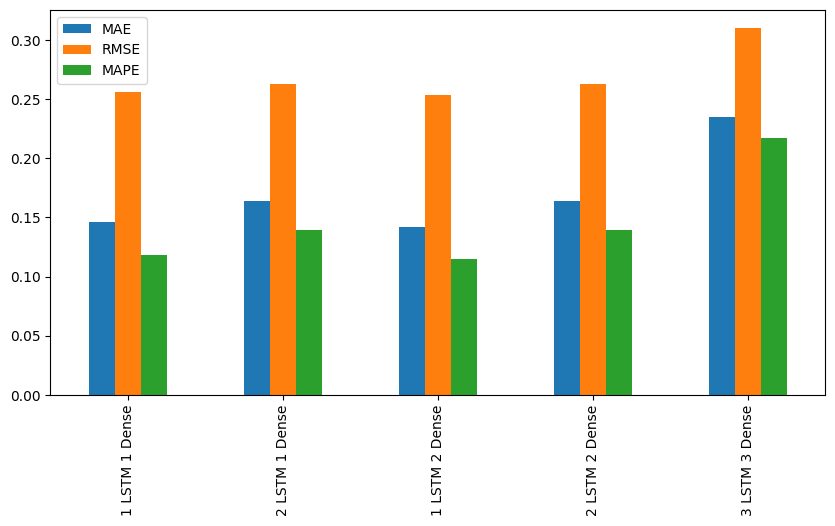

In [ ]:
UNVR_Table.plot(kind = 'bar')

The MAE, RMSE, and MAPE results show that 1 LSTM layer and 2 Dense layers is the best Univariate model for UNVR

In [ ]:
UNVRUnivariate12.save("UNVRUnivariate12.h5")
UNVRUnivariate12.save("UNVRUnivariate_12")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



In [ ]:
#TLKMUnivariate12 = keras.models.load_model("TLKMUnivariate12.h5")

## Finding Best Univariate LSTM Model for BYAN
***

### 1 LSTM 1 Dense

In [ ]:
BYANUnivariate11 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', input_shape = (5,1)),
    layers.Dense(1, activation = 'linear')
])

BYANUnivariate11.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 2s 9ms/step - loss: 5.0831 - mean_absolute_error: 1.5241 - val_loss: 2.4602 - val_mean_absolute_error: 1.1384
Epoch 2/100
50/50 [==============================] - 0s 4ms/step - loss: 3.1729 - mean_absolute_error: 1.2072 - val_loss: 1.7104 - val_mean_absolute_error: 0.9608
Epoch 3/100
50/50 [==============================] - 0s 4ms/step - loss: 2.1372 - mean_absolute_error: 0.9619 - val_loss: 1.0090 - val_mean_absolute_error: 0.6817
Epoch 4/100
50/50 [==============================] - 0s 5ms/step - loss: 1.3042 - mean_absolute_error: 0.6800 - val_loss: 0.6198 - val_mean_absolute_error: 0.4482
Epoch 5/100
50/50 [==============================] - 0s 5ms/step - loss: 0.9839 - mean_absolute_error: 0.5171 - val_loss: 0.5152 - val_mean_absolute_error: 0.4078
Epoch 6/100
50/50 [==============================] - 0s 5ms/step - loss: 0.8558 - mean_absolute_error: 0.4847 - val_loss: 0.4595 - val_mean_absolute_error: 0.4018
Epoch 7/100
50/50 [===

<Axes: >

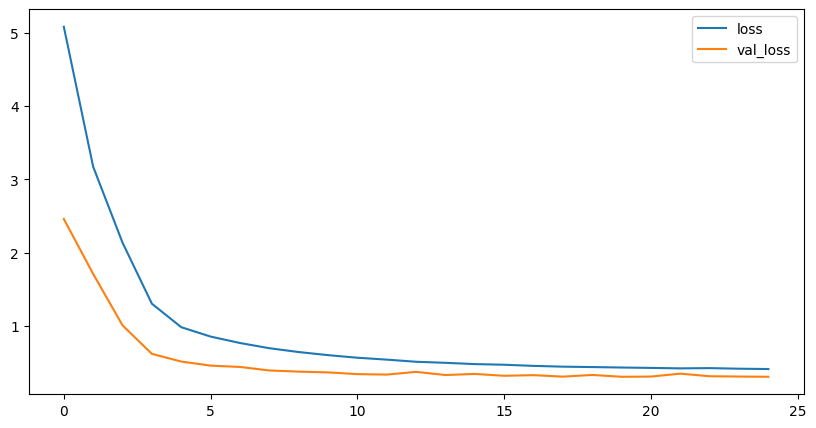

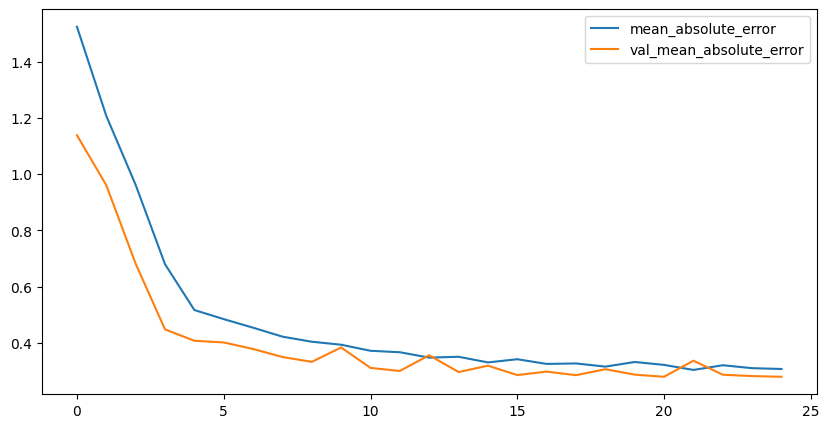

In [ ]:
BYANU11_history = BYANUnivariate11.fit(BYAN_X_train, BYAN_y_train, validation_data=(BYAN_X_val, BYAN_y_val), epochs=100, callbacks = [early_stopping])

BYANU11_history_df = pd.DataFrame(BYANU11_history.history)
BYANU11_history_df.loc[:, ['loss', 'val_loss']].plot()
BYANU11_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BYANU11_test_predictions = BYANUnivariate11.predict(BYAN_X_test).flatten()
BYANU11_test_mae = mean_absolute_error(BYAN_y_test, BYANU11_test_predictions)
BYANU11_test_rmse = np.sqrt(mean_squared_error(BYAN_y_test, BYANU11_test_predictions))
BYANU11_test_mape = mean_absolute_percentage_error(BYAN_y_test, BYANU11_test_predictions)
BYANU11_test_mae, BYANU11_test_rmse, BYANU11_test_mape

7/7 [==============================] - 0s 3ms/step


(0.30386877, 0.5160318, 0.13520591)

### 2 LSTM 1 Dense

In [ ]:
BYANUnivariate21 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,1)),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(1, activation = 'linear')
])

BYANUnivariate21.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 9s 37ms/step - loss: 4.6503 - mean_absolute_error: 1.4848 - val_loss: 2.3177 - val_mean_absolute_error: 1.0641
Epoch 2/100
50/50 [==============================] - 1s 15ms/step - loss: 1.8660 - mean_absolute_error: 0.8607 - val_loss: 0.8452 - val_mean_absolute_error: 0.5866
Epoch 3/100
50/50 [==============================] - 1s 19ms/step - loss: 1.2094 - mean_absolute_error: 0.6735 - val_loss: 0.5608 - val_mean_absolute_error: 0.4989
Epoch 4/100
50/50 [==============================] - 1s 19ms/step - loss: 0.8757 - mean_absolute_error: 0.5390 - val_loss: 0.4698 - val_mean_absolute_error: 0.4866
Epoch 5/100
50/50 [==============================] - 1s 15ms/step - loss: 0.6909 - mean_absolute_error: 0.4645 - val_loss: 0.3966 - val_mean_absolute_error: 0.3715
Epoch 6/100
50/50 [==============================] - 1s 26ms/step - loss: 0.5905 - mean_absolute_error: 0.4213 - val_loss: 0.4271 - val_mean_absolute_error: 0.3791
Epoch 7/100
50/5

<Axes: >

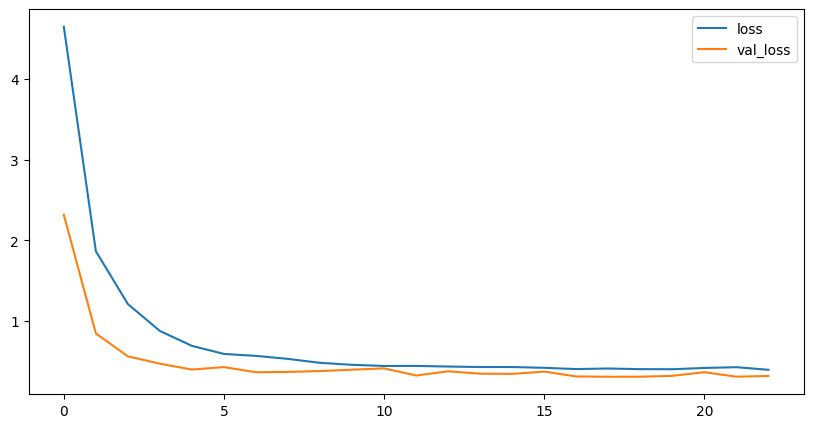

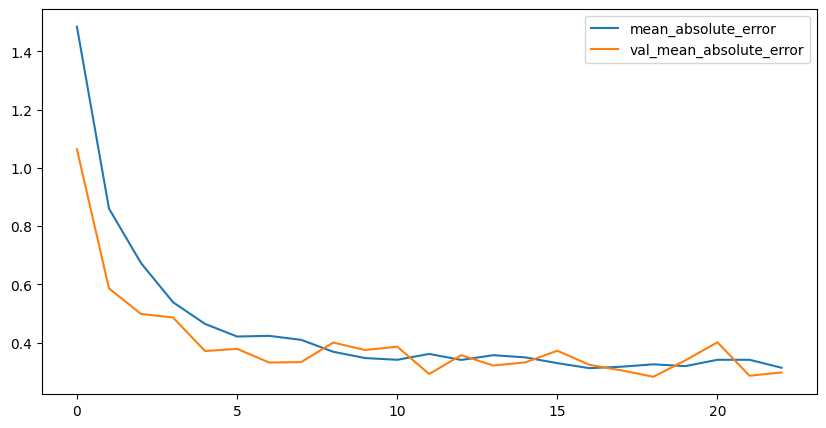

In [ ]:
BYANU21_history = BYANUnivariate21.fit(BYAN_X_train, BYAN_y_train, validation_data=(BYAN_X_val, BYAN_y_val), epochs=100, callbacks = [early_stopping])

BYANU21_history_df = pd.DataFrame(BYANU21_history.history)
BYANU21_history_df.loc[:, ['loss', 'val_loss']].plot()
BYANU21_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BYANU21_test_predictions = BYANUnivariate21.predict(BYAN_X_test).flatten()
BYANU21_test_mae = mean_absolute_error(BYAN_y_test, BYANU21_test_predictions)
BYANU21_test_rmse = np.sqrt(mean_squared_error(BYAN_y_test, BYANU21_test_predictions))
BYANU21_test_mape = mean_absolute_percentage_error(BYAN_y_test, BYANU21_test_predictions)
BYANU21_test_mae, BYANU21_test_rmse, BYANU21_test_mape

7/7 [==============================] - 1s 3ms/step


(0.3126893, 0.5259738, 0.14354698)

### 1 LSTM 2 Dense

In [ ]:
BYANUnivariate12 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', input_shape = (5,1)),
    layers.Dense(32,activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

BYANUnivariate12.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 5s 22ms/step - loss: 5.3702 - mean_absolute_error: 1.5247 - val_loss: 3.0032 - val_mean_absolute_error: 1.2187
Epoch 2/100
50/50 [==============================] - 0s 9ms/step - loss: 3.6442 - mean_absolute_error: 1.3176 - val_loss: 2.0798 - val_mean_absolute_error: 0.9999
Epoch 3/100
50/50 [==============================] - 0s 8ms/step - loss: 2.0298 - mean_absolute_error: 0.9329 - val_loss: 0.6613 - val_mean_absolute_error: 0.5220
Epoch 4/100
50/50 [==============================] - 0s 10ms/step - loss: 0.8662 - mean_absolute_error: 0.5261 - val_loss: 0.4223 - val_mean_absolute_error: 0.4224
Epoch 5/100
50/50 [==============================] - 0s 9ms/step - loss: 0.6603 - mean_absolute_error: 0.4414 - val_loss: 0.3811 - val_mean_absolute_error: 0.3499
Epoch 6/100
50/50 [==============================] - 0s 10ms/step - loss: 0.5915 - mean_absolute_error: 0.4257 - val_loss: 0.3325 - val_mean_absolute_error: 0.3124
Epoch 7/100
50/50 [

<Axes: >

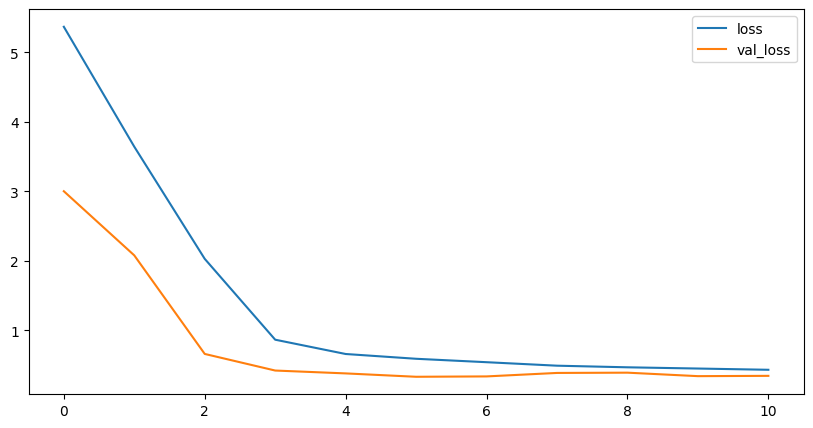

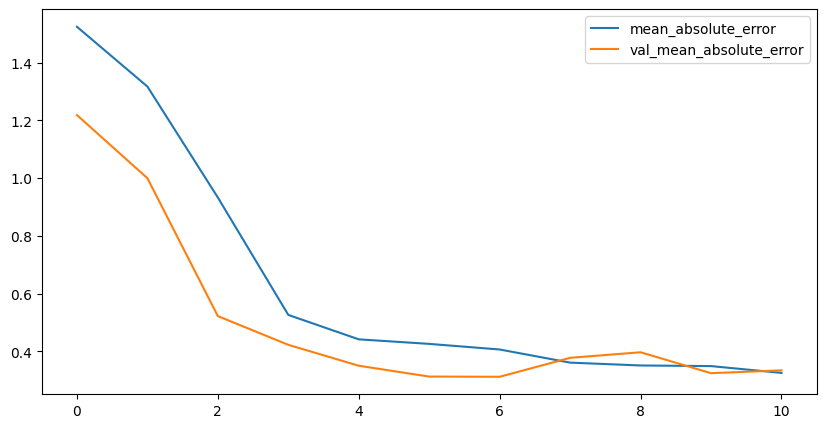

In [ ]:
BYANU12_history = BYANUnivariate12.fit(BYAN_X_train, BYAN_y_train, validation_data=(BYAN_X_val, BYAN_y_val), epochs=100, callbacks = [early_stopping])

BYANU12_history_df = pd.DataFrame(BYANU12_history.history)
BYANU12_history_df.loc[:, ['loss', 'val_loss']].plot()
BYANU12_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BYANU12_test_predictions = BYANUnivariate12.predict(BYAN_X_test).flatten()
BYANU12_test_mae = mean_absolute_error(BYAN_y_test, BYANU12_test_predictions)
BYANU12_test_rmse = np.sqrt(mean_squared_error(BYAN_y_test, BYANU12_test_predictions))
BYANU12_test_mape = mean_absolute_percentage_error(BYAN_y_test, BYANU12_test_predictions)
BYANU12_test_mae, BYANU12_test_rmse, BYANU12_test_mape

7/7 [==============================] - 0s 4ms/step


(0.32886323, 0.5580457, 0.14829329)

### 2 LSTM 2 Dense

In [ ]:
BYANUnivariate22 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,1)),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(32,activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

BYANUnivariate22.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 4s 20ms/step - loss: 4.2129 - mean_absolute_error: 1.3980 - val_loss: 1.4505 - val_mean_absolute_error: 0.8108
Epoch 2/100
50/50 [==============================] - 0s 8ms/step - loss: 1.3900 - mean_absolute_error: 0.7188 - val_loss: 0.5796 - val_mean_absolute_error: 0.5289
Epoch 3/100
50/50 [==============================] - 0s 7ms/step - loss: 0.9279 - mean_absolute_error: 0.5644 - val_loss: 0.4192 - val_mean_absolute_error: 0.3798
Epoch 4/100
50/50 [==============================] - 0s 8ms/step - loss: 0.6910 - mean_absolute_error: 0.4952 - val_loss: 0.4809 - val_mean_absolute_error: 0.4494
Epoch 5/100
50/50 [==============================] - 0s 7ms/step - loss: 0.5153 - mean_absolute_error: 0.4099 - val_loss: 0.7713 - val_mean_absolute_error: 0.6808
Epoch 6/100
50/50 [==============================] - 0s 8ms/step - loss: 0.5105 - mean_absolute_error: 0.4196 - val_loss: 0.3286 - val_mean_absolute_error: 0.3039
Epoch 7/100
50/50 [==

<Axes: >

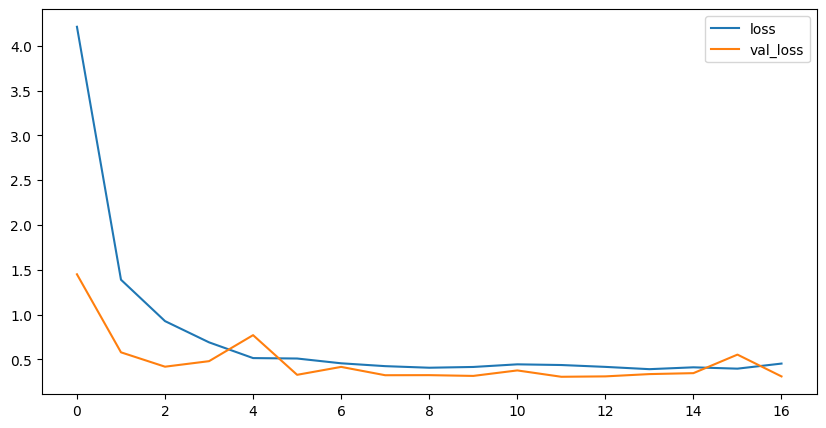

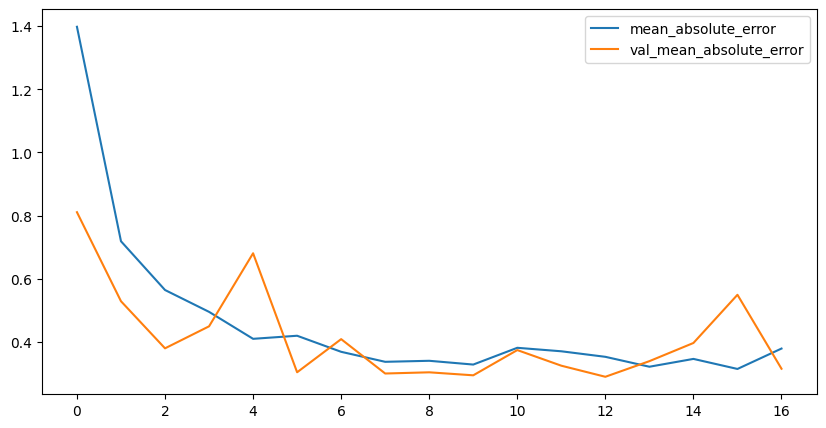

In [ ]:
BYANU22_history = BYANUnivariate22.fit(BYAN_X_train, BYAN_y_train, validation_data=(BYAN_X_val, BYAN_y_val), epochs=100, callbacks = [early_stopping])

BYANU22_history_df = pd.DataFrame(BYANU22_history.history)
BYANU22_history_df.loc[:, ['loss', 'val_loss']].plot()
BYANU22_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BYANU22_test_predictions = BYANUnivariate22.predict(BYAN_X_test).flatten()
BYANU22_test_mae = mean_absolute_error(BYAN_y_test, BYANU22_test_predictions)
BYANU22_test_rmse = np.sqrt(mean_squared_error(BYAN_y_test, BYANU22_test_predictions))
BYANU22_test_mape = mean_absolute_percentage_error(BYAN_y_test, BYANU22_test_predictions)
BYANU22_test_mae, BYANU22_test_rmse, BYANU22_test_mape

7/7 [==============================] - 1s 4ms/step


(0.3213071, 0.5175232, 0.15823752)

### 3 LSTM 3 Dense

In [ ]:
BYANUnivariate33 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,1)),
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(64,activation = 'relu'),
    layers.Dense(32, activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

BYANUnivariate33.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 12s 41ms/step - loss: 5.5171 - mean_absolute_error: 1.5640 - val_loss: 3.1059 - val_mean_absolute_error: 1.3151
Epoch 2/100
50/50 [==============================] - 1s 20ms/step - loss: 4.6412 - mean_absolute_error: 1.5017 - val_loss: 3.3654 - val_mean_absolute_error: 1.2649
Epoch 3/100
50/50 [==============================] - 1s 18ms/step - loss: 3.4766 - mean_absolute_error: 1.2510 - val_loss: 1.1934 - val_mean_absolute_error: 0.7600
Epoch 4/100
50/50 [==============================] - 1s 21ms/step - loss: 1.3594 - mean_absolute_error: 0.7495 - val_loss: 0.8349 - val_mean_absolute_error: 0.6418
Epoch 5/100
50/50 [==============================] - 1s 19ms/step - loss: 0.8388 - mean_absolute_error: 0.5816 - val_loss: 0.3870 - val_mean_absolute_error: 0.3528
Epoch 6/100
50/50 [==============================] - 1s 18ms/step - loss: 0.5678 - mean_absolute_error: 0.4159 - val_loss: 0.3616 - val_mean_absolute_error: 0.3347
Epoch 7/100
50/

<Axes: >

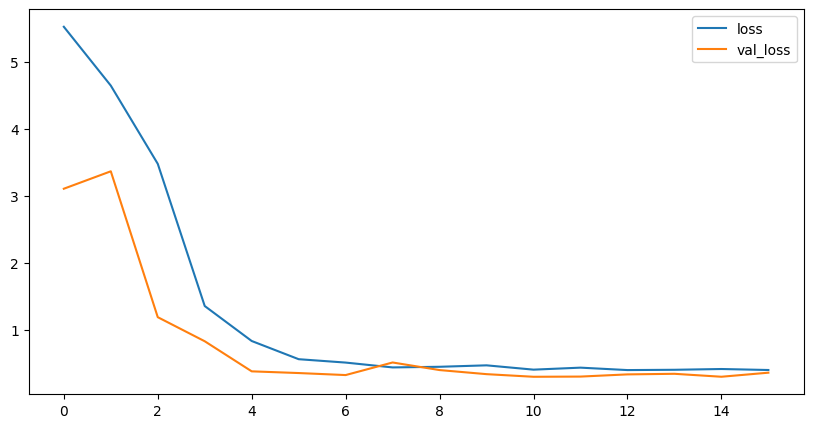

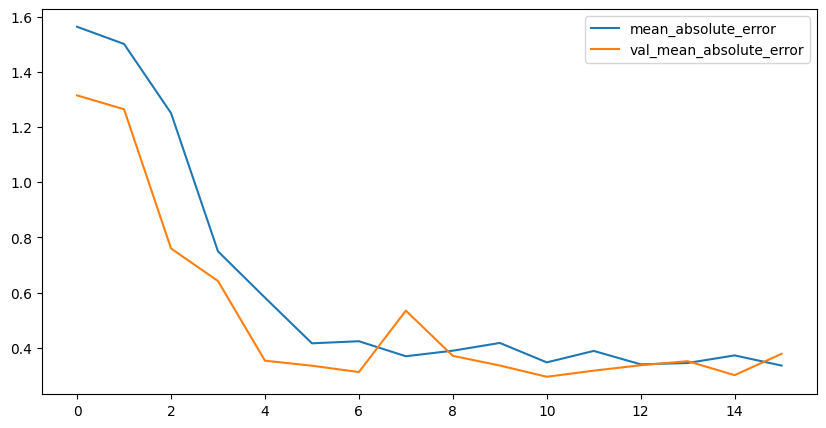

In [ ]:
BYANU33_history = BYANUnivariate33.fit(BYAN_X_train, BYAN_y_train, validation_data=(BYAN_X_val, BYAN_y_val), epochs=100, callbacks = [early_stopping])

BYANU33_history_df = pd.DataFrame(BYANU33_history.history)
BYANU33_history_df.loc[:, ['loss', 'val_loss']].plot()
BYANU33_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BYANU33_test_predictions = BYANUnivariate33.predict(BYAN_X_test).flatten()
BYANU33_test_mae = mean_absolute_error(BYAN_y_test, BYANU33_test_predictions)
BYANU33_test_rmse = np.sqrt(mean_squared_error(BYAN_y_test, BYANU33_test_predictions))
BYANU33_test_mape = mean_absolute_percentage_error(BYAN_y_test, BYANU33_test_predictions)
BYANU33_test_mae, BYANU33_test_rmse, BYANU33_test_mape

7/7 [==============================] - 1s 4ms/step


(0.30968457, 0.530388, 0.13874644)

### Evaluate

<ipython-input-166-b1fd637e12a4>:2: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



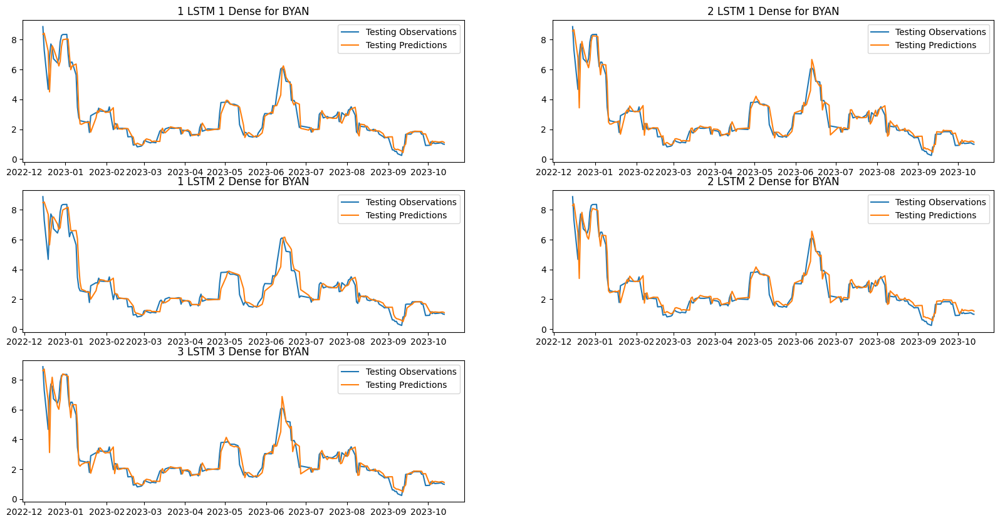

In [ ]:
fig, ax = plt.subplots(figsize = (20,10))
plt.subplot(3,2,1)
plt.plot(BYAN_dates_test, BYAN_y_test)
plt.plot(BYAN_dates_test, BYANU11_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('1 LSTM 1 Dense for BYAN')

plt.subplot(3,2,2)
plt.plot(BYAN_dates_test, BYAN_y_test)
plt.plot(BYAN_dates_test, BYANU21_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('2 LSTM 1 Dense for BYAN')

plt.subplot(3,2,3)
plt.plot(BYAN_dates_test, BYAN_y_test)
plt.plot(BYAN_dates_test, BYANU12_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('1 LSTM 2 Dense for BYAN')

plt.subplot(3,2,4)
plt.plot(BYAN_dates_test, BYAN_y_test)
plt.plot(BYAN_dates_test, BYANU22_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('2 LSTM 2 Dense for BYAN')

plt.subplot(3,2,5)
plt.plot(BYAN_dates_test, BYAN_y_test)
plt.plot(BYAN_dates_test, BYANU33_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('3 LSTM 3 Dense for BYAN');

In [ ]:
BYAN_Eval = {'MAE': [BYANU11_test_mae, BYANU21_test_mae, BYANU12_test_mae, BYANU22_test_mae, BYANU33_test_mae],
             'RMSE': [BYANU11_test_rmse, BYANU21_test_rmse, BYANU12_test_rmse, BYANU22_test_rmse, BYANU33_test_rmse],
             'MAPE': [BYANU11_test_mape, BYANU21_test_mape, BYANU12_test_mape, BYANU22_test_mape, BYANU33_test_mape]
            }

BYAN_Table = pd.DataFrame(BYAN_Eval, index =['1 LSTM 1 Dense', '2 LSTM 1 Dense', '1 LSTM 2 Dense', '2 LSTM 2 Dense', '3 LSTM 3 Dense'])
BYAN_Table

,MAE,RMSE,MAPE
1 LSTM 1 Dense,0.303869,0.516032,0.135206
2 LSTM 1 Dense,0.312689,0.525974,0.143547
1 LSTM 2 Dense,0.328863,0.558046,0.148293
2 LSTM 2 Dense,0.321307,0.517523,0.158238
3 LSTM 3 Dense,0.309685,0.530388,0.138746


<Axes: >

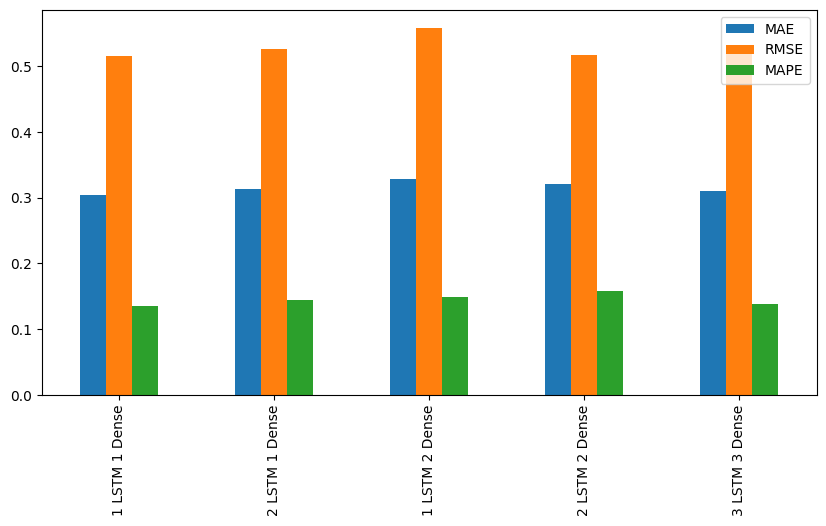

In [ ]:
BYAN_Table.plot(kind = 'bar')

The MAE, RMSE, and MAPE results show that 1 LSTM layer and 1 Dense layer is the best Univariate model for BYAN.

In [ ]:
BYANUnivariate12.save("BYANUnivariate12.h5")
BYANUnivariate12.save("BYANUnivariate_12")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



In [ ]:
#INDFUnivariate12 = keras.models.load_model("INDFUnivariate12.h5")

## Value at Risk using Univariate LSTM
***

We will use the same Student's t distribution VaR formula from the GARCH section.

In [ ]:
alpha = [0.01, 0.05, 0.1]
BCA_VaR_uni = pd.DataFrame(index = BCA_uni[Uq_90+5:].index, columns = ['1%', '5%', '10%'] )
UNVR_VaR_uni = pd.DataFrame(index = UNVR_uni[Uq_90+5:].index, columns = ['1%', '5%', '10%'] )
BYAN_VaR_uni = pd.DataFrame(index = BYAN_uni[Uq_90+5:].index, columns = ['1%', '5%', '10%'] )
for i in range(len(BCA_y_test)):
    BCA_nu, _, _ = t.fit(BCA_uni[:Uq_90+i+5]['log return'])
    UNVR_nu, _, _ = t.fit(UNVR_uni[:Uq_90+i+5]['log return'])
    BYAN_nu, _ = norm.fit(BYAN_uni[:Uq_90+i+5]['log return'])

    #test = t.ppf(alpha, nu) * BCA_predictions[i] + BCAgarch[:q_90+i]['log return'].mean()
    #test = norm.ppf(0.05) * BCA_predictions[i] + BCAgarch[:q_90+i]['log return'].mean()
    for j in range(len(alpha)):
        BCA_VaR_uni.iloc[i,j] = ((BCA_nu-2)/BCA_nu)**0.5 * t.ppf(alpha[j], BCA_nu) * BCAU11_test_predictions[i] + BCA_uni[:Uq_90+i+5]['log return'].mean()
        UNVR_VaR_uni.iloc[i,j] = ((UNVR_nu-2)/UNVR_nu)**0.5 * t.ppf(alpha[j], UNVR_nu) * UNVRU12_test_predictions[i] + UNVR_uni[:Uq_90+i+5]['log return'].mean()
        # BYAN_VaR_uni.iloc[i,j] = ((BYAN_nu-2)/BYAN_nu)**0.5 * t.ppf(alpha[j], BYAN_nu) * BYANU11_test_predictions[i] + BYAN_uni[:Uq_90+i+5]['log return'].mean()
        BYAN_VaR_uni.iloc[i,j] = norm.ppf(alpha[j], BYAN_nu) * BYANU11_test_predictions[i] + BYAN_uni[:Uq_90+i+5]['log return'].mean()

<ipython-input-217-ab5c965a1e28>:15: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



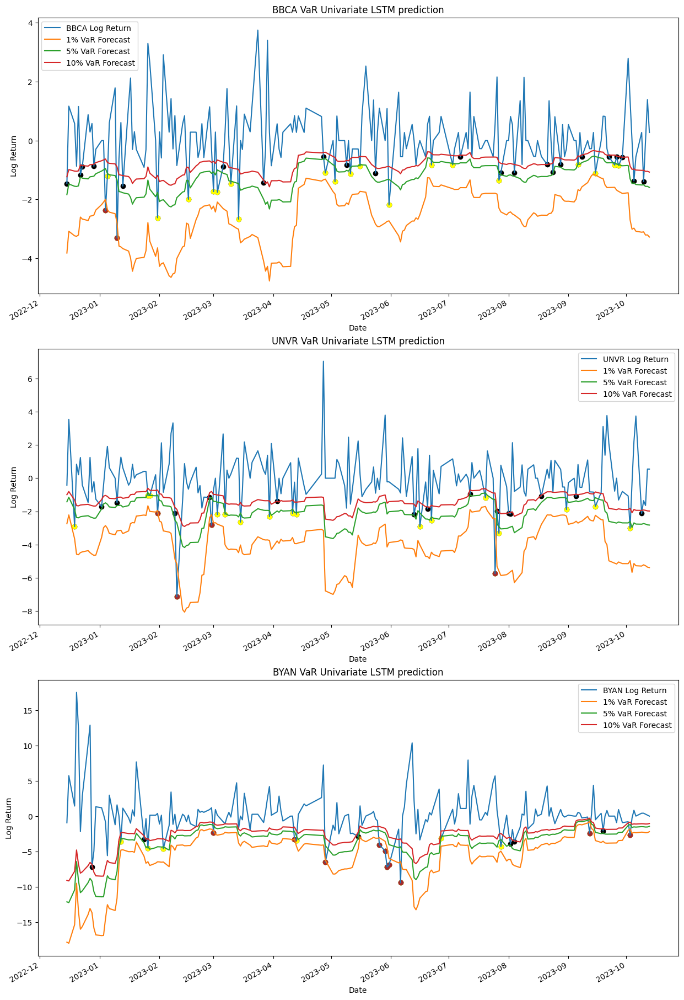

In [ ]:
BCAU_failed1 = BCA_uni[Uq_90+5:][BCA_uni[Uq_90+5:]['log return'] < BCA_VaR_uni['1%']]['log return']
BCAU_failed5 = BCA_uni[Uq_90+5:][BCA_uni[Uq_90+5:]['log return'] < BCA_VaR_uni['5%']]['log return']
BCAU_failed10 = BCA_uni[Uq_90+5:][BCA_uni[Uq_90+5:]['log return'] < BCA_VaR_uni['10%']]['log return']

UNVRU_failed1 = UNVR_uni[Uq_90+5:][UNVR_uni[Uq_90+5:]['log return'] < UNVR_VaR_uni['1%']]['log return']
UNVRU_failed5 = UNVR_uni[Uq_90+5:][UNVR_uni[Uq_90+5:]['log return'] < UNVR_VaR_uni['5%']]['log return']
UNVRU_failed10 = UNVR_uni[Uq_90+5:][UNVR_uni[Uq_90+5:]['log return'] < UNVR_VaR_uni['10%']]['log return']

BYANU_failed1 = BYAN_uni[Uq_90+5:][BYAN_uni[Uq_90+5:]['log return'] < BYAN_VaR_uni['1%']]['log return']
BYANU_failed5 = BYAN_uni[Uq_90+5:][BYAN_uni[Uq_90+5:]['log return'] < BYAN_VaR_uni['5%']]['log return']
BYANU_failed10 = BYAN_uni[Uq_90+5:][BYAN_uni[Uq_90+5:]['log return'] < BYAN_VaR_uni['10%']]['log return']

plt.subplots(figsize = (15,25))

plt.subplot(3,1,1)
BCA_uni[Uq_90+5:]['log return'].plot(ylabel = 'Log Return')
BCA_VaR_uni['1%'].plot()
BCA_VaR_uni['5%'].plot()
BCA_VaR_uni['10%'].plot()
plt.legend(['BBCA Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(BCAU_failed10.index, BCAU_failed10.values, color='black')
plt.scatter(BCAU_failed5.index, BCAU_failed5.values, color='yellow')
plt.scatter(BCAU_failed1.index, BCAU_failed1.values, color='brown')
plt.title('BBCA VaR Univariate LSTM prediction')

plt.subplot(3,1,2)
UNVR_uni[Uq_90+5:]['log return'].plot(ylabel = 'Log Return')
UNVR_VaR_uni['1%'].plot()
UNVR_VaR_uni['5%'].plot()
UNVR_VaR_uni['10%'].plot()
plt.legend(['UNVR Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(UNVRU_failed10.index, UNVRU_failed10.values, color='black')
plt.scatter(UNVRU_failed5.index, UNVRU_failed5.values, color='yellow')
plt.scatter(UNVRU_failed1.index, UNVRU_failed1.values, color='brown')
plt.title('UNVR VaR Univariate LSTM prediction')

plt.subplot(3,1,3)
BYAN_uni[Uq_90+5:]['log return'].plot(ylabel = 'Log Return')
BYAN_VaR_uni['1%'].plot()
BYAN_VaR_uni['5%'].plot()
BYAN_VaR_uni['10%'].plot()
plt.legend(['BYAN Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(BYANU_failed10.index, BYANU_failed10.values, color='black')
plt.scatter(BYANU_failed5.index, BYANU_failed5.values, color='yellow')
plt.scatter(BYANU_failed1.index, BYANU_failed1.values, color='brown')
plt.title('BYAN VaR Univariate LSTM prediction');

In [ ]:
overexceeduni = {'BCA': [BCAU_failed1.value_counts().sum(), BCAU_failed5.value_counts().sum(), BCAU_failed10.value_counts().sum()],
              'UNVR': [UNVRU_failed1.value_counts().sum(), UNVRU_failed5.value_counts().sum(), UNVRU_failed10.value_counts().sum()],
              'BYAN': [BYANU_failed1.value_counts().sum(), BYANU_failed5.value_counts().sum(), BYANU_failed10.value_counts().sum()]
}
overexceed_uni = pd.DataFrame(overexceeduni, index = ['1%', '5%', '10%'])
overexceed_uni

,BCA,UNVR,BYAN
1%,2,4,10
5%,21,20,16
10%,43,34,22


In [ ]:
(1 - (overexceed_uni/len(BCA_y_test)))*100

,BCA,UNVR,BYAN
1%,98.989899,97.979798,94.949495
5%,89.393939,89.898990,91.919192
10%,78.282828,82.828283,88.888889


# IV. Multivariate LSTM
***
***

For the Multivariate LSTM model, Several transformations and feature engineering were performed on the initial features provided to create new features that could be useful for predicting stock volatility.

## Feature Engineering
***

In [ ]:
# !pip install pandas_ta

In [ ]:
import pandas_ta as ta
import scipy
from sklearn.preprocessing import MinMaxScaler

In [ ]:
BCA_multi = BCA.copy()
UNVR_multi = UNVR.copy()
BYAN_multi = BYAN.copy()

### Simple Moving Average

The __Simple Moving Average (SMA)__ serves as a valuable tool for predicting stock volatility by smoothing out short-term price fluctuations over a specified time window. Its ability to identify trends and changes in slope makes it useful for assessing market conditions. SMA crossovers and deviations from the SMA can signal potential shifts in volatility, offering insights into market dynamics. Additionally, SMA acts as dynamic support or resistance levels and can aid in identifying trend reversals. While SMA is a lagging indicator, its integration with other technical tools enhances its effectiveness in predicting stock volatility and informing trading decisions. For our features, we will use 10 day moving averages and 21 day moving averages.

<ipython-input-228-200b93cd6a25>:11: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



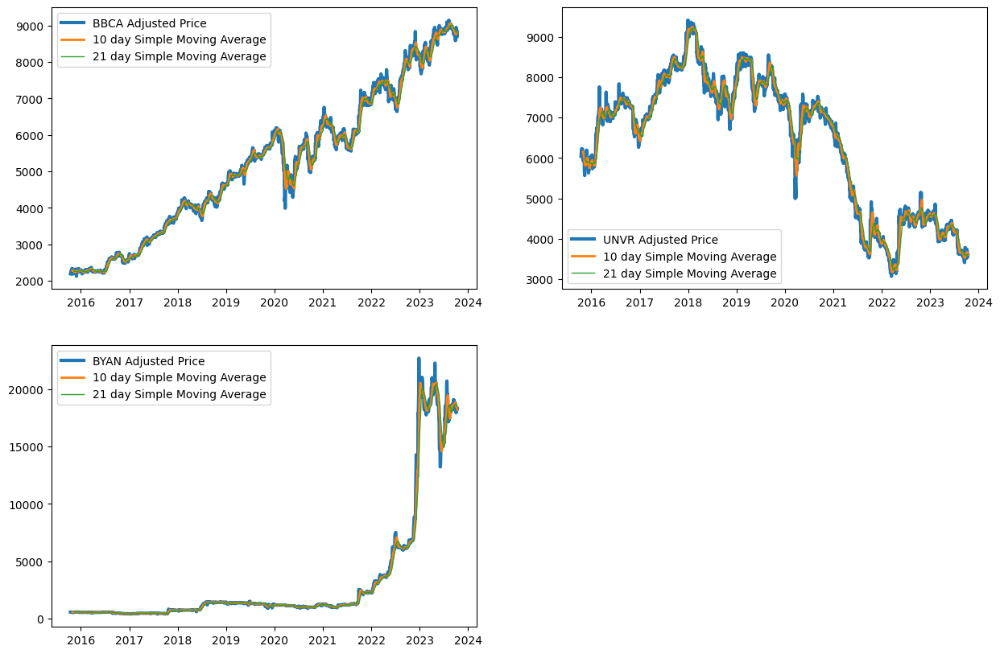

In [ ]:
BCA_multi['10 day SMA'] = BCA_multi['Adj Close'].rolling(window = 10).mean()
BCA_multi['21 day SMA'] = BCA_multi['Adj Close'].rolling(window = 21).mean()

UNVR_multi['10 day SMA'] = UNVR_multi['Adj Close'].rolling(window = 10).mean()
UNVR_multi['21 day SMA'] = UNVR_multi['Adj Close'].rolling(window = 21).mean()

BYAN_multi['10 day SMA'] = BYAN_multi['Adj Close'].rolling(window = 10).mean()
BYAN_multi['21 day SMA'] = BYAN_multi['Adj Close'].rolling(window = 21).mean()

plt.subplots(figsize = (15,10))
plt.subplot(2,2,1)
plt.plot(BCA_multi['Adj Close'], linewidth = 3)
plt.plot(BCA_multi['10 day SMA'], linewidth = 2)
plt.plot(BCA_multi['21 day SMA'], linewidth = 1)
plt.legend(['BBCA Adjusted Price', '10 day Simple Moving Average', '21 day Simple Moving Average'])

plt.subplot(2,2,2)
plt.plot(UNVR_multi['Adj Close'], linewidth = 3)
plt.plot(UNVR_multi['10 day SMA'], linewidth = 2)
plt.plot(UNVR_multi['21 day SMA'], linewidth = 1)
plt.legend(['UNVR Adjusted Price', '10 day Simple Moving Average', '21 day Simple Moving Average'])

plt.subplot(2,2,3)
plt.plot(BYAN_multi['Adj Close'], linewidth = 3)
plt.plot(BYAN_multi['10 day SMA'], linewidth = 2)
plt.plot(BYAN_multi['21 day SMA'], linewidth = 1)
plt.legend(['BYAN Adjusted Price', '10 day Simple Moving Average', '21 day Simple Moving Average'])

### Relative Strength Index

The __Relative Strength Index (RSI)__ is a momentum oscillator commonly used in technical analysis to assess the speed and change of price movements in a financial asset. The RSI is measured on a scale from 0 to 100 and is typically utilized over a 14-day period. The RSI compares the magnitude of recent gains to recent losses, generating a numerical value that reflects the asset's overbought or oversold conditions.

Text(0.5, 1.0, 'BYAN Relative Strength Index')

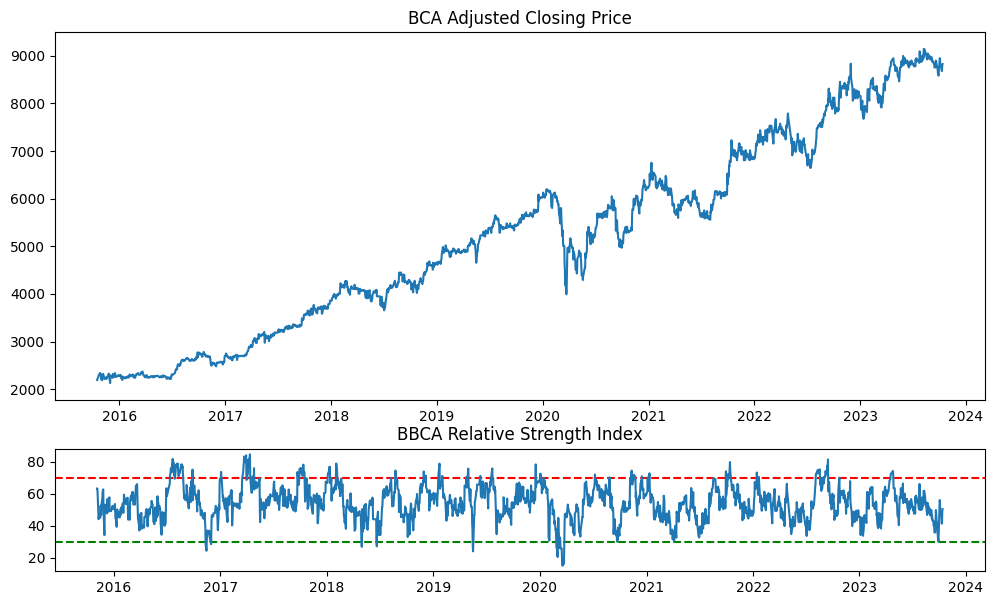

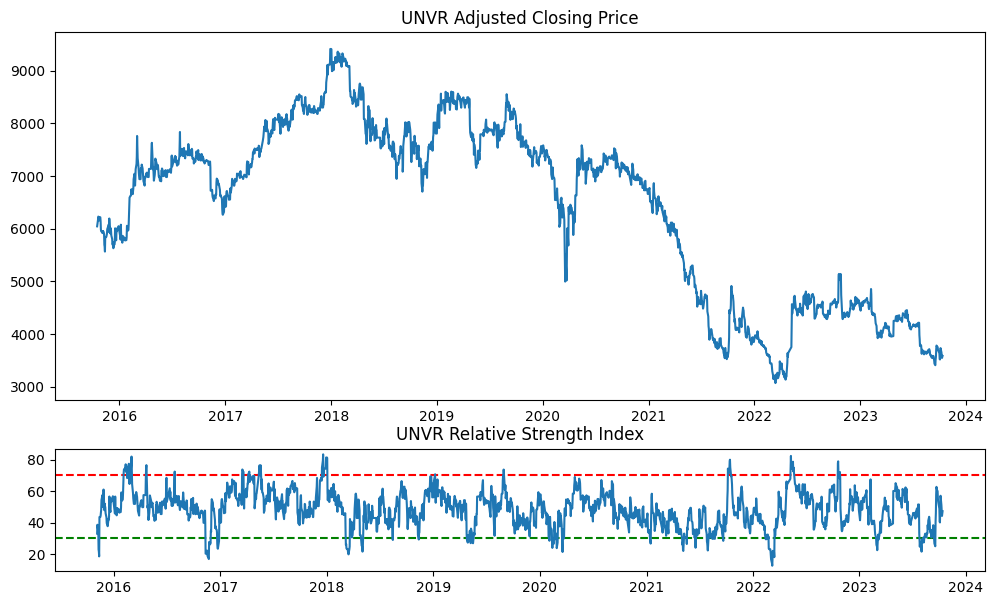

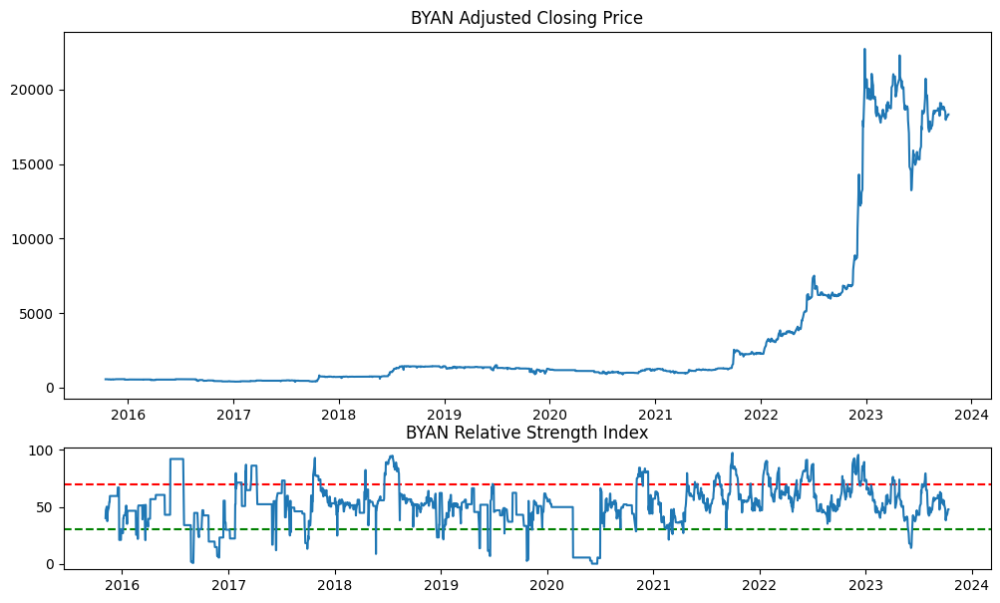

In [ ]:
BCA_multi['RSI'] = ta.rsi(BCA_multi['Adj Close'])
UNVR_multi['RSI'] = ta.rsi(UNVR_multi['Adj Close'])
BYAN_multi['RSI'] = ta.rsi(BYAN_multi['Adj Close'])

fig, ax = plt.subplots(2,1,gridspec_kw = {'height_ratios' : [3,1]},figsize = (12,7))
ax[0].plot(BCA_multi['Adj Close'])
ax[0].set_title('BCA Adjusted Closing Price')
ax[1].axhline(y = 70, color = 'r', linestyle = '--')
ax[1].axhline(y = 30, color = 'g', linestyle = '--')
ax[1].plot(BCA_multi['RSI'])
ax[1].set_title('BBCA Relative Strength Index')

fig, ax = plt.subplots(2,1,gridspec_kw = {'height_ratios' : [3,1]},figsize = (12,7))
ax[0].plot(UNVR_multi['Adj Close'])
ax[0].set_title('UNVR Adjusted Closing Price')
ax[1].axhline(y = 70, color = 'r', linestyle = '--')
ax[1].axhline(y = 30, color = 'g', linestyle = '--')
ax[1].plot(UNVR_multi['RSI'])
ax[1].set_title('UNVR Relative Strength Index')

fig, ax = plt.subplots(2,1,gridspec_kw = {'height_ratios' : [3,1]},figsize = (12,7))
ax[0].plot(BYAN_multi['Adj Close'])
ax[0].set_title('BYAN Adjusted Closing Price')
ax[1].axhline(y = 70, color = 'r', linestyle = '--')
ax[1].axhline(y = 30, color = 'g', linestyle = '--')
ax[1].plot(BYAN_multi['RSI'])
ax[1].set_title('BYAN Relative Strength Index')

### Volatility

Apart from utilizing the '10-day volatility' as our target variable, we will also incorporate the '21-day volatility' as one of our features.

<ipython-input-230-b8edcd47238b>:11: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



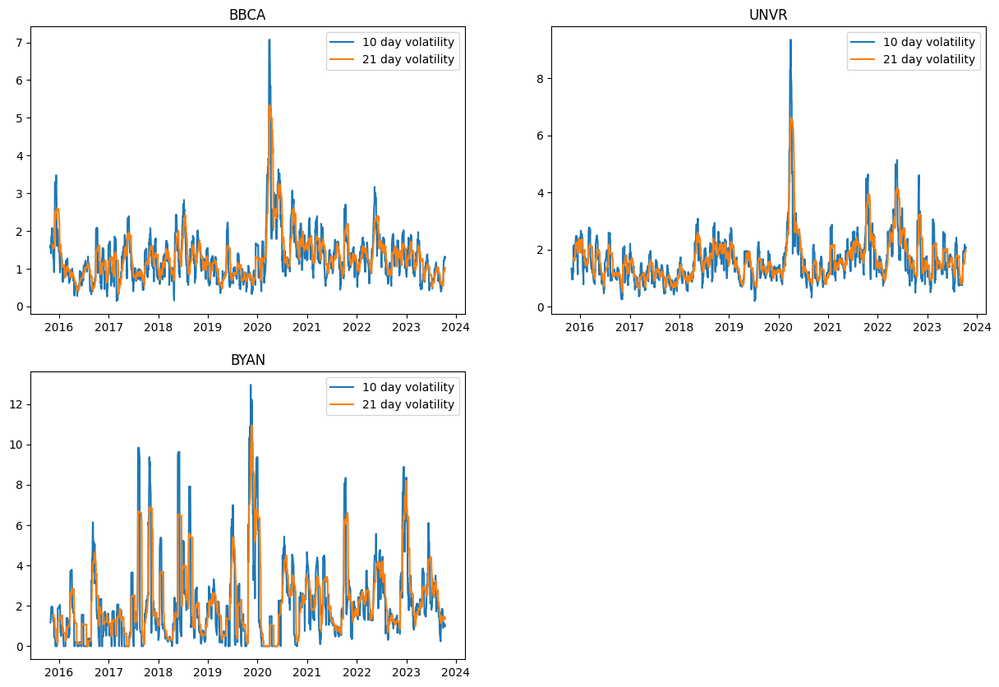

In [ ]:
BCA_multi['21 day volatility'] = BCA_multi['log return'].rolling(window=21).std()
BCA_multi['10 day volatility'] = BCA_multi['log return'].rolling(window=10).std()

UNVR_multi['21 day volatility'] = UNVR_multi['log return'].rolling(window=21).std()
UNVR_multi['10 day volatility'] = UNVR_multi['log return'].rolling(window=10).std()

BYAN_multi['21 day volatility'] = BYAN_multi['log return'].rolling(window=21).std()
BYAN_multi['10 day volatility'] = BYAN_multi['log return'].rolling(window=10).std()

plt.subplots(figsize = (15,10))
plt.subplot(2,2,1)
plt.plot(BCA_multi['10 day volatility'])
plt.plot(BCA_multi['21 day volatility'])
plt.legend(['10 day volatility', '21 day volatility'])
plt.title('BBCA')

plt.subplot(2,2,2)
plt.plot(UNVR_multi['10 day volatility'])
plt.plot(UNVR_multi['21 day volatility'])
plt.legend(['10 day volatility', '21 day volatility'])
plt.title('UNVR')


plt.subplot(2,2,3)
plt.plot(BYAN_multi['10 day volatility'])
plt.plot(BYAN_multi['21 day volatility'])
plt.legend(['10 day volatility', '21 day volatility'])
plt.title('BYAN');

Our feature set includes Log Return, previous 10-day SMA (Simple Moving Average), previous 21-day SMA (Simple Moving Average), RSI (Relative Strength Index), previous 21-day volatility, and previous 10 day volatility. To feed these features into the LSTM, the data will be structured into sequences or time windows of size 5.

### Correlation of each Features against the target variable

In [ ]:
BCA_multi = BCA_multi.dropna()
BCA_multi = BCA_multi.drop(['Adj Close', 'simple return'], axis = 1)
BCA_multi.corr().abs()['10 day volatility'].sort_values(ascending=False)

10 day volatility    1.000000
21 day volatility    0.821668
RSI                  0.179647
21 day SMA           0.059748
log return           0.048794
10 day SMA           0.048193
Name: 10 day volatility, dtype: float64

In [ ]:
UNVR_multi = UNVR_multi.dropna()
UNVR_multi = UNVR_multi.drop(['Adj Close', 'simple return'], axis = 1)
UNVR_multi.corr().abs()['10 day volatility'].sort_values(ascending=False)

10 day volatility    1.000000
21 day volatility    0.819976
21 day SMA           0.286216
10 day SMA           0.280364
log return           0.066623
RSI                  0.043291
Name: 10 day volatility, dtype: float64

In [ ]:
BYAN_multi = BYAN_multi.dropna()
BYAN_multi = BYAN_multi.drop(['Adj Close', 'simple return'], axis = 1)
BYAN_multi.corr().abs()['10 day volatility'].sort_values(ascending=False)

10 day volatility    1.000000
21 day volatility    0.785436
RSI                  0.155051
10 day SMA           0.120689
21 day SMA           0.106451
log return           0.104256
Name: 10 day volatility, dtype: float64

### Data Scaling

Next, we will perform data scaling using the most commonly used technique, which is Min-Max Scaling. Min-Max Scaling is a method that transforms data into the range 0 to 1 by subtracting the original values by the minimum value and dividing by the difference between the maximum and minimum values. It preserves the original data
interpretation but is sensitive to outliers and can result in information loss regarding the true data distribution. Below is the formula for Min-Max Scaling.
$$x_{scaled} = \frac{x - x_{min}}{x_{max} - x_{min}}$$

In [ ]:
BCA_multi_copy = BCA_multi.copy()
UNVR_multi_copy = UNVR_multi.copy()
BYAN_multi_copy = BYAN_multi.copy()
scaler = MinMaxScaler()
def scaling_data(data):
    features = [features for features in data.columns if features not in ('10 day volatility')]
    data[features] = scaler.fit_transform(data[features])
    return data

BCA_multi = scaling_data(BCA_multi)
UNVR_multi = scaling_data(UNVR_multi)
BYAN_multi = scaling_data(BYAN_multi)

In [ ]:
BCA_multi

,log return,10 day SMA,21 day SMA,RSI,21 day volatility,10 day volatility
Date,,,,,,
2015-11-13,0.341862,0.002777,0.002935,0.441484,0.260956,1.734840
2015-11-16,0.332274,0.003228,0.003122,0.430681,0.255150,1.700296
2015-11-17,0.411631,0.003305,0.003189,0.538879,0.244874,1.521283
2015-11-18,0.324512,0.002568,0.003105,0.514851,0.244280,1.341840
2015-11-19,0.300616,0.001203,0.002720,0.457149,0.243524,1.294241
...,...,...,...,...,...,...
2023-10-09,0.351682,0.958714,0.969902,0.467500,0.122428,1.244855
2023-10-10,0.282861,0.957646,0.968534,0.377985,0.130250,1.296590
2023-10-11,0.340265,0.957290,0.967166,0.377985,0.130250,1.285913


### Train Test Split

The cell below is a function that creates a windowed dataframe consisting of sequences of rows.

In [ ]:
def windowed_df2(data, n):
    dates = []
    data_as_np = data.to_numpy()
    l = data.shape[0]
    dates = []
    X, Y = [], []
    for i in range(n, l):
        indexes = data.index[i-n:i+1]
        row = [r for r in data_as_np[i-n:i]]
        X.append(row)
        y = data_as_np[i][-1]
        Y.append(y)
        dates.append(indexes[-1])
    return np.array(X), np.array(Y), np.array(dates)

In [ ]:
BCAm_X, BCAm_y, BCAm_dates = windowed_df2(BCA_multi,5)
UNVRm_X, UNVRm_y, UNVRm_dates = windowed_df2(UNVR_multi,5)
BYANm_X, BYANm_y, BYANm_dates = windowed_df2(BYAN_multi,5)

BCAm_X.shape, BCAm_y.shape, BCAm_dates.shape

((1967, 5, 6), (1967,), (1967,))

We will split our data as follows: 80% for training, 10% for validation, and 10% for testing.

<ipython-input-238-399e6ee5185d>:17: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



((1573,), (1573, 5, 6), (1573,))

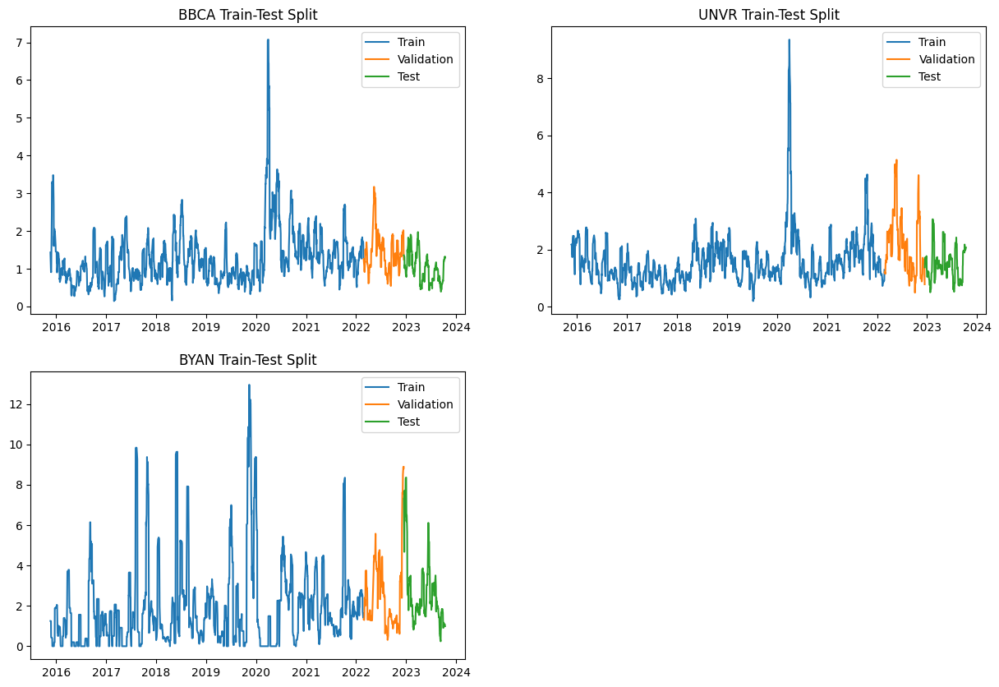

In [ ]:
Mq_80 = int(len(BCAm_dates) * .8)
Mq_90 = int(len(BCAm_dates) * .9)

BCAm_dates_train, BCAm_X_train, BCAm_y_train = BCAm_dates[:Mq_80], BCAm_X[:Mq_80], BCAm_y[:Mq_80]
UNVRm_dates_train, UNVRm_X_train, UNVRm_y_train = UNVRm_dates[:Mq_80], UNVRm_X[:Mq_80], UNVRm_y[:Mq_80]
BYANm_dates_train, BYANm_X_train, BYANm_y_train = BYANm_dates[:Mq_80], BYANm_X[:Mq_80], BYANm_y[:Mq_80]

BCAm_dates_val, BCAm_X_val, BCAm_y_val = BCAm_dates[Mq_80:Mq_90], BCAm_X[Mq_80:Mq_90], BCAm_y[Mq_80:Mq_90]
UNVRm_dates_val, UNVRm_X_val, UNVRm_y_val = UNVRm_dates[Mq_80:Mq_90], UNVRm_X[Mq_80:Mq_90], UNVRm_y[Mq_80:Mq_90]
BYANm_dates_val, BYANm_X_val, BYANm_y_val = BYANm_dates[Mq_80:Mq_90], BYANm_X[Mq_80:Mq_90], BYANm_y[Mq_80:Mq_90]

BCAm_dates_test, BCAm_X_test, BCAm_y_test = BCAm_dates[Mq_90:], BCAm_X[Mq_90:], BCAm_y[Mq_90:]
UNVRm_dates_test, UNVRm_X_test, UNVRm_y_test = UNVRm_dates[Mq_90:], UNVRm_X[Mq_90:], UNVRm_y[Mq_90:]
BYANm_dates_test, BYANm_X_test, BYANm_y_test = BYANm_dates[Mq_90:], BYANm_X[Mq_90:], BYANm_y[Mq_90:]

plt.subplots(figsize = (15,10))
plt.subplot(2,2,1)
plt.plot(BCAm_dates_train, BCAm_y_train)
plt.plot(BCAm_dates_val, BCAm_y_val)
plt.plot(BCAm_dates_test, BCAm_y_test)
plt.legend(['Train', 'Validation', 'Test'])
plt.title('BBCA Train-Test Split')

plt.subplot(2,2,2)
plt.plot(UNVRm_dates_train, UNVRm_y_train)
plt.plot(UNVRm_dates_val, UNVRm_y_val)
plt.plot(UNVRm_dates_test, UNVRm_y_test)
plt.legend(['Train', 'Validation', 'Test'])
plt.title('UNVR Train-Test Split')

plt.subplot(2,2,3)
plt.plot(BYANm_dates_train, BYANm_y_train)
plt.plot(BYANm_dates_val, BYANm_y_val)
plt.plot(BYANm_dates_test, BYANm_y_test)
plt.legend(['Train', 'Validation', 'Test'])
plt.title('BYAN Train-Test Split')

BCAm_dates_train.shape, BCAm_X_train.shape, BCAm_y_train.shape

## Find Best Multivariate LSTM Model for BCA
***

We will fit several different multivariate LSTM model to find the best model for predicting BCA stock prive volatility. The model that will be tested are as follows:
- 1 LSTM layer, 1 Dense Layer
- 2 LSTM layer, 1 Dense Layer
- 1 LSTM layer, 2 Dense Layer
- 2 LSTM layer, 2 Dense Layer
- 3 LSTM layer, 3 Dense Layer

#### Define Early Stopping

In [ ]:
early_stopping = EarlyStopping(
    monitor = 'val_loss',
    min_delta=0.0001,
    patience=5,
    restore_best_weights=True,
)

### 1 LSTM 1 Dense

In [ ]:
BCAMultivariate11 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', input_shape = (5,6)),
    layers.Dense(1, activation = 'linear')
])

BCAMultivariate11.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

BCAMultivariate11.summary()

Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_52 (LSTM)              (None, 64)                18176     
                                                                 
 dense_53 (Dense)            (None, 1)                 65        
                                                                 
Total params: 18241 (71.25 KB)
Trainable params: 18241 (71.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch 1/1000
50/50 [==============================] - 2s 15ms/step - loss: 0.8370 - mean_absolute_error: 0.6643 - val_loss: 0.2211 - val_mean_absolute_error: 0.3606
Epoch 2/1000
50/50 [==============================] - 0s 6ms/step - loss: 0.4206 - mean_absolute_error: 0.4436 - val_loss: 0.1894 - val_mean_absolute_error: 0.3348
Epoch 3/1000
50/50 [==============================] - 0s 7ms/step - loss: 0.3544 - mean_absolute_error: 0.4065 - val_loss: 0.1577 - val_mean_absolute_error: 0.3065
Epoch 4/1000
50/50 [==============================] - 0s 6ms/step - loss: 0.2918 - mean_absolute_error: 0.3710 - val_loss: 0.1263 - val_mean_absolute_error: 0.2761
Epoch 5/1000
50/50 [==============================] - 0s 7ms/step - loss: 0.2255 - mean_absolute_error: 0.3183 - val_loss: 0.0976 - val_mean_absolute_error: 0.2389
Epoch 6/1000
50/50 [==============================] - 0s 7ms/step - loss: 0.1669 - mean_absolute_error: 0.2668 - val_loss: 0.0741 - val_mean_absolute_error: 0.2063
Epoch 7/1000
50

<Axes: >

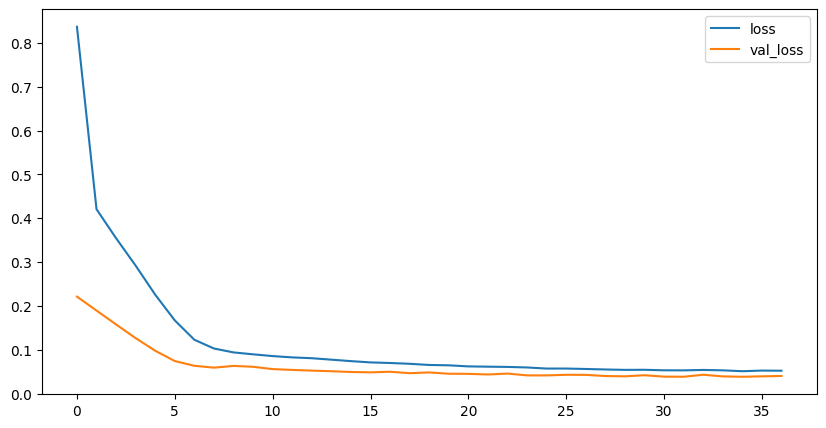

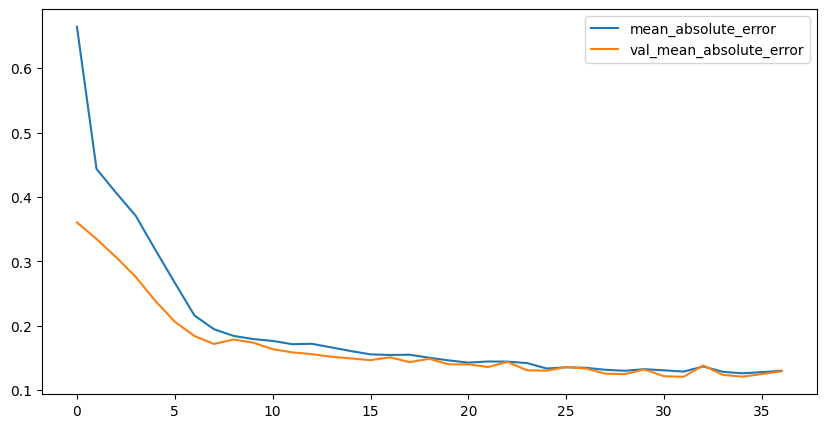

In [ ]:
BCAM11_history = BCAMultivariate11.fit(BCAm_X_train, BCAm_y_train, validation_data=(BCAm_X_val, BCAm_y_val), epochs=1000, callbacks = [early_stopping])

BCAM11_history_df = pd.DataFrame(BCAM11_history.history)
BCAM11_history_df.loc[:, ['loss', 'val_loss']].plot()
BCAM11_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BCAM11_test_predictions = BCAMultivariate11.predict(BCAm_X_test).flatten()
BCAM11_test_mae = mean_absolute_error(BCAm_y_test, BCAM11_test_predictions)
BCAM11_test_rmse = np.sqrt(mean_squared_error(BCAm_y_test, BCAM11_test_predictions))
BCAM11_test_mape = mean_absolute_percentage_error(BCAm_y_test, BCAM11_test_predictions)
BCAM11_test_mae, BCAM11_test_rmse, BCAM11_test_mape

7/7 [==============================] - 0s 3ms/step


(0.09538907531815537, 0.13533760090032718, 0.10996594110440612)

### 2 LSTM 1 Dense

In [ ]:
BCAMultivariate21 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,6)),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(1, activation = 'linear')
])

BCAMultivariate21.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

BCAMultivariate21.summary()

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_41 (LSTM)              (None, 5, 64)             18176     
                                                                 
 lstm_42 (LSTM)              (None, 64)                33024     
                                                                 
 dense_42 (Dense)            (None, 1)                 65        
                                                                 
Total params: 51265 (200.25 KB)
Trainable params: 51265 (200.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch 1/1000
50/50 [==============================] - 10s 45ms/step - loss: 0.6325 - mean_absolute_error: 0.5554 - val_loss: 0.2436 - val_mean_absolute_error: 0.3776
Epoch 2/1000
50/50 [==============================] - 1s 15ms/step - loss: 0.4556 - mean_absolute_error: 0.4651 - val_loss: 0.2008 - val_mean_absolute_error: 0.3379
Epoch 3/1000
50/50 [==============================] - 1s 16ms/step - loss: 0.2171 - mean_absolute_error: 0.3077 - val_loss: 0.2179 - val_mean_absolute_error: 0.3958
Epoch 4/1000
50/50 [==============================] - 1s 18ms/step - loss: 0.1616 - mean_absolute_error: 0.2834 - val_loss: 0.0993 - val_mean_absolute_error: 0.2395
Epoch 5/1000
50/50 [==============================] - 1s 18ms/step - loss: 0.1349 - mean_absolute_error: 0.2510 - val_loss: 0.1123 - val_mean_absolute_error: 0.2475
Epoch 6/1000
50/50 [==============================] - 1s 18ms/step - loss: 0.1245 - mean_absolute_error: 0.2350 - val_loss: 0.1009 - val_mean_absolute_error: 0.2368
Epoch 7/1

<Axes: >

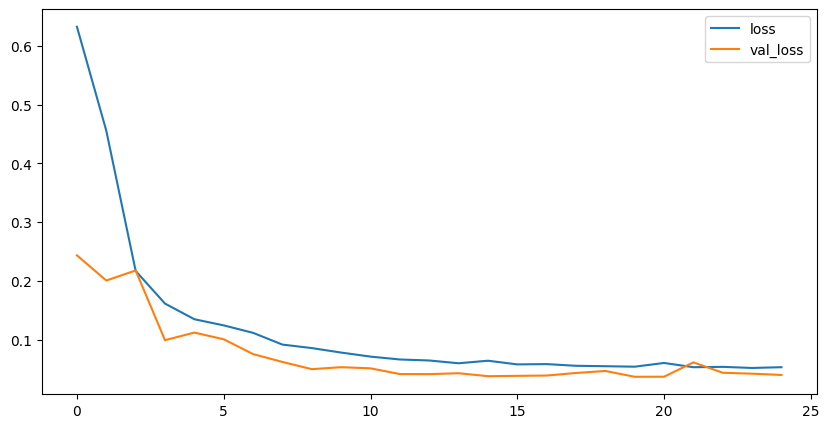

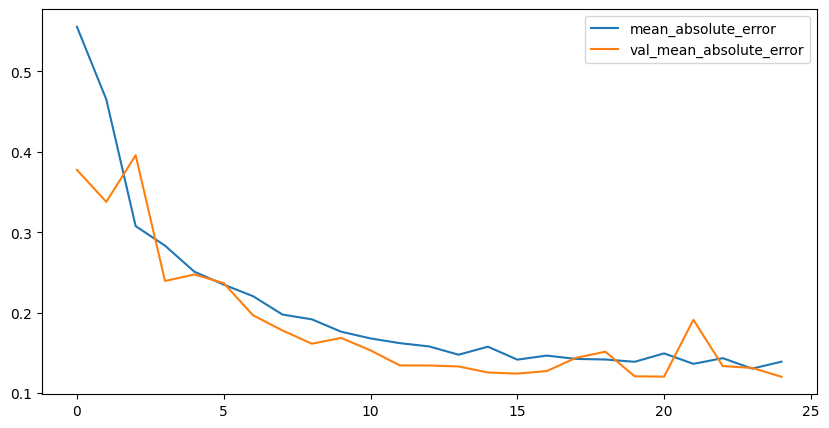

In [ ]:
BCAM21_history = BCAMultivariate21.fit(BCAm_X_train, BCAm_y_train, validation_data=(BCAm_X_val, BCAm_y_val), epochs=1000, callbacks = [early_stopping])

BCAM21_history_df = pd.DataFrame(BCAM21_history.history)
BCAM21_history_df.loc[:, ['loss', 'val_loss']].plot()
BCAM21_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BCAM21_test_predictions = BCAMultivariate21.predict(BCAm_X_test).flatten()
BCAM21_test_mae = mean_absolute_error(BCAm_y_test, BCAM21_test_predictions)
BCAM21_test_rmse = np.sqrt(mean_squared_error(BCAm_y_test, BCAM21_test_predictions))
BCAM21_test_mape = mean_absolute_percentage_error(BCAm_y_test, BCAM21_test_predictions)
BCAM21_test_mae, BCAM21_test_rmse, BCAM21_test_mape

7/7 [==============================] - 1s 3ms/step


(0.11143851234348982, 0.1453600311807999, 0.13353695050131395)

### 1 LSTM 2 Dense

In [ ]:
BCAMultivariate12 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', input_shape = (5,6)),
    layers.Dense(32,activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

BCAMultivariate12.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

BCAMultivariate12.summary()

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_43 (LSTM)              (None, 64)                18176     
                                                                 
 dense_43 (Dense)            (None, 32)                2080      
                                                                 
 dense_44 (Dense)            (None, 1)                 33        
                                                                 
Total params: 20289 (79.25 KB)
Trainable params: 20289 (79.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch 1/1000
50/50 [==============================] - 7s 21ms/step - loss: 0.4773 - mean_absolute_error: 0.4715 - val_loss: 0.1829 - val_mean_absolute_error: 0.3336
Epoch 2/1000
50/50 [==============================] - 0s 9ms/step - loss: 0.2993 - mean_absolute_error: 0.3706 - val_loss: 0.0922 - val_mean_absolute_error: 0.2365
Epoch 3/1000
50/50 [==============================] - 0s 8ms/step - loss: 0.1197 - mean_absolute_error: 0.2252 - val_loss: 0.0850 - val_mean_absolute_error: 0.2287
Epoch 4/1000
50/50 [==============================] - 0s 8ms/step - loss: 0.0796 - mean_absolute_error: 0.1807 - val_loss: 0.0527 - val_mean_absolute_error: 0.1559
Epoch 5/1000
50/50 [==============================] - 1s 13ms/step - loss: 0.0750 - mean_absolute_error: 0.1741 - val_loss: 0.0839 - val_mean_absolute_error: 0.2284
Epoch 6/1000
50/50 [==============================] - 1s 14ms/step - loss: 0.0720 - mean_absolute_error: 0.1695 - val_loss: 0.0487 - val_mean_absolute_error: 0.1479
Epoch 7/1000


<Axes: >

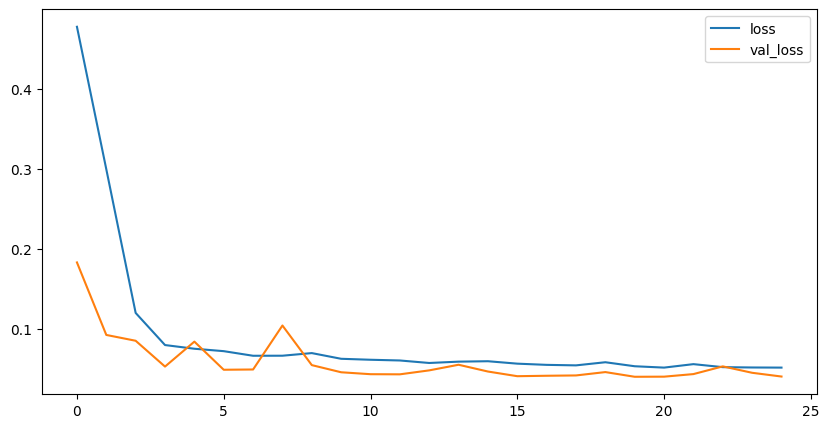

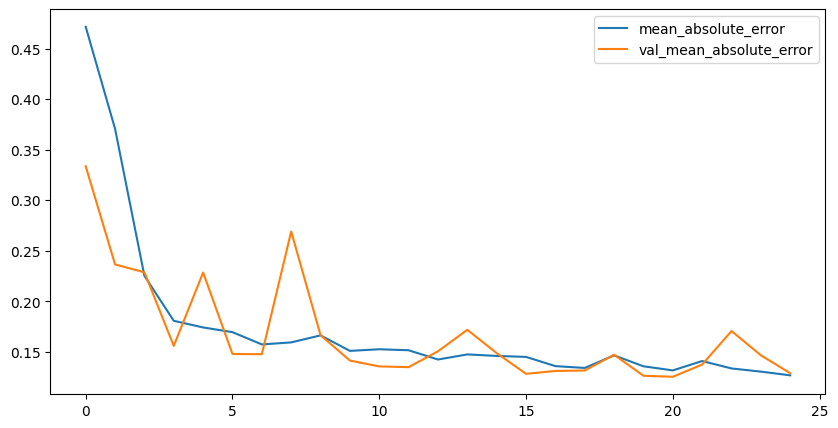

In [ ]:
BCAM12_history = BCAMultivariate12.fit(BCAm_X_train, BCAm_y_train, validation_data=(BCAm_X_val, BCAm_y_val), epochs=1000, callbacks = [early_stopping])

BCAM12_history_df = pd.DataFrame(BCAM12_history.history)
BCAM12_history_df.loc[:, ['loss', 'val_loss']].plot()
BCAM12_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BCAM12_test_predictions = BCAMultivariate12.predict(BCAm_X_test).flatten()
BCAM12_test_mae = mean_absolute_error(BCAm_y_test, BCAM12_test_predictions)
BCAM12_test_rmse = np.sqrt(mean_squared_error(BCAm_y_test, BCAM12_test_predictions))
BCAM12_test_mape = mean_absolute_percentage_error(BCAm_y_test, BCAM12_test_predictions)
BCAM12_test_mae, BCAM12_test_rmse, BCAM12_test_mape

7/7 [==============================] - 1s 5ms/step


(0.11124361779301736, 0.14759642576175924, 0.13287595503129246)

### 2 LSTM 2 Dense

In [ ]:
BCAMultivariate22 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,6)),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(32,activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

BCAMultivariate22.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

BCAMultivariate22.summary()

Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_49 (LSTM)              (None, 5, 64)             18176     
                                                                 
 lstm_50 (LSTM)              (None, 64)                33024     
                                                                 
 dense_50 (Dense)            (None, 32)                2080      
                                                                 
 dense_51 (Dense)            (None, 1)                 33        
                                                                 
Total params: 53313 (208.25 KB)
Trainable params: 53313 (208.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Epoch 1/1000
50/50 [==============================] - 4s 20ms/step - loss: 0.6191 - mean_absolute_error: 0.5553 - val_loss: 0.2528 - val_mean_absolute_error: 0.3839
Epoch 2/1000
50/50 [==============================] - 0s 8ms/step - loss: 0.4749 - mean_absolute_error: 0.4736 - val_loss: 0.1754 - val_mean_absolute_error: 0.3235
Epoch 3/1000
50/50 [==============================] - 0s 8ms/step - loss: 0.2270 - mean_absolute_error: 0.3268 - val_loss: 0.1728 - val_mean_absolute_error: 0.3390
Epoch 4/1000
50/50 [==============================] - 0s 7ms/step - loss: 0.1561 - mean_absolute_error: 0.2735 - val_loss: 0.1169 - val_mean_absolute_error: 0.2572
Epoch 5/1000
50/50 [==============================] - 0s 7ms/step - loss: 0.1370 - mean_absolute_error: 0.2462 - val_loss: 0.0857 - val_mean_absolute_error: 0.2122
Epoch 6/1000
50/50 [==============================] - 0s 8ms/step - loss: 0.1296 - mean_absolute_error: 0.2404 - val_loss: 0.0924 - val_mean_absolute_error: 0.2200
Epoch 7/1000
50

<Axes: >

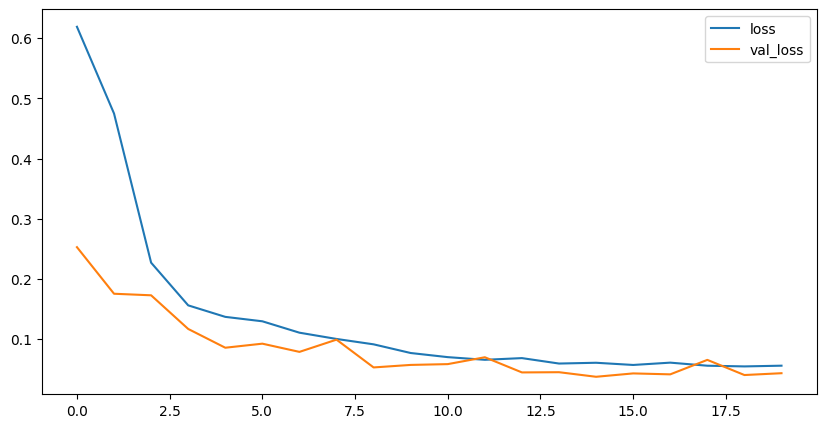

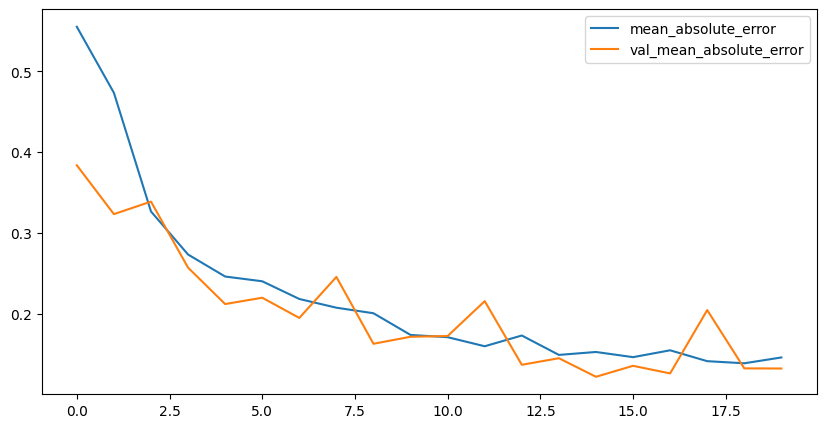

In [ ]:
BCAM22_history = BCAMultivariate22.fit(BCAm_X_train, BCAm_y_train, validation_data=(BCAm_X_val, BCAm_y_val), epochs=1000, callbacks = [early_stopping])

BCAM22_history_df = pd.DataFrame(BCAM22_history.history)
BCAM22_history_df.loc[:, ['loss', 'val_loss']].plot()
BCAM22_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BCAM22_test_predictions = BCAMultivariate22.predict(BCAm_X_test).flatten()
BCAM22_test_mae = mean_absolute_error(BCAm_y_test, BCAM22_test_predictions)
BCAM22_test_rmse = np.sqrt(mean_squared_error(BCAm_y_test, BCAM22_test_predictions))
BCAM22_test_mape = mean_absolute_percentage_error(BCAm_y_test, BCAM22_test_predictions)
BCAM22_test_mae, BCAM22_test_rmse, BCAM22_test_mape

7/7 [==============================] - 1s 3ms/step


(0.10910894880877543, 0.1430799733291263, 0.13119014266908693)

### 3 LSTM 3 Dense

In [ ]:
BCAMultivariate33 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,6)),
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(64,activation = 'relu'),
    layers.Dense(32, activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

BCAMultivariate33.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

BCAMultivariate33.summary()

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_46 (LSTM)              (None, 5, 64)             18176     
                                                                 
 lstm_47 (LSTM)              (None, 5, 64)             33024     
                                                                 
 lstm_48 (LSTM)              (None, 64)                33024     
                                                                 
 dense_47 (Dense)            (None, 64)                4160      
                                                                 
 dense_48 (Dense)            (None, 32)                2080      
                                                                 
 dense_49 (Dense)            (None, 1)                 33        
                                                                 
Total params: 90497 (353.50 KB)
Trainable params: 904

Epoch 1/1000
50/50 [==============================] - 14s 63ms/step - loss: 0.7324 - mean_absolute_error: 0.5997 - val_loss: 0.2895 - val_mean_absolute_error: 0.4059
Epoch 2/1000
50/50 [==============================] - 1s 29ms/step - loss: 0.5499 - mean_absolute_error: 0.5071 - val_loss: 0.2716 - val_mean_absolute_error: 0.3967
Epoch 3/1000
50/50 [==============================] - 1s 23ms/step - loss: 0.5430 - mean_absolute_error: 0.5043 - val_loss: 0.2447 - val_mean_absolute_error: 0.3809
Epoch 4/1000
50/50 [==============================] - 1s 22ms/step - loss: 0.4636 - mean_absolute_error: 0.4627 - val_loss: 0.1308 - val_mean_absolute_error: 0.2730
Epoch 5/1000
50/50 [==============================] - 2s 42ms/step - loss: 0.1915 - mean_absolute_error: 0.2920 - val_loss: 0.1240 - val_mean_absolute_error: 0.2604
Epoch 6/1000
50/50 [==============================] - 2s 40ms/step - loss: 0.1644 - mean_absolute_error: 0.2802 - val_loss: 0.1283 - val_mean_absolute_error: 0.2711
Epoch 7/1

<Axes: >

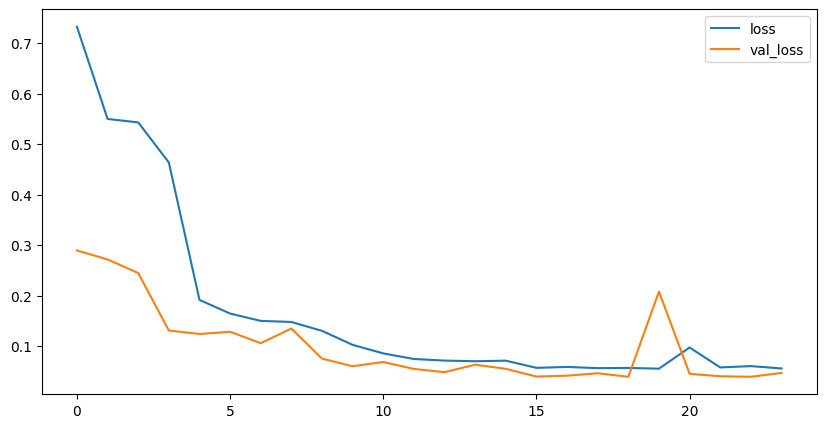

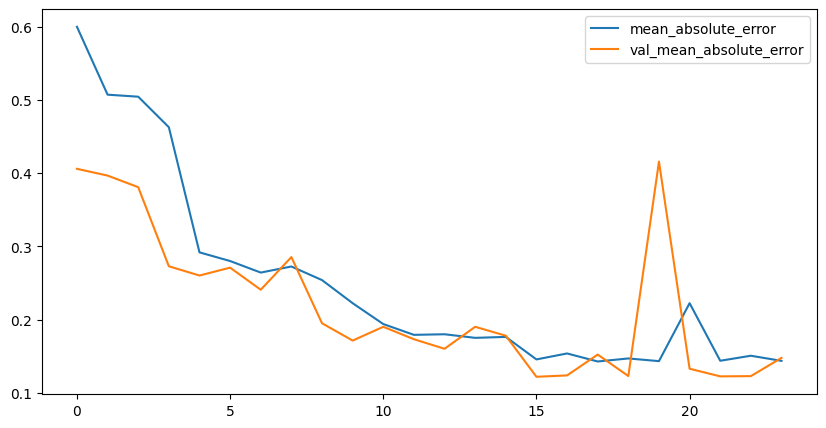

In [ ]:
BCAM33_history = BCAMultivariate33.fit(BCAm_X_train, BCAm_y_train, validation_data=(BCAm_X_val, BCAm_y_val), epochs=1000, callbacks = [early_stopping])

BCAM33_history_df = pd.DataFrame(BCAM33_history.history)
BCAM33_history_df.loc[:, ['loss', 'val_loss']].plot()
BCAM33_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BCAM33_test_predictions = BCAMultivariate33.predict(BCAm_X_test).flatten()
BCAM33_test_mae = mean_absolute_error(BCAm_y_test, BCAM33_test_predictions)
BCAM33_test_rmse = np.sqrt(mean_squared_error(BCAm_y_test, BCAM33_test_predictions))
BCAM33_test_mape = mean_absolute_percentage_error(BCAm_y_test, BCAM33_test_predictions)
BCAM33_test_mae, BCAM33_test_rmse, BCAM33_test_mape

7/7 [==============================] - 1s 5ms/step


(0.12434756695803437, 0.15715761277572196, 0.15452873883274)

### Evaluate

<ipython-input-257-a20ab14a4b0d>:2: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



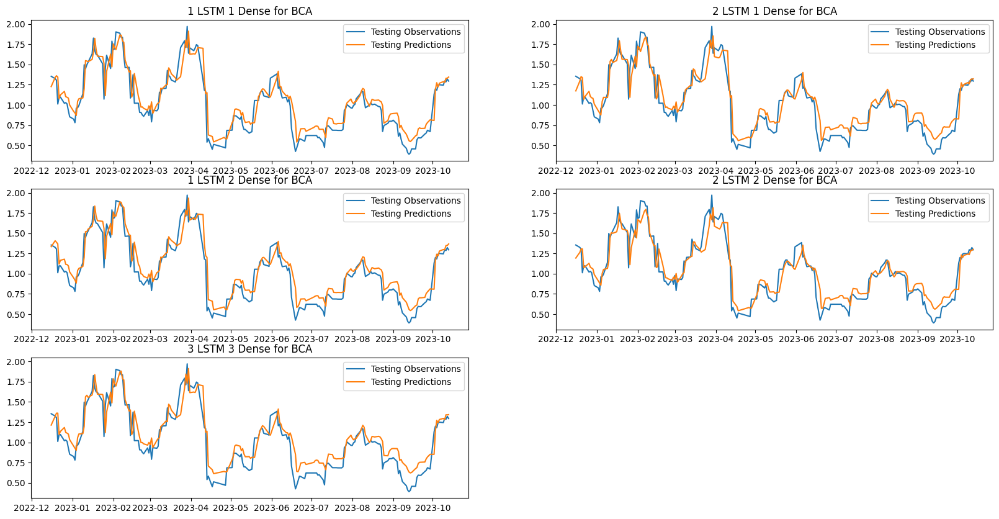

In [ ]:
fig, ax = plt.subplots(figsize = (20,10))
plt.subplot(3,2,1)
plt.plot(BCAm_dates_test, BCAm_y_test)
plt.plot(BCAm_dates_test, BCAM11_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('1 LSTM 1 Dense for BCA')

plt.subplot(3,2,2)
plt.plot(BCAm_dates_test, BCAm_y_test)
plt.plot(BCAm_dates_test, BCAM21_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('2 LSTM 1 Dense for BCA')

plt.subplot(3,2,3)
plt.plot(BCAm_dates_test, BCAm_y_test)
plt.plot(BCAm_dates_test, BCAM12_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('1 LSTM 2 Dense for BCA')

plt.subplot(3,2,4)
plt.plot(BCAm_dates_test, BCAm_y_test)
plt.plot(BCAm_dates_test, BCAM22_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('2 LSTM 2 Dense for BCA')

plt.subplot(3,2,5)
plt.plot(BCAm_dates_test, BCAm_y_test)
plt.plot(BCAm_dates_test, BCAM33_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('3 LSTM 3 Dense for BCA');

In [ ]:
BCAM_Eval = {'MAE': [BCAM11_test_mae, BCAM21_test_mae, BCAM12_test_mae, BCAM22_test_mae, BCAM33_test_mae],
             'RMSE': [BCAM11_test_rmse, BCAM21_test_rmse, BCAM12_test_rmse, BCAM22_test_rmse, BCAM33_test_rmse],
             'MAPE': [BCAM11_test_mape, BCAM21_test_mape, BCAM12_test_mape, BCAM22_test_mape, BCAM33_test_mape]
            }

BCAM_Table = pd.DataFrame(BCAM_Eval, index =['1 LSTM 1 Dense', '2 LSTM 1 Dense', '1 LSTM 2 Dense', '2 LSTM 2 Dense', '3 LSTM 3 Dense'])
BCAM_Table

,MAE,RMSE,MAPE
1 LSTM 1 Dense,0.095389,0.135338,0.109966
2 LSTM 1 Dense,0.111439,0.145360,0.133537
1 LSTM 2 Dense,0.111244,0.147596,0.132876
2 LSTM 2 Dense,0.109109,0.143080,0.131190
3 LSTM 3 Dense,0.124348,0.157158,0.154529


<Axes: >

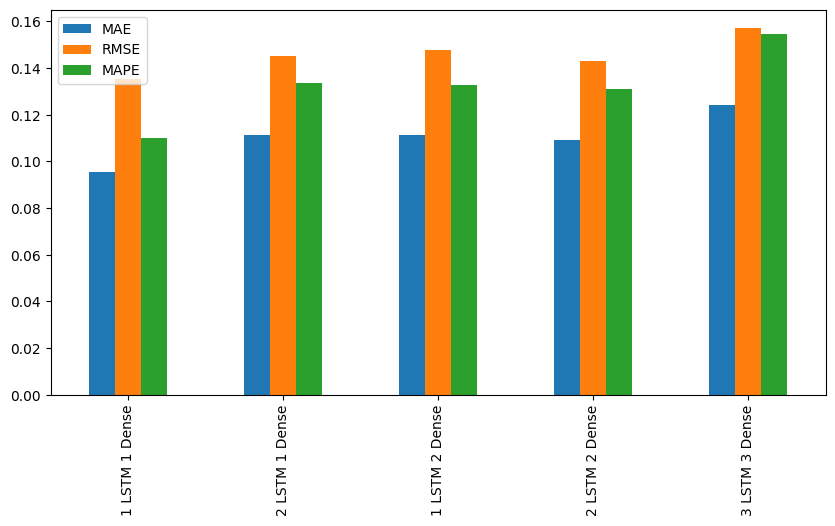

In [ ]:
BCAM_Table.plot(kind = 'bar')

The MAE, RMSE, and MAPE results show that 1 LSTM layer and 1 Dense layer is the best multivariate model for BCA

In [ ]:
BCAMultivariate11.save("BCAMultivariate11.h5")
BCAMultivariate11.save("BCAMultivariate_11")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



In [ ]:
#BCAMultivariate12 = keras.models.load_model("BCAMultivariate12.h5")

## Finding Best Multivariate LSTM Model for UNVR
***

We will fit several different multivariate LSTM model to find the best model for predicting UNVR stock prive volatility. The model that will be tested are as follows:
- 1 LSTM layer, 1 Dense Layer
- 2 LSTM layer, 1 Dense Layer
- 1 LSTM layer, 2 Dense Layer
- 2 LSTM layer, 2 Dense Layer
- 3 LSTM layer, 3 Dense Layer

### 1 LSTM 1 Dense

In [ ]:
UNVRMultivariate11 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', input_shape = (5,6)),
    layers.Dense(1, activation = 'linear')
])

UNVRMultivariate11.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 2s 9ms/step - loss: 0.9784 - mean_absolute_error: 0.6810 - val_loss: 1.1691 - val_mean_absolute_error: 0.7900
Epoch 2/100
50/50 [==============================] - 0s 5ms/step - loss: 0.5810 - mean_absolute_error: 0.4954 - val_loss: 0.8683 - val_mean_absolute_error: 0.6784
Epoch 3/100
50/50 [==============================] - 0s 4ms/step - loss: 0.4651 - mean_absolute_error: 0.4426 - val_loss: 0.6795 - val_mean_absolute_error: 0.5975
Epoch 4/100
50/50 [==============================] - 0s 5ms/step - loss: 0.3534 - mean_absolute_error: 0.3754 - val_loss: 0.4794 - val_mean_absolute_error: 0.5001
Epoch 5/100
50/50 [==============================] - 0s 4ms/step - loss: 0.2547 - mean_absolute_error: 0.3099 - val_loss: 0.3097 - val_mean_absolute_error: 0.4120
Epoch 6/100
50/50 [==============================] - 0s 5ms/step - loss: 0.1793 - mean_absolute_error: 0.2447 - val_loss: 0.2402 - val_mean_absolute_error: 0.3509
Epoch 7/100
50/50 [===

<Axes: >

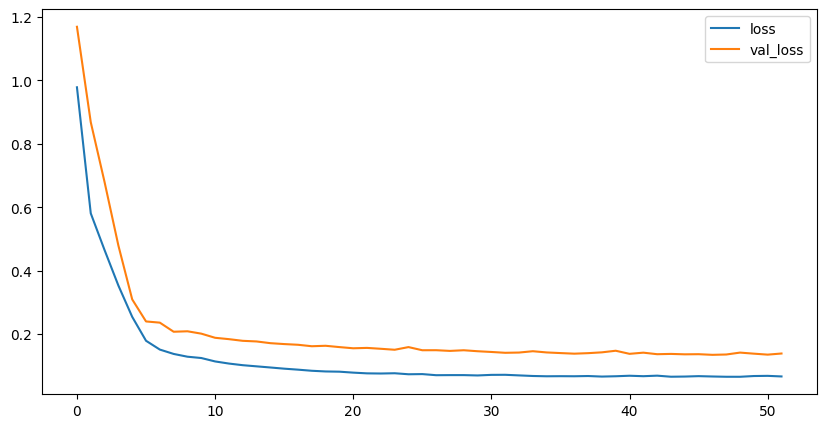

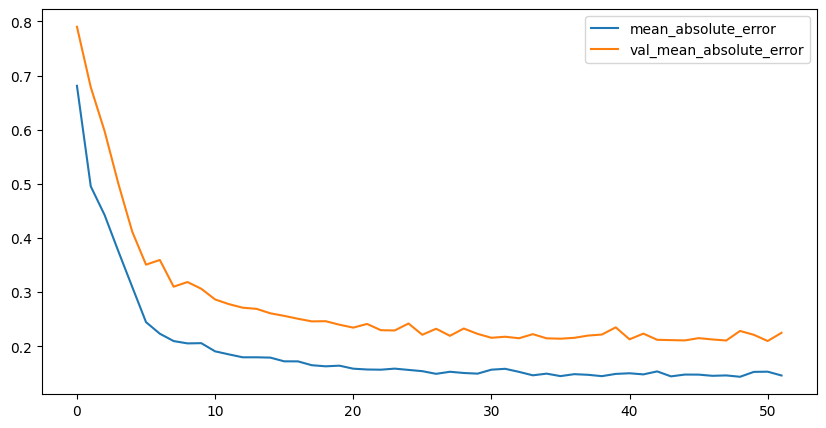

In [ ]:
UNVRM11_history = UNVRMultivariate11.fit(UNVRm_X_train, UNVRm_y_train, validation_data=(UNVRm_X_val, UNVRm_y_val), epochs=100, callbacks = [early_stopping])

UNVRM11_history_df = pd.DataFrame(UNVRM11_history.history)
UNVRM11_history_df.loc[:, ['loss', 'val_loss']].plot()
UNVRM11_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
UNVRM11_test_predictions = UNVRMultivariate11.predict(UNVRm_X_test).flatten()
UNVRM11_test_mae = mean_absolute_error(UNVRm_y_test, UNVRM11_test_predictions)
UNVRM11_test_rmse = np.sqrt(mean_squared_error(UNVRm_y_test, UNVRM11_test_predictions))
UNVRM11_test_mape = mean_absolute_percentage_error(UNVRm_y_test, UNVRM11_test_predictions)
UNVRM11_test_mae, UNVRM11_test_rmse, UNVRM11_test_mape

7/7 [==============================] - 0s 5ms/step


(0.15060361996108787, 0.25506901225459844, 0.12336547575472036)

### 2 LSTM 1 Dense

In [ ]:
UNVRMultivariate21 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,6)),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(1, activation = 'linear')
])

UNVRMultivariate21.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 5s 21ms/step - loss: 0.8091 - mean_absolute_error: 0.6135 - val_loss: 1.3077 - val_mean_absolute_error: 0.8368
Epoch 2/100
50/50 [==============================] - 0s 7ms/step - loss: 0.5792 - mean_absolute_error: 0.4982 - val_loss: 0.6173 - val_mean_absolute_error: 0.5687
Epoch 3/100
50/50 [==============================] - 0s 7ms/step - loss: 0.2370 - mean_absolute_error: 0.3293 - val_loss: 0.4071 - val_mean_absolute_error: 0.4775
Epoch 4/100
50/50 [==============================] - 0s 7ms/step - loss: 0.1772 - mean_absolute_error: 0.2762 - val_loss: 0.4384 - val_mean_absolute_error: 0.5226
Epoch 5/100
50/50 [==============================] - 0s 8ms/step - loss: 0.1582 - mean_absolute_error: 0.2625 - val_loss: 0.3065 - val_mean_absolute_error: 0.3691
Epoch 6/100
50/50 [==============================] - 0s 7ms/step - loss: 0.1485 - mean_absolute_error: 0.2560 - val_loss: 0.3328 - val_mean_absolute_error: 0.4347
Epoch 7/100
50/50 [==

<Axes: >

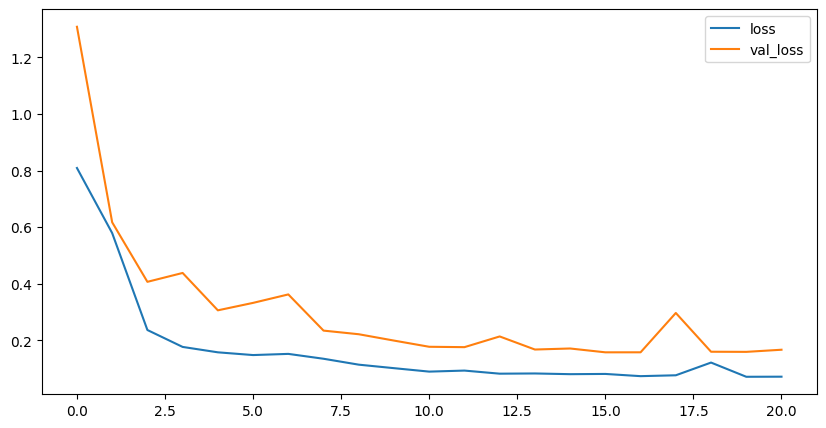

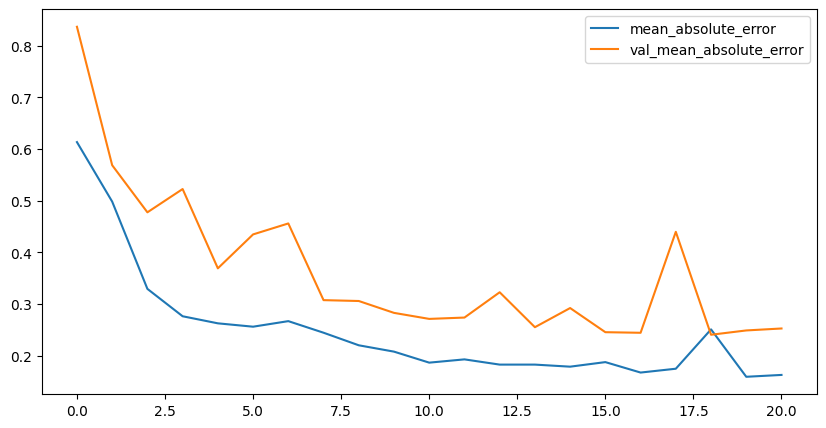

In [ ]:
UNVRM21_history = UNVRMultivariate21.fit(UNVRm_X_train, UNVRm_y_train, validation_data=(UNVRm_X_val, UNVRm_y_val), epochs=100, callbacks = [early_stopping])

UNVRM21_history_df = pd.DataFrame(UNVRM21_history.history)
UNVRM21_history_df.loc[:, ['loss', 'val_loss']].plot()
UNVRM21_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
UNVRM21_test_predictions = UNVRMultivariate21.predict(UNVRm_X_test).flatten()
UNVRM21_test_mae = mean_absolute_error(UNVRm_y_test, UNVRM21_test_predictions)
UNVRM21_test_rmse = np.sqrt(mean_squared_error(UNVRm_y_test, UNVRM21_test_predictions))
UNVRM21_test_mape = mean_absolute_percentage_error(UNVRm_y_test, UNVRM21_test_predictions)
UNVRM21_test_mae, UNVRM21_test_rmse, UNVRM21_test_mape

7/7 [==============================] - 1s 3ms/step


(0.1759244488095423, 0.2721703542485421, 0.14544649977044463)

### 1 LSTM 2 Dense

In [ ]:
UNVRMultivariate12 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', input_shape = (5,6)),
    layers.Dense(32,activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

UNVRMultivariate12.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 8s 29ms/step - loss: 1.1880 - mean_absolute_error: 0.7391 - val_loss: 1.3358 - val_mean_absolute_error: 0.8479
Epoch 2/100
50/50 [==============================] - 1s 13ms/step - loss: 0.6272 - mean_absolute_error: 0.5196 - val_loss: 1.0662 - val_mean_absolute_error: 0.7537
Epoch 3/100
50/50 [==============================] - 1s 11ms/step - loss: 0.5283 - mean_absolute_error: 0.4786 - val_loss: 0.7888 - val_mean_absolute_error: 0.6464
Epoch 4/100
50/50 [==============================] - 0s 9ms/step - loss: 0.3968 - mean_absolute_error: 0.4099 - val_loss: 0.4981 - val_mean_absolute_error: 0.5162
Epoch 5/100
50/50 [==============================] - 1s 13ms/step - loss: 0.2554 - mean_absolute_error: 0.3168 - val_loss: 0.2790 - val_mean_absolute_error: 0.4008
Epoch 6/100
50/50 [==============================] - 1s 12ms/step - loss: 0.1610 - mean_absolute_error: 0.2448 - val_loss: 0.2377 - val_mean_absolute_error: 0.3725
Epoch 7/100
50/50

<Axes: >

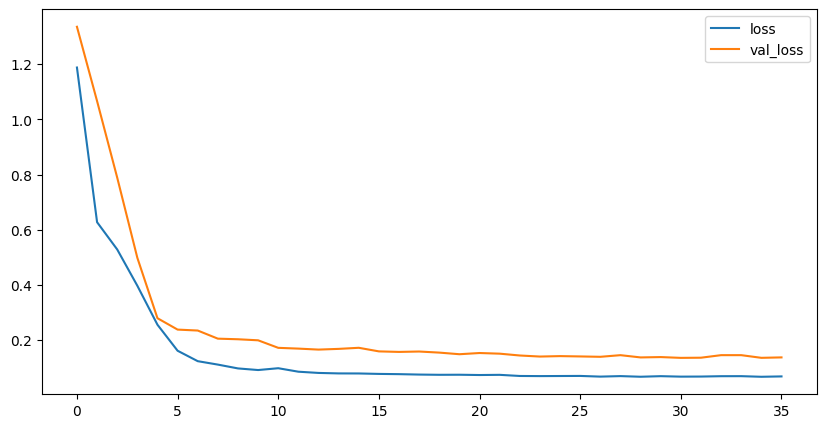

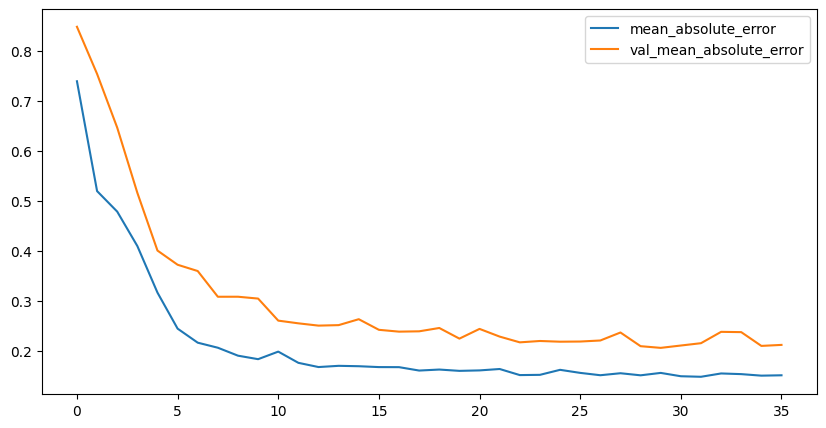

In [ ]:
UNVRM12_history = UNVRMultivariate12.fit(UNVRm_X_train, UNVRm_y_train, validation_data=(UNVRm_X_val, UNVRm_y_val), epochs=100, callbacks = [early_stopping])

UNVRM12_history_df = pd.DataFrame(UNVRM12_history.history)
UNVRM12_history_df.loc[:, ['loss', 'val_loss']].plot()
UNVRM12_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
UNVRM12_test_predictions = UNVRMultivariate12.predict(UNVRm_X_test).flatten()
UNVRM12_test_mae = mean_absolute_error(UNVRm_y_test, UNVRM12_test_predictions)
UNVRM12_test_rmse = np.sqrt(mean_squared_error(UNVRm_y_test, UNVRM12_test_predictions))
UNVRM12_test_mape = mean_absolute_percentage_error(UNVRm_y_test, UNVRM12_test_predictions)
UNVRM12_test_mae, UNVRM12_test_rmse, UNVRM12_test_mape

7/7 [==============================] - 1s 5ms/step


(0.14453248411949765, 0.2560804903173987, 0.11321128245999912)

### 2 LSTM 2 Dense

In [ ]:
UNVRMultivariate22 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,6)),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(32,activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

UNVRMultivariate22.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 4s 23ms/step - loss: 0.9376 - mean_absolute_error: 0.6629 - val_loss: 1.2424 - val_mean_absolute_error: 0.8126
Epoch 2/100
50/50 [==============================] - 1s 12ms/step - loss: 0.6555 - mean_absolute_error: 0.5271 - val_loss: 0.9324 - val_mean_absolute_error: 0.7010
Epoch 3/100
50/50 [==============================] - 1s 12ms/step - loss: 0.2932 - mean_absolute_error: 0.3514 - val_loss: 0.6070 - val_mean_absolute_error: 0.6382
Epoch 4/100
50/50 [==============================] - 1s 11ms/step - loss: 0.2071 - mean_absolute_error: 0.3085 - val_loss: 0.3555 - val_mean_absolute_error: 0.4115
Epoch 5/100
50/50 [==============================] - 1s 12ms/step - loss: 0.1750 - mean_absolute_error: 0.2822 - val_loss: 0.4237 - val_mean_absolute_error: 0.4516
Epoch 6/100
50/50 [==============================] - 1s 12ms/step - loss: 0.1689 - mean_absolute_error: 0.2741 - val_loss: 0.2916 - val_mean_absolute_error: 0.3776
Epoch 7/100
50/5

<Axes: >

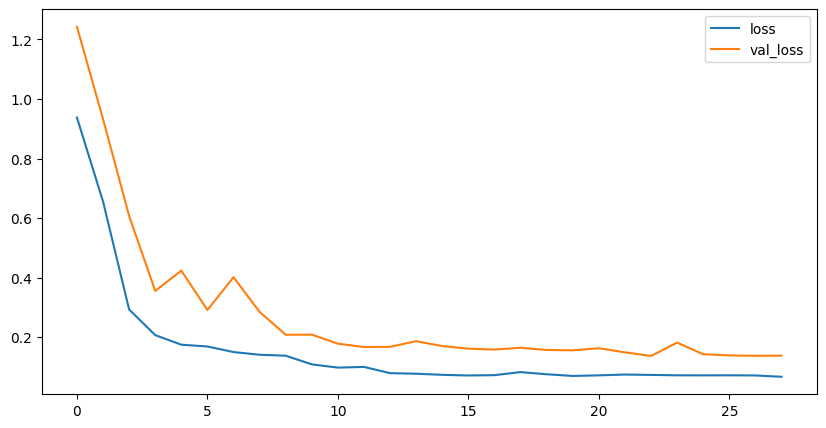

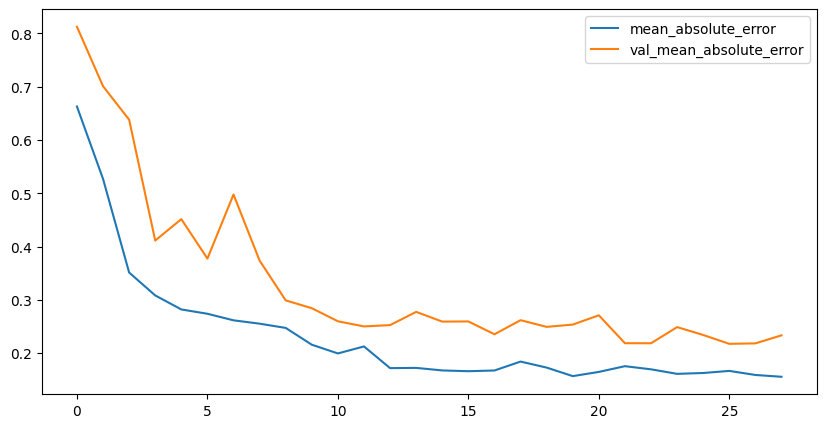

In [ ]:
UNVRM22_history = UNVRMultivariate22.fit(UNVRm_X_train, UNVRm_y_train, validation_data=(UNVRm_X_val, UNVRm_y_val), epochs=100, callbacks = [early_stopping])

UNVRM22_history_df = pd.DataFrame(UNVRM22_history.history)
UNVRM22_history_df.loc[:, ['loss', 'val_loss']].plot()
UNVRM22_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
UNVRM22_test_predictions = UNVRMultivariate22.predict(UNVRm_X_test).flatten()
UNVRM22_test_mae = mean_absolute_error(UNVRm_y_test, UNVRM22_test_predictions)
UNVRM22_test_rmse = np.sqrt(mean_squared_error(UNVRm_y_test, UNVRM22_test_predictions))
UNVRM22_test_mape = mean_absolute_percentage_error(UNVRm_y_test, UNVRM22_test_predictions)
UNVRM22_test_mae, UNVRM22_test_rmse, UNVRM22_test_mape

7/7 [==============================] - 1s 3ms/step


(0.15804917598003085, 0.2585151176594138, 0.13111053311566018)

### 3 LSTM 3 Dense

In [ ]:
UNVRMultivariate33 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,6)),
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(64,activation = 'relu'),
    layers.Dense(32, activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

UNVRMultivariate33.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 16s 65ms/step - loss: 1.0724 - mean_absolute_error: 0.7082 - val_loss: 1.3755 - val_mean_absolute_error: 0.8565
Epoch 2/100
50/50 [==============================] - 2s 34ms/step - loss: 0.7586 - mean_absolute_error: 0.5723 - val_loss: 1.3516 - val_mean_absolute_error: 0.8485
Epoch 3/100
50/50 [==============================] - 1s 28ms/step - loss: 0.7429 - mean_absolute_error: 0.5647 - val_loss: 1.2303 - val_mean_absolute_error: 0.8104
Epoch 4/100
50/50 [==============================] - 1s 25ms/step - loss: 0.7044 - mean_absolute_error: 0.5500 - val_loss: 1.2886 - val_mean_absolute_error: 0.8290
Epoch 5/100
50/50 [==============================] - 1s 29ms/step - loss: 0.4528 - mean_absolute_error: 0.4097 - val_loss: 0.3701 - val_mean_absolute_error: 0.4464
Epoch 6/100
50/50 [==============================] - 1s 28ms/step - loss: 0.2411 - mean_absolute_error: 0.3220 - val_loss: 0.4183 - val_mean_absolute_error: 0.4803
Epoch 7/100
50/

<Axes: >

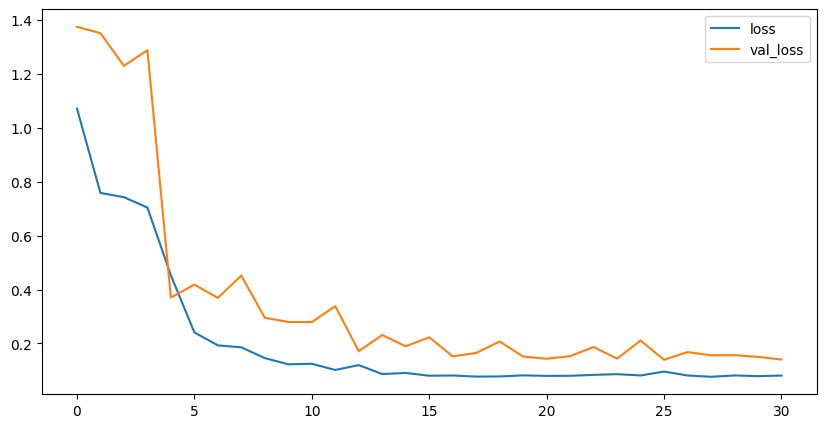

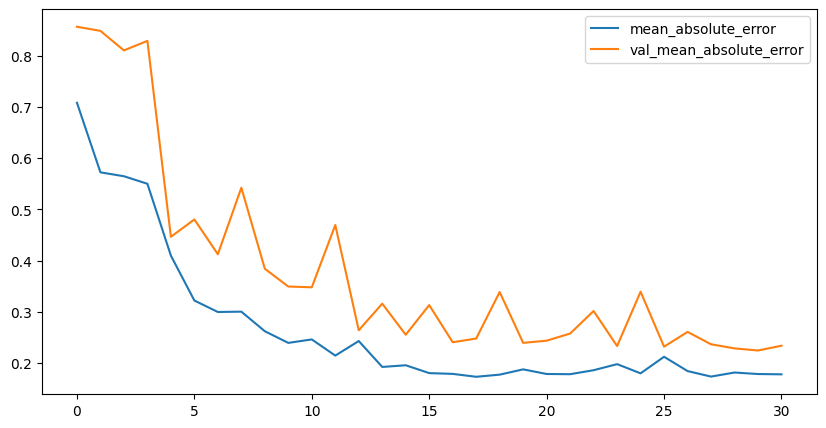

In [ ]:
UNVRM33_history = UNVRMultivariate33.fit(UNVRm_X_train, UNVRm_y_train, validation_data=(UNVRm_X_val, UNVRm_y_val), epochs=100, callbacks = [early_stopping])

UNVRM33_history_df = pd.DataFrame(UNVRM33_history.history)
UNVRM33_history_df.loc[:, ['loss', 'val_loss']].plot()
UNVRM33_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
UNVRM33_test_predictions = UNVRMultivariate33.predict(UNVRm_X_test).flatten()
UNVRM33_test_mae = mean_absolute_error(UNVRm_y_test, UNVRM33_test_predictions)
UNVRM33_test_rmse = np.sqrt(mean_squared_error(UNVRm_y_test, UNVRM33_test_predictions))
UNVRM33_test_mape = mean_absolute_percentage_error(UNVRm_y_test, UNVRM33_test_predictions)
UNVRM33_test_mae, UNVRM33_test_rmse, UNVRM33_test_mape

7/7 [==============================] - 1s 4ms/step


(0.1771847001839848, 0.26971155942997305, 0.15495072290569775)

### Evaluate

<ipython-input-302-725b214c1aab>:2: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



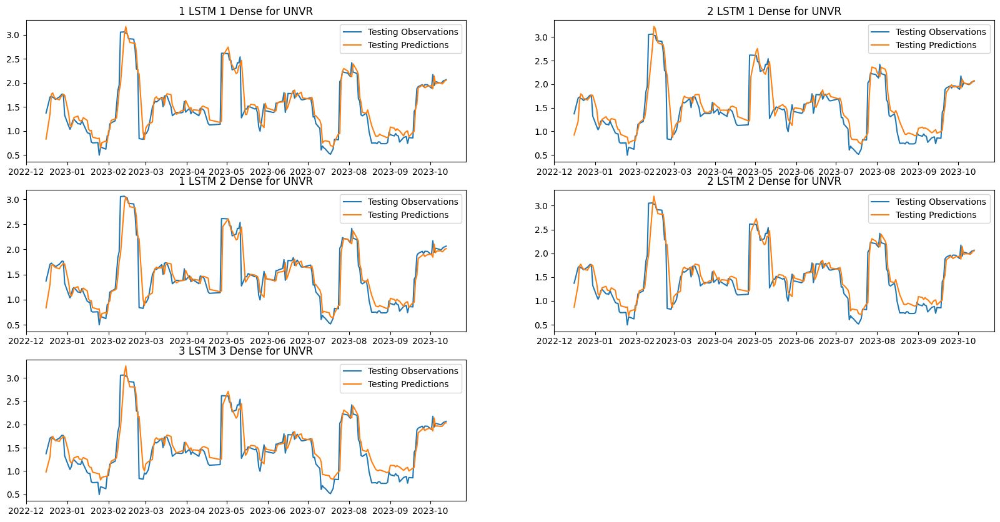

In [ ]:
fig, ax = plt.subplots(figsize = (20,10))
plt.subplot(3,2,1)
plt.plot(UNVRm_dates_test, UNVRm_y_test)
plt.plot(UNVRm_dates_test, UNVRM11_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('1 LSTM 1 Dense for UNVR')

plt.subplot(3,2,2)
plt.plot(UNVRm_dates_test, UNVRm_y_test)
plt.plot(UNVRm_dates_test, UNVRM21_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('2 LSTM 1 Dense for UNVR')

plt.subplot(3,2,3)
plt.plot(UNVRm_dates_test, UNVRm_y_test)
plt.plot(UNVRm_dates_test, UNVRM12_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('1 LSTM 2 Dense for UNVR')

plt.subplot(3,2,4)
plt.plot(UNVRm_dates_test, UNVRm_y_test)
plt.plot(UNVRm_dates_test, UNVRM22_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('2 LSTM 2 Dense for UNVR')

plt.subplot(3,2,5)
plt.plot(UNVRm_dates_test, UNVRm_y_test)
plt.plot(UNVRm_dates_test, UNVRM33_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('3 LSTM 3 Dense for UNVR');

In [ ]:
UNVRM_Eval = {'MAE': [UNVRM11_test_mae, UNVRM21_test_mae, UNVRM12_test_mae, UNVRM22_test_mae, UNVRM33_test_mae],
              'RMSE': [UNVRM11_test_rmse, UNVRM21_test_rmse, UNVRM12_test_rmse, UNVRM22_test_rmse, UNVRM33_test_rmse],
              'MAPE': [UNVRM11_test_mape, UNVRM21_test_mape, UNVRM12_test_mape, UNVRM22_test_mape, UNVRM33_test_mape]
             }

UNVRM_Table = pd.DataFrame(UNVRM_Eval, index =['1 LSTM 1 Dense', '2 LSTM 1 Dense', '1 LSTM 2 Dense', '2 LSTM 2 Dense', '3 LSTM 3 Dense'])
UNVRM_Table

,MAE,RMSE,MAPE
1 LSTM 1 Dense,0.150604,0.255069,0.123365
2 LSTM 1 Dense,0.175924,0.272170,0.145446
1 LSTM 2 Dense,0.144532,0.256080,0.113211
2 LSTM 2 Dense,0.158049,0.258515,0.131111
3 LSTM 3 Dense,0.177185,0.269712,0.154951


<Axes: >

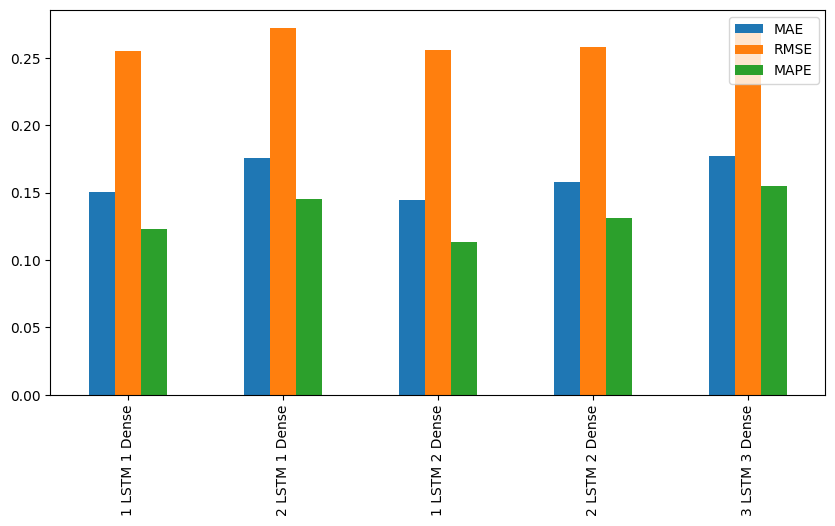

In [ ]:
UNVRM_Table.plot(kind = 'bar')

Both the MAE and MSE results show that 1 LSTM layers and 2 Dense layers is the best Multivariate model for UNVR

In [ ]:
UNVRMultivariate12.save("UNVRMultivariate12.h5")
UNVRMultivariate12.save("UNVRMultivariate_12")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



In [ ]:
#TLKMMultivariate11 = keras.models.load_model("TLKMMultivariate11.h5")

## Finding Best Multivariate LSTM Model for BYAN
***

We will fit several different multivariate LSTM model to find the best model for predicting INDF stock prive volatility. The model that will be tested are as follows:
- 1 LSTM layer, 1 Dense Layer
- 2 LSTM layer, 1 Dense Layer
- 1 LSTM layer, 2 Dense Layer
- 2 LSTM layer, 2 Dense Layer
- 3 LSTM layer, 3 Dense Layer

### 1 LSTM 1 Dense

In [ ]:
BYANMultivariate11 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', input_shape = (5,6)),
    layers.Dense(1, activation = 'linear')
])

BYANMultivariate11.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 10s 107ms/step - loss: 5.8577 - mean_absolute_error: 1.6048 - val_loss: 2.8345 - val_mean_absolute_error: 1.2327
Epoch 2/100
50/50 [==============================] - 0s 9ms/step - loss: 3.5795 - mean_absolute_error: 1.3030 - val_loss: 2.2117 - val_mean_absolute_error: 1.0575
Epoch 3/100
50/50 [==============================] - 0s 9ms/step - loss: 2.6980 - mean_absolute_error: 1.1140 - val_loss: 1.6176 - val_mean_absolute_error: 0.8657
Epoch 4/100
50/50 [==============================] - 0s 8ms/step - loss: 1.8864 - mean_absolute_error: 0.8833 - val_loss: 1.0115 - val_mean_absolute_error: 0.6409
Epoch 5/100
50/50 [==============================] - 0s 7ms/step - loss: 1.2606 - mean_absolute_error: 0.6547 - val_loss: 0.6620 - val_mean_absolute_error: 0.4685
Epoch 6/100
50/50 [==============================] - 0s 7ms/step - loss: 0.9963 - mean_absolute_error: 0.5321 - val_loss: 0.5483 - val_mean_absolute_error: 0.4253
Epoch 7/100
50/50 [

<Axes: >

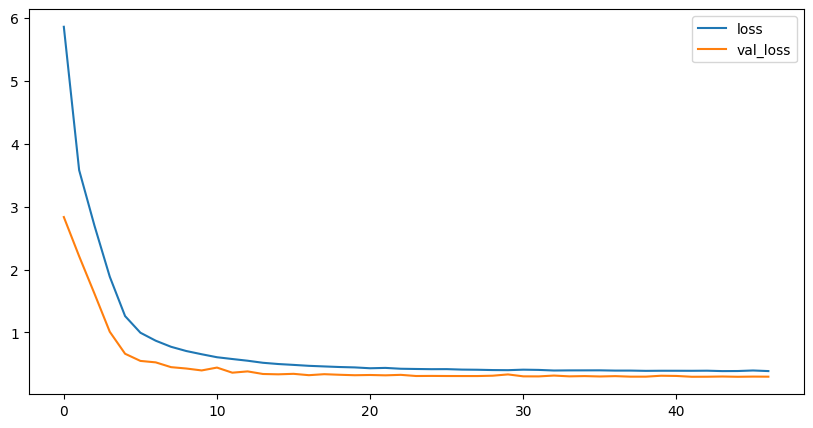

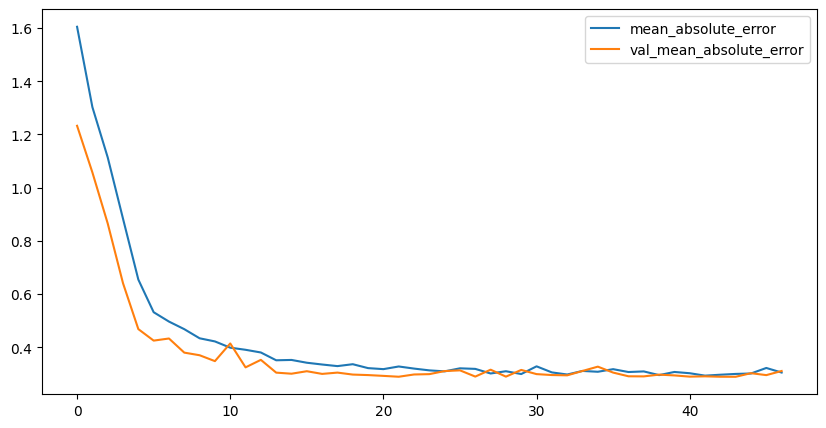

In [ ]:
BYANM11_history = BYANMultivariate11.fit(BYANm_X_train, BYANm_y_train, validation_data=(BYANm_X_val, BYANm_y_val), epochs=100, callbacks = [early_stopping])

BYANM11_history_df = pd.DataFrame(BYANM11_history.history)
BYANM11_history_df.loc[:, ['loss', 'val_loss']].plot()
BYANM11_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BYANM11_test_predictions = BYANMultivariate11.predict(BYANm_X_test).flatten()
BYANM11_test_mae = mean_absolute_error(BYANm_y_test, BYANM11_test_predictions)
BYANM11_test_rmse = np.sqrt(mean_squared_error(BYANm_y_test, BYANM11_test_predictions))
BYANM11_test_mape = mean_absolute_percentage_error(BYANm_y_test, BYANM11_test_predictions)
BYANM11_test_mae, BYANM11_test_rmse, BYANM11_test_mape

7/7 [==============================] - 0s 3ms/step


(0.377411039050075, 0.5496326648015137, 0.20018127779906356)

### 2 LSTM 1 Dense

In [ ]:
BYANMultivariate21 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,6)),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(1, activation = 'linear')
])

BYANMultivariate21.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 13s 76ms/step - loss: 4.4456 - mean_absolute_error: 1.4482 - val_loss: 1.9856 - val_mean_absolute_error: 1.0128
Epoch 2/100
50/50 [==============================] - 1s 20ms/step - loss: 1.6266 - mean_absolute_error: 0.8085 - val_loss: 0.7753 - val_mean_absolute_error: 0.6921
Epoch 3/100
50/50 [==============================] - 1s 14ms/step - loss: 1.1325 - mean_absolute_error: 0.6405 - val_loss: 0.5191 - val_mean_absolute_error: 0.4848
Epoch 4/100
50/50 [==============================] - 1s 18ms/step - loss: 0.8707 - mean_absolute_error: 0.5797 - val_loss: 0.7620 - val_mean_absolute_error: 0.6273
Epoch 5/100
50/50 [==============================] - 1s 17ms/step - loss: 0.6640 - mean_absolute_error: 0.4404 - val_loss: 0.3959 - val_mean_absolute_error: 0.3811
Epoch 6/100
50/50 [==============================] - 1s 15ms/step - loss: 0.5875 - mean_absolute_error: 0.4411 - val_loss: 0.4083 - val_mean_absolute_error: 0.3587
Epoch 7/100
50/

<Axes: >

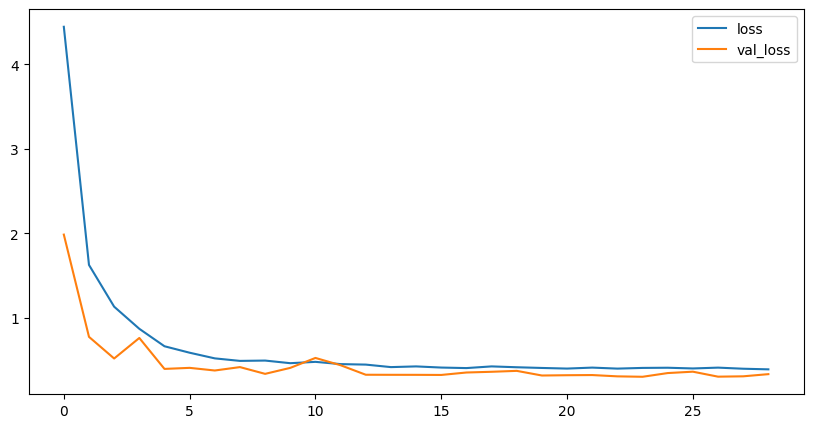

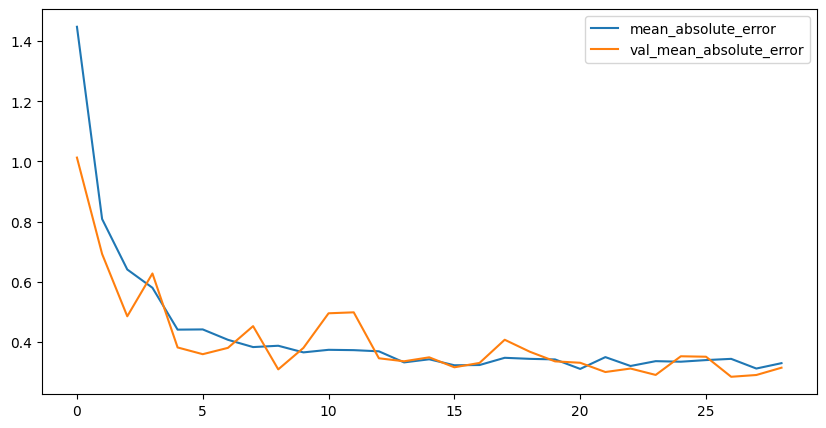

In [ ]:
BYANM21_history = BYANMultivariate21.fit(BYANm_X_train, BYANm_y_train, validation_data=(BYANm_X_val, BYANm_y_val), epochs=100, callbacks = [early_stopping])

BYANM21_history_df = pd.DataFrame(BYANM21_history.history)
BYANM21_history_df.loc[:, ['loss', 'val_loss']].plot()
BYANM21_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BYANM21_test_predictions = BYANMultivariate21.predict(BYANm_X_test).flatten()
BYANM21_test_mae = mean_absolute_error(BYANm_y_test, BYANM21_test_predictions)
BYANM21_test_rmse = np.sqrt(mean_squared_error(BYANm_y_test, BYANM21_test_predictions))
BYANM21_test_mape = mean_absolute_percentage_error(BYANm_y_test, BYANM21_test_predictions)
BYANM21_test_mae, BYANM21_test_rmse, BYANM21_test_mape

7/7 [==============================] - 1s 3ms/step


(0.3601167892192495, 0.5400821360717514, 0.18307232226817022)

### 1 LSTM 2 Dense

In [ ]:
BYANMultivariate12 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', input_shape = (5,6)),
    layers.Dense(32,activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

BYANMultivariate12.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 4s 23ms/step - loss: 5.7099 - mean_absolute_error: 1.5834 - val_loss: 3.1660 - val_mean_absolute_error: 1.2918
Epoch 2/100
50/50 [==============================] - 0s 8ms/step - loss: 3.8691 - mean_absolute_error: 1.3759 - val_loss: 2.6126 - val_mean_absolute_error: 1.0850
Epoch 3/100
50/50 [==============================] - 0s 7ms/step - loss: 2.4826 - mean_absolute_error: 1.0618 - val_loss: 1.0524 - val_mean_absolute_error: 0.6634
Epoch 4/100
50/50 [==============================] - 1s 13ms/step - loss: 1.0761 - mean_absolute_error: 0.6103 - val_loss: 0.4649 - val_mean_absolute_error: 0.4352
Epoch 5/100
50/50 [==============================] - 1s 14ms/step - loss: 0.7323 - mean_absolute_error: 0.4789 - val_loss: 0.5060 - val_mean_absolute_error: 0.4819
Epoch 6/100
50/50 [==============================] - 1s 10ms/step - loss: 0.6220 - mean_absolute_error: 0.4309 - val_loss: 0.3710 - val_mean_absolute_error: 0.3409
Epoch 7/100
50/50 

<Axes: >

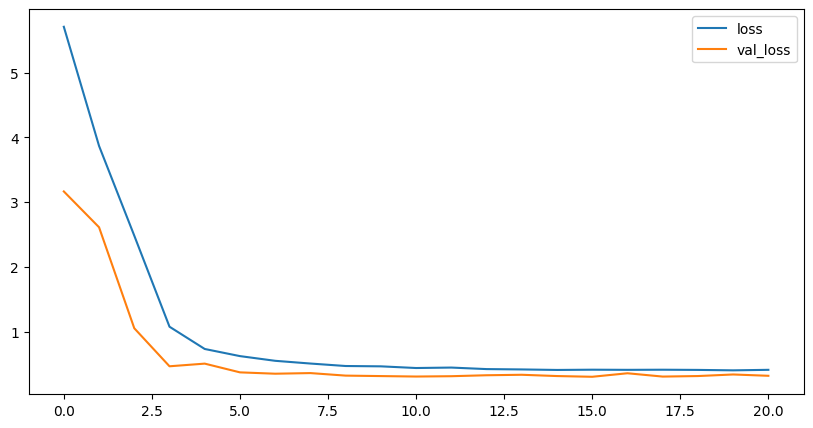

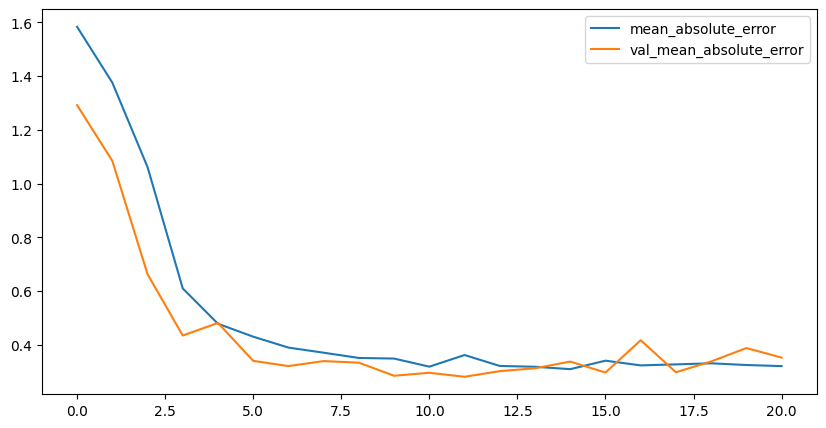

In [ ]:
BYANM12_history = BYANMultivariate12.fit(BYANm_X_train, BYANm_y_train, validation_data=(BYANm_X_val, BYANm_y_val), epochs=100, callbacks = [early_stopping])

BYANM12_history_df = pd.DataFrame(BYANM12_history.history)
BYANM12_history_df.loc[:, ['loss', 'val_loss']].plot()
BYANM12_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BYANM12_test_predictions = BYANMultivariate12.predict(BYANm_X_test).flatten()
BYANM12_test_mae = mean_absolute_error(BYANm_y_test, BYANM12_test_predictions)
BYANM12_test_rmse = np.sqrt(mean_squared_error(BYANm_y_test, BYANM12_test_predictions))
BYANM12_test_mape = mean_absolute_percentage_error(BYANm_y_test, BYANM12_test_predictions)
BYANM12_test_mae, BYANM12_test_rmse, BYANM12_test_mape

7/7 [==============================] - 0s 4ms/step


(0.4434753571682449, 0.603917884331543, 0.23803954314799106)

### 2 LSTM 2 Dense

In [ ]:
BYANMultivariate22 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,6)),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(32,activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

BYANMultivariate22.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 8s 38ms/step - loss: 4.8448 - mean_absolute_error: 1.4985 - val_loss: 2.4559 - val_mean_absolute_error: 1.1626
Epoch 2/100
50/50 [==============================] - 1s 14ms/step - loss: 1.8995 - mean_absolute_error: 0.8730 - val_loss: 0.7075 - val_mean_absolute_error: 0.5835
Epoch 3/100
50/50 [==============================] - 1s 13ms/step - loss: 1.1096 - mean_absolute_error: 0.6376 - val_loss: 0.5145 - val_mean_absolute_error: 0.4374
Epoch 4/100
50/50 [==============================] - 1s 14ms/step - loss: 0.7394 - mean_absolute_error: 0.5141 - val_loss: 0.4802 - val_mean_absolute_error: 0.4223
Epoch 5/100
50/50 [==============================] - 1s 14ms/step - loss: 0.6131 - mean_absolute_error: 0.4738 - val_loss: 0.3806 - val_mean_absolute_error: 0.4173
Epoch 6/100
50/50 [==============================] - 0s 10ms/step - loss: 0.5131 - mean_absolute_error: 0.4033 - val_loss: 0.5323 - val_mean_absolute_error: 0.4558
Epoch 7/100
50/5

<Axes: >

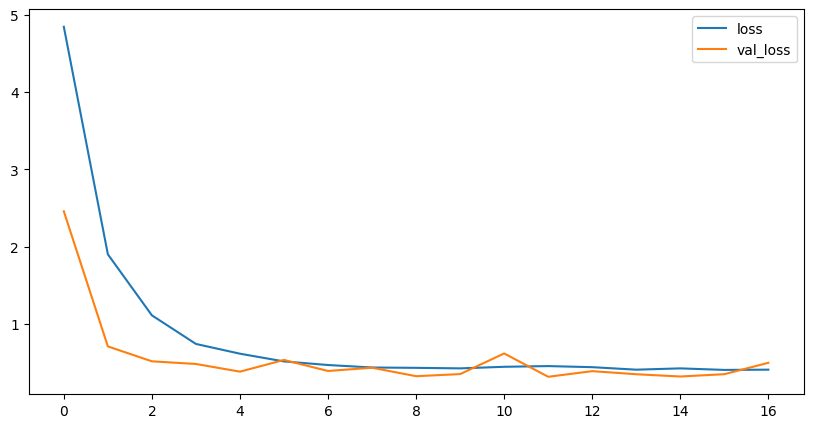

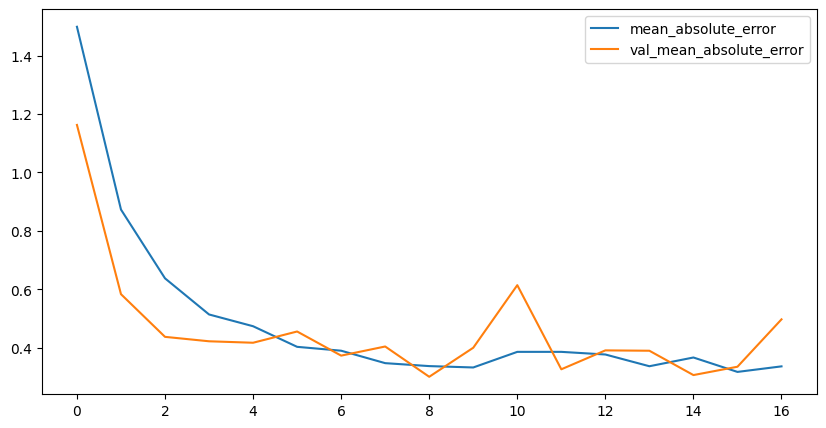

In [ ]:
BYANM22_history = BYANMultivariate22.fit(BYANm_X_train, BYANm_y_train, validation_data=(BYANm_X_val, BYANm_y_val), epochs=100, callbacks = [early_stopping])

BYANM22_history_df = pd.DataFrame(BYANM22_history.history)
BYANM22_history_df.loc[:, ['loss', 'val_loss']].plot()
BYANM22_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BYANM22_test_predictions = BYANMultivariate22.predict(BYANm_X_test).flatten()
BYANM22_test_mae = mean_absolute_error(BYANm_y_test, BYANM22_test_predictions)
BYANM22_test_rmse = np.sqrt(mean_squared_error(BYANm_y_test, BYANM22_test_predictions))
BYANM22_test_mape = mean_absolute_percentage_error(BYANm_y_test, BYANM22_test_predictions)
BYANM22_test_mae, BYANM22_test_rmse, BYANM22_test_mape

7/7 [==============================] - 0s 4ms/step


(0.38234994317815446, 0.5587101423091755, 0.19879785878487685)

### 3 LSTM 3 Dense

In [ ]:
BYANMultivariate33 = Sequential([
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True, input_shape = (5,6)),
    layers.LSTM(64, activation = 'sigmoid', return_sequences = True),
    layers.LSTM(64,activation = 'tanh'),
    layers.Dense(64,activation = 'relu'),
    layers.Dense(32, activation = 'relu'),
    layers.Dense(1, activation = 'linear')
])

BYANMultivariate33.compile(
    optimizer='adam',
    loss = 'mse',
    metrics = ['mean_absolute_error'],
)

Epoch 1/100
50/50 [==============================] - 6s 30ms/step - loss: 5.2426 - mean_absolute_error: 1.5473 - val_loss: 3.5083 - val_mean_absolute_error: 1.3352
Epoch 2/100
50/50 [==============================] - 1s 17ms/step - loss: 4.5550 - mean_absolute_error: 1.4934 - val_loss: 2.7717 - val_mean_absolute_error: 1.2545
Epoch 3/100
50/50 [==============================] - 1s 17ms/step - loss: 2.2592 - mean_absolute_error: 0.9888 - val_loss: 0.6443 - val_mean_absolute_error: 0.5143
Epoch 4/100
50/50 [==============================] - 1s 18ms/step - loss: 0.9703 - mean_absolute_error: 0.6339 - val_loss: 0.4576 - val_mean_absolute_error: 0.4975
Epoch 5/100
50/50 [==============================] - 1s 17ms/step - loss: 0.6519 - mean_absolute_error: 0.5055 - val_loss: 0.4111 - val_mean_absolute_error: 0.3703
Epoch 6/100
50/50 [==============================] - 1s 18ms/step - loss: 0.6317 - mean_absolute_error: 0.5127 - val_loss: 0.4319 - val_mean_absolute_error: 0.4030
Epoch 7/100
50/5

<Axes: >

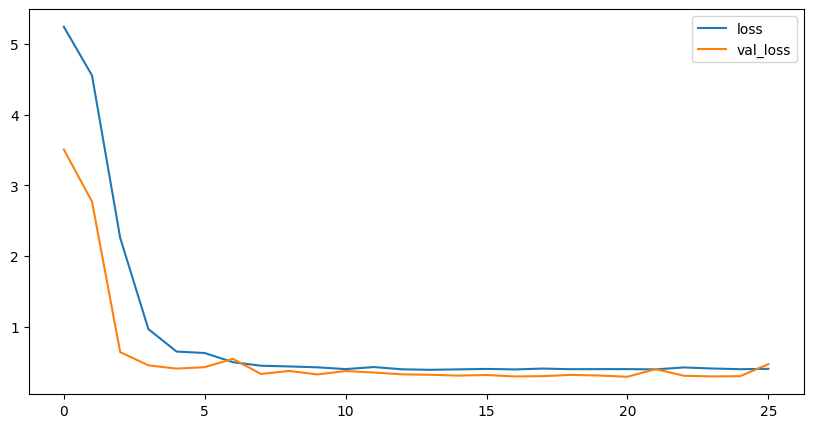

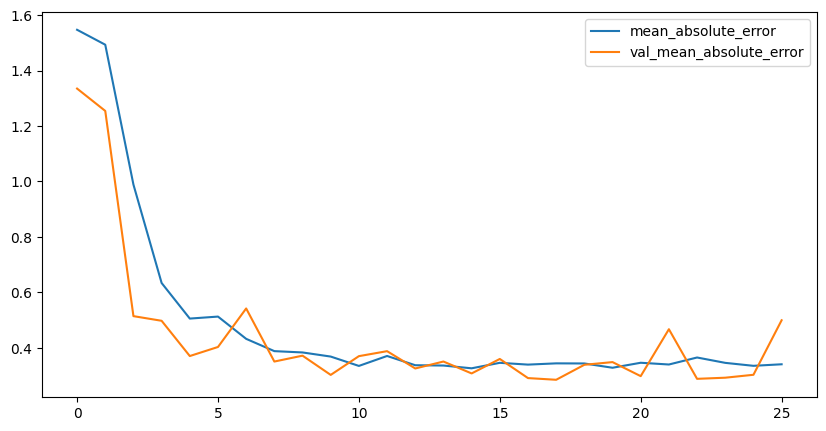

In [ ]:
BYANM33_history = BYANMultivariate33.fit(BYANm_X_train, BYANm_y_train, validation_data=(BYANm_X_val, BYANm_y_val), epochs=100, callbacks = [early_stopping])

BYANM33_history_df = pd.DataFrame(BYANM33_history.history)
BYANM33_history_df.loc[:, ['loss', 'val_loss']].plot()
BYANM33_history_df.loc[:, ['mean_absolute_error','val_mean_absolute_error']].plot()

In [ ]:
BYANM33_test_predictions = BYANMultivariate33.predict(BYANm_X_test).flatten()
BYANM33_test_mae = mean_absolute_error(BYANm_y_test, BYANM33_test_predictions)
BYANM33_test_rmse = np.sqrt(mean_squared_error(BYANm_y_test, BYANM33_test_predictions))
BYANM33_test_mape = mean_absolute_percentage_error(BYANm_y_test, BYANM33_test_predictions)
BYANM33_test_mae, BYANM33_test_rmse, BYANM33_test_mape

7/7 [==============================] - 1s 5ms/step


(0.46418400475669974, 0.6119683365572839, 0.25479918113162886)

### Evaluate

<ipython-input-321-04126c091312>:2: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



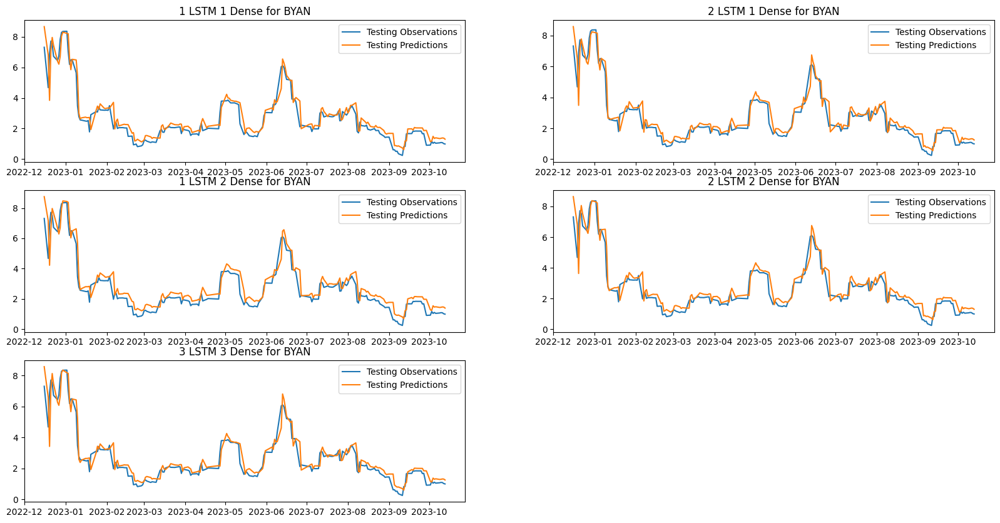

In [ ]:
fig, ax = plt.subplots(figsize = (20,10))
plt.subplot(3,2,1)
plt.plot(BYANm_dates_test, BYANm_y_test)
plt.plot(BYANm_dates_test, BYANM11_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('1 LSTM 1 Dense for BYAN')

plt.subplot(3,2,2)
plt.plot(BYANm_dates_test, BYANm_y_test)
plt.plot(BYANm_dates_test, BYANM21_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('2 LSTM 1 Dense for BYAN')

plt.subplot(3,2,3)
plt.plot(BYANm_dates_test, BYANm_y_test)
plt.plot(BYANm_dates_test, BYANM12_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('1 LSTM 2 Dense for BYAN')

plt.subplot(3,2,4)
plt.plot(BYANm_dates_test, BYANm_y_test)
plt.plot(BYANm_dates_test, BYANM22_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('2 LSTM 2 Dense for BYAN')

plt.subplot(3,2,5)
plt.plot(BYANm_dates_test, BYANm_y_test)
plt.plot(BYANm_dates_test, BYANM33_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('3 LSTM 3 Dense for BYAN');

In [ ]:
BYANM_Eval = {'MAE': [BYANM11_test_mae, BYANM21_test_mae, BYANM12_test_mae, BYANM22_test_mae, BYANM33_test_mae],
              'RMSE': [BYANM11_test_rmse, BYANM21_test_rmse, BYANM12_test_rmse, BYANM22_test_rmse, BYANM33_test_rmse],
              'MAPE': [BYANM11_test_mape, BYANM21_test_mape, BYANM12_test_mape, BYANM22_test_mape, BYANM33_test_mape]
             }

BYANM_Table = pd.DataFrame(BYANM_Eval, index =['1 LSTM 1 Dense', '2 LSTM 1 Dense', '1 LSTM 2 Dense', '2 LSTM 2 Dense', '3 LSTM 3 Dense'])
BYANM_Table

,MAE,RMSE,MAPE
1 LSTM 1 Dense,0.377411,0.549633,0.200181
2 LSTM 1 Dense,0.360117,0.540082,0.183072
1 LSTM 2 Dense,0.443475,0.603918,0.238040
2 LSTM 2 Dense,0.382350,0.558710,0.198798
3 LSTM 3 Dense,0.464184,0.611968,0.254799


<Axes: >

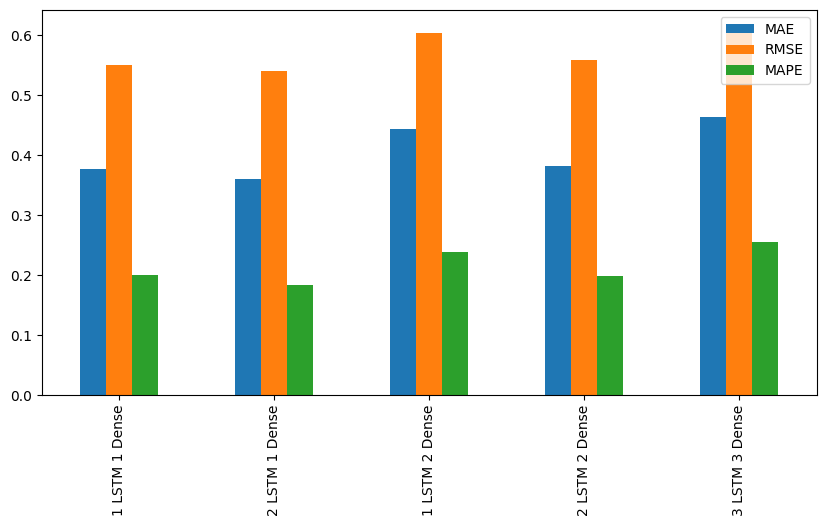

In [ ]:
BYANM_Table.plot(kind = 'bar')

Both the MAE and MSE results show that 2 LSTM layer and 1 LSTM layer is the best Multivariate model for BYAN

In [ ]:
BYANMultivariate21.save("BYANMultivariate21.h5")
BYANMultivariate21.save("BYANMultivariate_21")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



In [ ]:
#INDFMultivariate12 = keras.models.load_model("INDFMultivariate12.h5")

## Value at Risk using Multivariate LSTM
***

We will use the same student's t distribution VaR formula from the previous sections.

In [ ]:
alpha = [0.01, 0.05, 0.1]
BCA_VaR_multi = pd.DataFrame(index = BCA_multi_copy[Mq_90+5:].index, columns = ['1%', '5%', '10%'] )
UNVR_VaR_multi = pd.DataFrame(index = UNVR_multi_copy[Mq_90+5:].index, columns = ['1%', '5%', '10%'] )
BYAN_VaR_multi = pd.DataFrame(index = BYAN_multi_copy[Mq_90+5:].index, columns = ['1%', '5%', '10%'] )
for i in range(len(BCAm_y_test)):
    BCA_nu, _, _ = t.fit(BCA_multi_copy[:Mq_90+i+5]['log return'])
    UNVR_nu, _, _ = t.fit(UNVR_multi_copy[:Mq_90+i+5]['log return'])
    BYAN_nu, _ = norm.fit(BYAN_multi_copy[:Mq_90+i+5]['log return'])

    #test = t.ppf(alpha, nu) * BCA_predictions[i] + BCAgarch[:q_90+i]['log return'].mean()
    #test = norm.ppf(0.05) * BCA_predictions[i] + BCAgarch[:q_90+i]['log return'].mean()
    for j in range(len(alpha)):
        BCA_VaR_multi.iloc[i,j] = ((BCA_nu-2)/BCA_nu)**0.5 * t.ppf(alpha[j], BCA_nu) * BCAM11_test_predictions[i] + BCA_multi_copy[:Mq_90+i+5]['log return'].mean()
        UNVR_VaR_multi.iloc[i,j] = ((UNVR_nu-2)/UNVR_nu)**0.5 * t.ppf(alpha[j], UNVR_nu) * UNVRM12_test_predictions[i] + UNVR_multi_copy[:Mq_90+i+5]['log return'].mean()
        # BYAN_VaR_multi.iloc[i,j] = ((BYAN_nu-2)/BYAN_nu)**0.5 * t.ppf(alpha[j], BYAN_nu) * BYANM11_test_predictions[i] + BYAN_multi_copy[:Mq_90+i+5]['log return'].mean()
        BYAN_VaR_multi.iloc[i,j] = norm.ppf(alpha[j], BYAN_nu) * BYANM11_test_predictions[i] + BYAN_multi_copy[:Mq_90+i+5]['log return'].mean()

<ipython-input-334-e8e1178206d1>:15: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



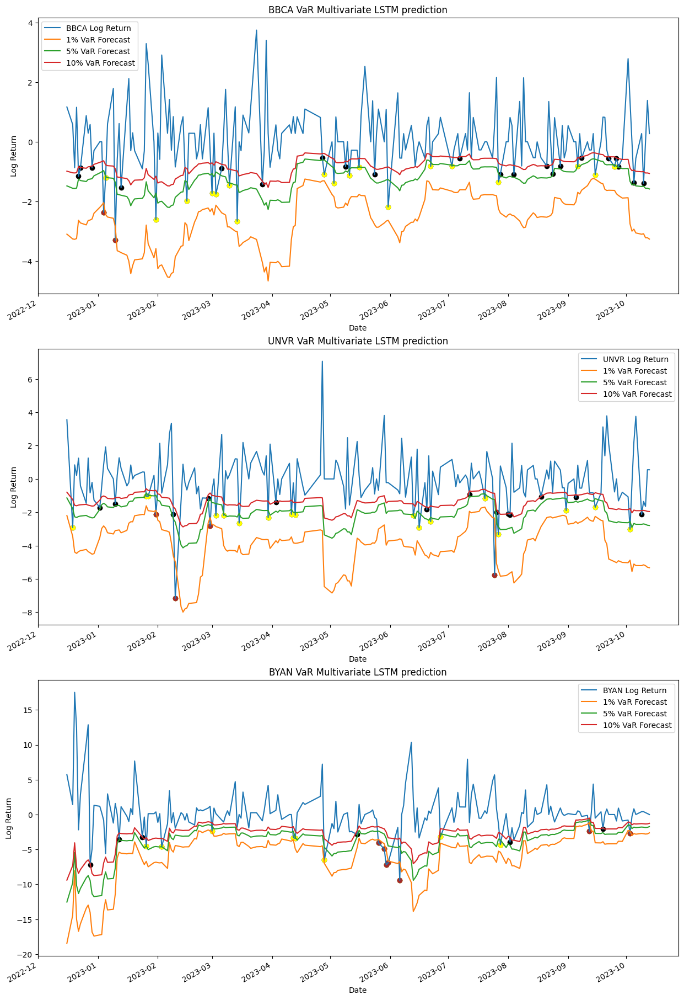

In [ ]:
BCAM_failed1 = BCA_multi_copy[Mq_90+5:][BCA_multi_copy[Mq_90+5:]['log return'] < BCA_VaR_multi['1%']]['log return']
BCAM_failed5 = BCA_multi_copy[Mq_90+5:][BCA_multi_copy[Mq_90+5:]['log return'] < BCA_VaR_multi['5%']]['log return']
BCAM_failed10 = BCA_multi_copy[Mq_90+5:][BCA_multi_copy[Mq_90+5:]['log return'] < BCA_VaR_multi['10%']]['log return']

UNVRM_failed1 = UNVR_multi_copy[Mq_90+5:][UNVR_multi_copy[Mq_90+5:]['log return'] < UNVR_VaR_multi['1%']]['log return']
UNVRM_failed5 = UNVR_multi_copy[Mq_90+5:][UNVR_multi_copy[Mq_90+5:]['log return'] < UNVR_VaR_multi['5%']]['log return']
UNVRM_failed10 = UNVR_multi_copy[Mq_90+5:][UNVR_multi_copy[Mq_90+5:]['log return'] < UNVR_VaR_multi['10%']]['log return']

BYANM_failed1 = BYAN_multi_copy[Mq_90+5:][BYAN_multi_copy[Mq_90+5:]['log return'] < BYAN_VaR_multi['1%']]['log return']
BYANM_failed5 = BYAN_multi_copy[Mq_90+5:][BYAN_multi_copy[Mq_90+5:]['log return'] < BYAN_VaR_multi['5%']]['log return']
BYANM_failed10 = BYAN_multi_copy[Mq_90+5:][BYAN_multi_copy[Mq_90+5:]['log return'] < BYAN_VaR_multi['10%']]['log return']

plt.subplots(figsize = (15,25))

plt.subplot(3,1,1)
BCA_multi_copy[Mq_90+5:]['log return'].plot(ylabel = 'Log Return')
BCA_VaR_multi['1%'].plot()
BCA_VaR_multi['5%'].plot()
BCA_VaR_multi['10%'].plot()
plt.legend(['BBCA Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(BCAM_failed10.index, BCAM_failed10.values, color='black')
plt.scatter(BCAM_failed5.index, BCAM_failed5.values, color='yellow')
plt.scatter(BCAM_failed1.index, BCAM_failed1.values, color='brown')
plt.title('BBCA VaR Multivariate LSTM prediction')

plt.subplot(3,1,2)
UNVR_multi_copy[Mq_90+5:]['log return'].plot(ylabel = 'Log Return')
UNVR_VaR_multi['1%'].plot()
UNVR_VaR_multi['5%'].plot()
UNVR_VaR_multi['10%'].plot()
plt.legend(['UNVR Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(UNVRM_failed10.index, UNVRM_failed10.values, color='black')
plt.scatter(UNVRM_failed5.index, UNVRM_failed5.values, color='yellow')
plt.scatter(UNVRM_failed1.index, UNVRM_failed1.values, color='brown')
plt.title('UNVR VaR Multivariate LSTM prediction')

plt.subplot(3,1,3)
BYAN_multi_copy[Mq_90+5:]['log return'].plot(ylabel = 'Log Return')
BYAN_VaR_multi['1%'].plot()
BYAN_VaR_multi['5%'].plot()
BYAN_VaR_multi['10%'].plot()
plt.legend(['BYAN Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(BYANM_failed10.index, BYANM_failed10.values, color='black')
plt.scatter(BYANM_failed5.index, BYANM_failed5.values, color='yellow')
plt.scatter(BYANM_failed1.index, BYANM_failed1.values, color='brown')
plt.title('BYAN VaR Multivariate LSTM prediction');

In [ ]:
overexceedmulti = {'BCA': [BCAM_failed1.value_counts().sum(), BCAM_failed5.value_counts().sum(), BCAM_failed10.value_counts().sum()],
              'UNVR': [UNVRM_failed1.value_counts().sum(), UNVRM_failed5.value_counts().sum(), UNVRM_failed10.value_counts().sum()],
              'BYAN': [BYANM_failed1.value_counts().sum(), BYANM_failed5.value_counts().sum(), BYANM_failed10.value_counts().sum()]
}

overexceed_multi = pd.DataFrame(overexceedmulti, index = ['1%', '5%', '10%'])
overexceed_multi

,BCA,UNVR,BYAN
1%,2,4,7
5%,20,21,15
10%,41,34,21


In [ ]:
(1 - (overexceed_uni/len(BCA_y_test)))*100

,BCA,UNVR,BYAN
1%,98.989899,97.979798,94.949495
5%,89.393939,89.898990,91.919192
10%,78.282828,82.828283,88.888889


# V. Model Evaluation
***
***

We analyze the model’s performance by plotting the model's predictions against the actual data to visually inspect
how well it's capturing patterns. We will also evaluate the model using Mean Squared Error and Mean Absolute Error.

__Mean Absolute Error (MAE)__ measures the average absolute difference between predicted and actual values. It provides a straightforward assessment of the magnitude of errors without considering their direction. The formula for MAE is:
$$ MAE = \frac{1}{n} \sum \limits _{i = 1} ^{n} |Actual_{i} - Predicted_{i}| $$

__Root_Mean Squared Error (RMSE)__ computes the square root of the average of squared differences between predicted and actual values. Squaring the differences penalizes larger errors more significantly. The formula for MSE is:
$$ RMSE = \sqrt{ \frac{1}{n} \sum \limits _{i = 1} ^{n} (Actual_{i} - Predicted_{i})^2} $$

__Mean Absolute Percentage Error (MAPE)__ expresses the average percentage difference between
predicted and actual values relative to the actual values, offering a standardized measure across different scales. The formula for MAPE is:
$$ MAPE = \frac{1}{n} \sum \limits _{i=1} ^{n} \left|\frac{Actual_{i} - Predicted_{i}}{Actual_{i}}\right|$$

## BCA
***

<ipython-input-339-4edaf4a67f3e>:2: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



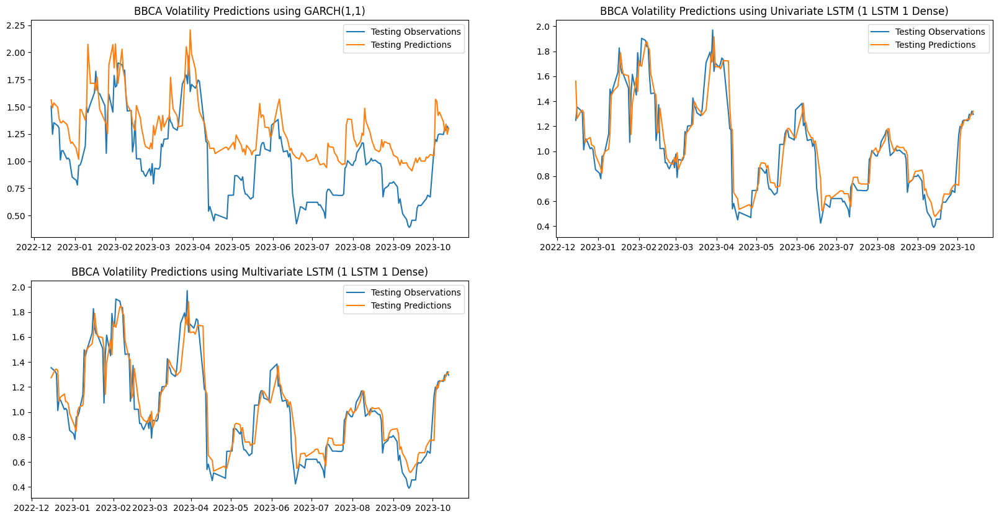

In [ ]:
plt.subplots(figsize = (20,10))
plt.subplot(2,2,1)
plt.plot(BCA_test['10 day volatility'])
plt.plot(BCA_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('BBCA Volatility Predictions using GARCH(1,1)')

plt.subplot(2,2,2)
plt.plot(BCA_dates_test, BCA_y_test)
plt.plot(BCA_dates_test, BCAU11_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('BBCA Volatility Predictions using Univariate LSTM (1 LSTM 1 Dense)')

plt.subplot(2,2,3)
plt.plot(BCAm_dates_test, BCAm_y_test)
plt.plot(BCAm_dates_test, BCAM11_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('BBCA Volatility Predictions using Multivariate LSTM (1 LSTM 1 Dense)');

In [ ]:
BCAMODEL_Eval = {'MAE': [BCAgarch_test_mae, BCAU11_test_mae, BCAM11_test_mae],
                 'RMSE': [BCAgarch_test_rmse, BCAU11_test_rmse, BCAM11_test_rmse],
                 'MAPE': [BCAgarch_test_mape, BCAU11_test_mape, BCAM11_test_mape]
                }

BCAMODEL_Table = pd.DataFrame(BCAMODEL_Eval, index =['GARCH(1,1)', 'Univariate 1 LSTM 1 Dense', 'Multivariate 1 LSTM 1 Dense'])
BCAMODEL_Table

,MAE,RMSE,MAPE
"GARCH(1,1)",0.286452,0.329749,0.373288
Univariate 1 LSTM 1 Dense,0.091124,0.136860,0.102224
Multivariate 1 LSTM 1 Dense,0.095389,0.135338,0.109966


<Axes: >

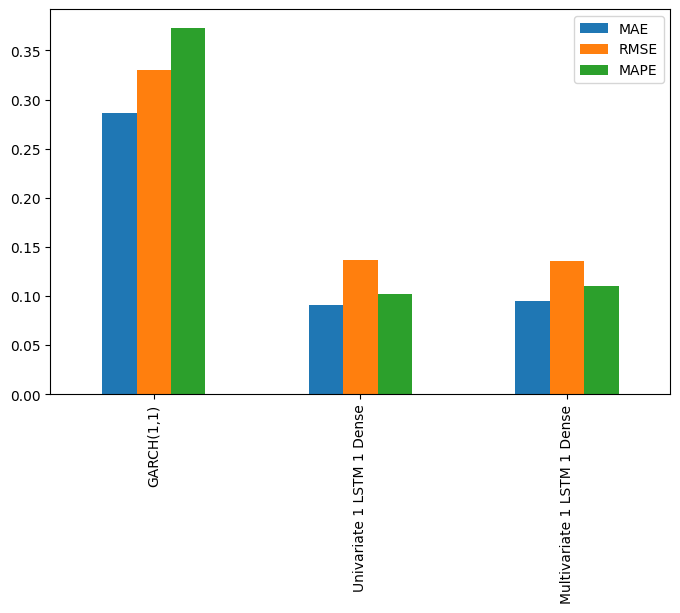

In [ ]:
BCAMODEL_Table.plot(kind = 'bar', figsize = (8,5))

<ipython-input-344-a67c6c3b3f78>:3: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



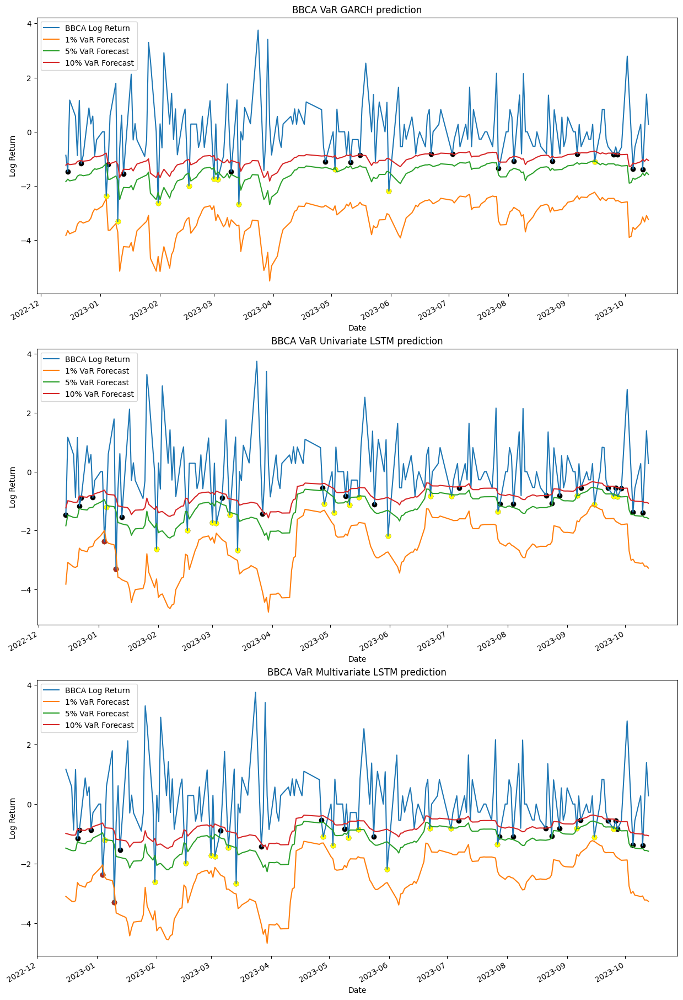

In [ ]:
plt.subplots(figsize = (15,25))

plt.subplot(3,1,1)
BCA_test['log return'].plot(ylabel = 'Log Return')
BCA_VaR_garch['1%'].plot()
BCA_VaR_garch['5%'].plot()
BCA_VaR_garch['10%'].plot()
plt.legend(['BBCA Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(BCA_failed10.index, BCA_failed10.values, color='black')
plt.scatter(BCA_failed5.index, BCA_failed5.values, color='yellow')
plt.scatter(BCA_failed1.index, BCA_failed1.values, color='brown')
plt.title('BBCA VaR GARCH prediction')

plt.subplot(3,1,2)
BCA_uni[Uq_90+5:]['log return'].plot(ylabel = 'Log Return')
BCA_VaR_uni['1%'].plot()
BCA_VaR_uni['5%'].plot()
BCA_VaR_uni['10%'].plot()
plt.legend(['BBCA Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(BCAU_failed10.index, BCAU_failed10.values, color='black')
plt.scatter(BCAU_failed5.index, BCAU_failed5.values, color='yellow')
plt.scatter(BCAU_failed1.index, BCAU_failed1.values, color='brown')
plt.title('BBCA VaR Univariate LSTM prediction')

plt.subplot(3,1,3)
BCA_multi_copy[Mq_90+5:]['log return'].plot(ylabel = 'Log Return')
BCA_VaR_multi['1%'].plot()
BCA_VaR_multi['5%'].plot()
BCA_VaR_multi['10%'].plot()
plt.legend(['BBCA Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(BCAM_failed10.index, BCAM_failed10.values, color='black')
plt.scatter(BCAM_failed5.index, BCAM_failed5.values, color='yellow')
plt.scatter(BCAM_failed1.index, BCAM_failed1.values, color='brown')
plt.title('BBCA VaR Multivariate LSTM prediction');

In [ ]:
overexceedBCA = {'GARCH': [BCA_failed1.value_counts().sum(), BCA_failed5.value_counts().sum(), BCA_failed10.value_counts().sum()],
                 'Univariate LSTM': [BCAU_failed1.value_counts().sum(), BCAU_failed5.value_counts().sum(), BCAU_failed10.value_counts().sum()],
                 'Multivariate LSTM': [BCAM_failed1.value_counts().sum(), BCAM_failed5.value_counts().sum(), BCAM_failed10.value_counts().sum()],
                }
overexceed_BCA = pd.DataFrame(overexceedBCA, index = ['1%', '5%', '10%'])
overexceed_BCA

,GARCH,Univariate LSTM,Multivariate LSTM
1%,0,2,2
5%,10,21,20
10%,28,43,41


## UNVR
***

<ipython-input-346-b2bad5be8a34>:2: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



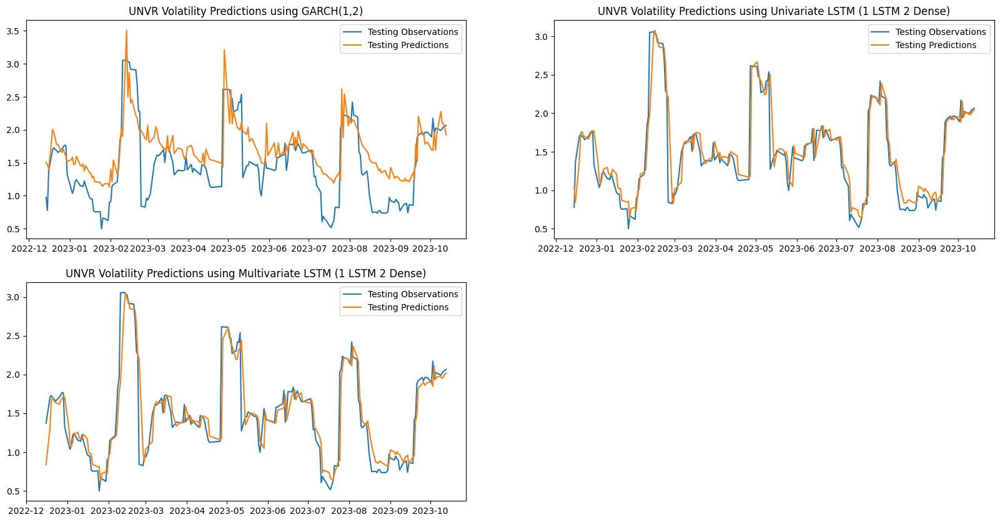

In [ ]:
plt.subplots(figsize = (20,10))
plt.subplot(2,2,1)
plt.plot(UNVR_test['10 day volatility'])
plt.plot(UNVR_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('UNVR Volatility Predictions using GARCH(1,2)')

plt.subplot(2,2,2)
plt.plot(UNVR_dates_test, UNVR_y_test)
plt.plot(UNVR_dates_test, UNVRU12_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('UNVR Volatility Predictions using Univariate LSTM (1 LSTM 2 Dense)')

plt.subplot(2,2,3)
plt.plot(UNVRm_dates_test, UNVRm_y_test)
plt.plot(UNVRm_dates_test, UNVRM12_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('UNVR Volatility Predictions using Multivariate LSTM (1 LSTM 2 Dense)');

In [ ]:
UNVRMODEL_Eval = {'MAE': [UNVRgarch_test_mae, UNVRU12_test_mae, UNVRM12_test_mae],
                  'RMSE': [UNVRgarch_test_rmse, UNVRU12_test_rmse, UNVRM12_test_rmse],
                  'MAPE': [UNVRgarch_test_mape, UNVRU12_test_mape, UNVRM12_test_mape]
                 }

UNVRMODEL_Table = pd.DataFrame(UNVRMODEL_Eval, index =['GARCH(1,1)', 'Univariate 1 LSTM 2 Dense', 'Multivariate 1 LSTM 2 Dense'])
UNVRMODEL_Table

,MAE,RMSE,MAPE
"GARCH(1,1)",0.348818,0.423555,0.318145
Univariate 1 LSTM 2 Dense,0.141994,0.253719,0.114975
Multivariate 1 LSTM 2 Dense,0.144532,0.256080,0.113211


<Axes: >

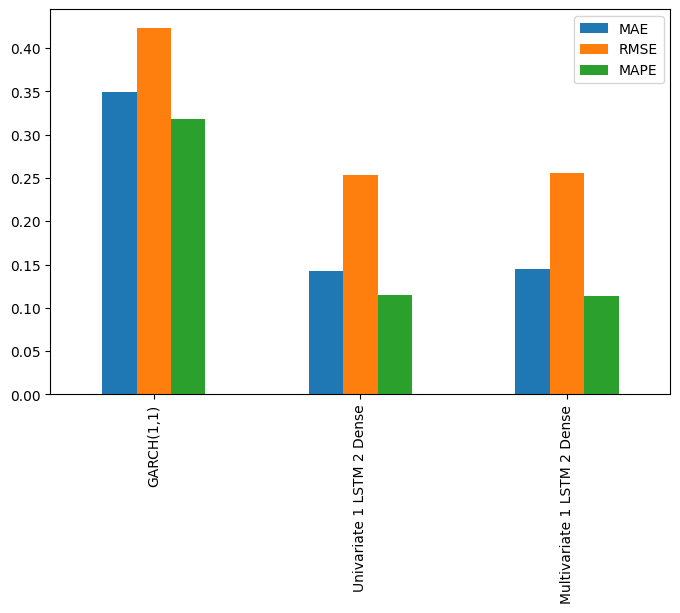

In [ ]:
UNVRMODEL_Table.plot(kind = 'bar', figsize = (8,5))

<ipython-input-349-5d6a26e8a9d7>:2: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



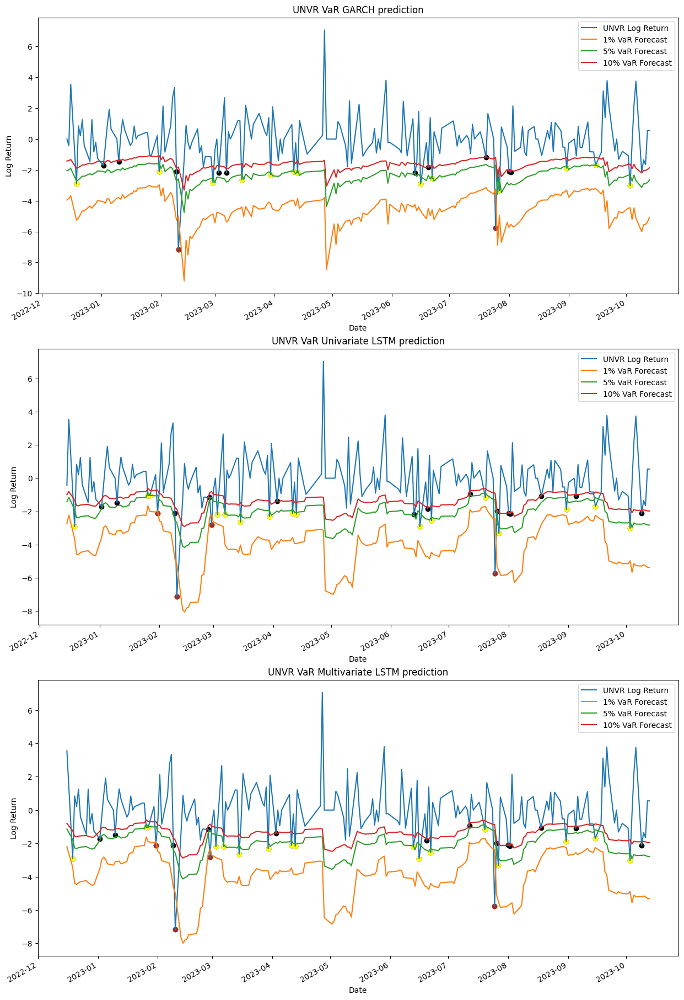

In [ ]:
plt.subplots(figsize = (15,25))
plt.subplot(3,1,1)
UNVR_test['log return'].plot(ylabel = 'Log Return')
UNVR_VaR_garch['1%'].plot()
UNVR_VaR_garch['5%'].plot()
UNVR_VaR_garch['10%'].plot()
plt.legend(['UNVR Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(UNVR_failed10.index, UNVR_failed10.values, color='black')
plt.scatter(UNVR_failed5.index, UNVR_failed5.values, color='yellow')
plt.scatter(UNVR_failed1.index, UNVR_failed1.values, color='brown')
plt.title('UNVR VaR GARCH prediction')


plt.subplot(3,1,2)
UNVR_uni[Uq_90+5:]['log return'].plot(ylabel = 'Log Return')
UNVR_VaR_uni['1%'].plot()
UNVR_VaR_uni['5%'].plot()
UNVR_VaR_uni['10%'].plot()
plt.legend(['UNVR Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(UNVRU_failed10.index, UNVRU_failed10.values, color='black')
plt.scatter(UNVRU_failed5.index, UNVRU_failed5.values, color='yellow')
plt.scatter(UNVRU_failed1.index, UNVRU_failed1.values, color='brown')
plt.title('UNVR VaR Univariate LSTM prediction')

plt.subplot(3,1,3)
UNVR_multi_copy[Mq_90+5:]['log return'].plot(ylabel = 'Log Return')
UNVR_VaR_multi['1%'].plot()
UNVR_VaR_multi['5%'].plot()
UNVR_VaR_multi['10%'].plot()
plt.legend(['UNVR Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(UNVRM_failed10.index, UNVRM_failed10.values, color='black')
plt.scatter(UNVRM_failed5.index, UNVRM_failed5.values, color='yellow')
plt.scatter(UNVRM_failed1.index, UNVRM_failed1.values, color='brown')
plt.title('UNVR VaR Multivariate LSTM prediction');

In [ ]:
overexceedUNVR = {'GARCH': [UNVR_failed1.value_counts().sum(), UNVR_failed5.value_counts().sum(), UNVR_failed10.value_counts().sum()],
                 'Univariate LSTM': [UNVRU_failed1.value_counts().sum(), UNVRU_failed5.value_counts().sum(), UNVRU_failed10.value_counts().sum()],
                 'Multivariate LSTM': [UNVRM_failed1.value_counts().sum(), UNVRM_failed5.value_counts().sum(), UNVRM_failed10.value_counts().sum()],
                }
overexceed_UNVR = pd.DataFrame(overexceedUNVR, index = ['1%', '5%', '10%'])
overexceed_UNVR

,GARCH,Univariate LSTM,Multivariate LSTM
1%,2,4,4
5%,15,20,21
10%,25,34,34


## BYAN
***

<ipython-input-351-858d1416cb44>:2: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



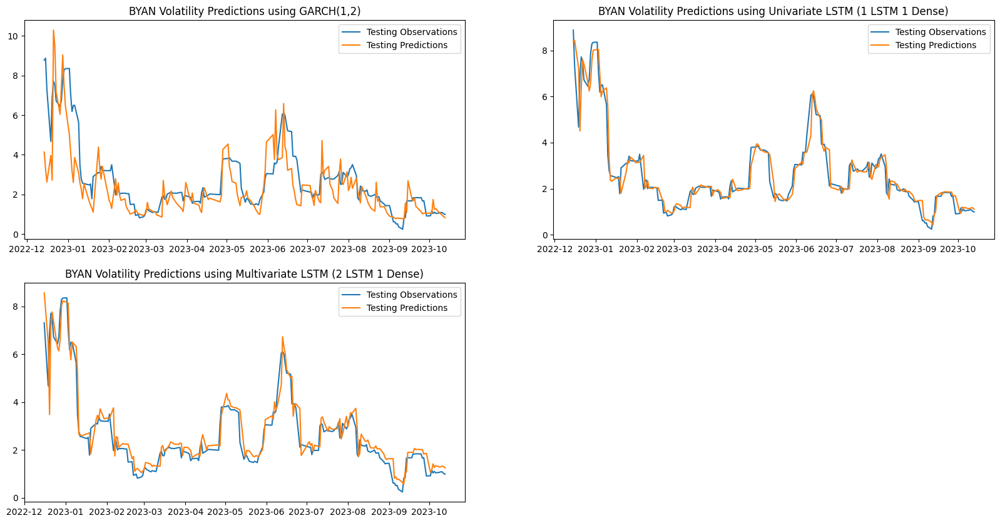

In [ ]:
plt.subplots(figsize = (20,10))
plt.subplot(2,2,1)
plt.plot(BYAN_test['10 day volatility'])
plt.plot(BYAN_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('BYAN Volatility Predictions using GARCH(1,2)')

plt.subplot(2,2,2)
plt.plot(BYAN_dates_test, BYAN_y_test)
plt.plot(BYAN_dates_test, BYANU11_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('BYAN Volatility Predictions using Univariate LSTM (1 LSTM 1 Dense)')

plt.subplot(2,2,3)
plt.plot(BYANm_dates_test, BYANm_y_test)
plt.plot(BYANm_dates_test, BYANM21_test_predictions)
plt.legend(['Testing Observations', 'Testing Predictions'])
plt.title('BYAN Volatility Predictions using Multivariate LSTM (2 LSTM 1 Dense)');

In [ ]:
BYANMODEL_Eval = {'MAE': [BYANgarch_test_mae, BYANU11_test_mae, BYANM21_test_mae],
                  'RMSE': [BYANgarch_test_rmse, BYANU11_test_rmse, BYANM21_test_rmse],
                  'MAPE': [BYANgarch_test_mape, BYANU11_test_mape, BYANM21_test_mape]
                 }

BYANMODEL_Table = pd.DataFrame(BYANMODEL_Eval, index =['GARCH(1,1)', 'Univariate 1 LSTM 1 Dense', 'Multivariate 2 LSTM 1 Dense'])
BYANMODEL_Table

,MAE,RMSE,MAPE
"GARCH(1,1)",0.777639,1.199015,0.271020
Univariate 1 LSTM 1 Dense,0.303869,0.516032,0.135206
Multivariate 2 LSTM 1 Dense,0.360117,0.540082,0.183072


<Axes: >

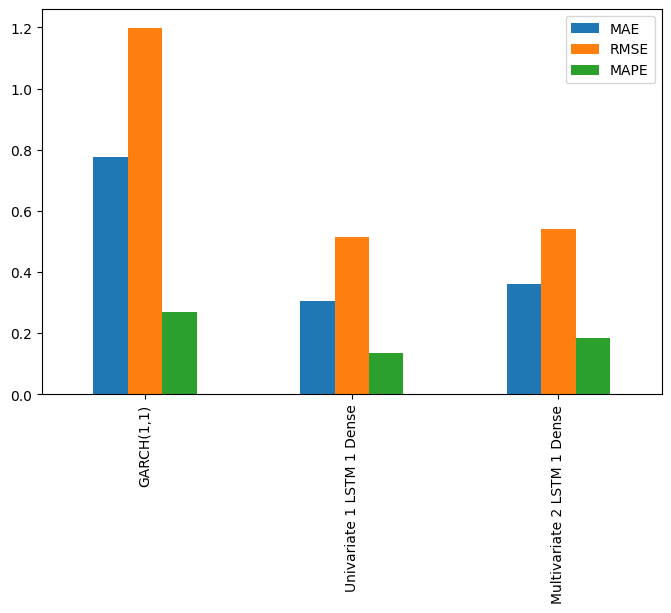

In [ ]:
BYANMODEL_Table.plot(kind = 'bar', figsize = (8,5))

<ipython-input-354-a8f0b02c446c>:2: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



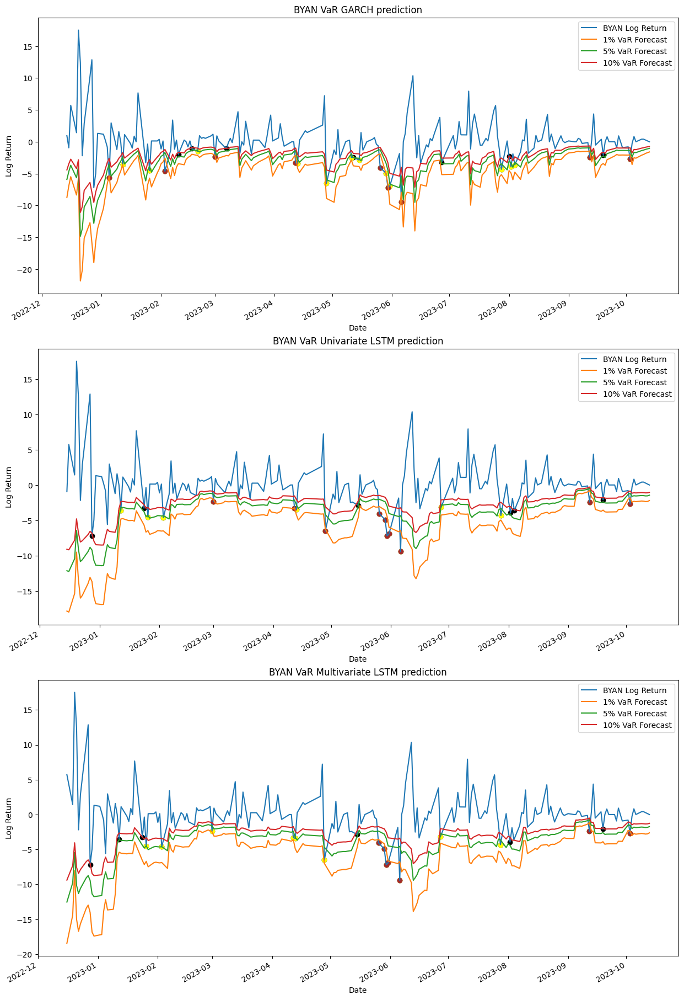

In [ ]:
plt.subplots(figsize = (15,25))
plt.subplot(3,1,1)
BYAN_test['log return'].plot(ylabel = 'Log Return')
BYAN_VaR_garch['1%'].plot()
BYAN_VaR_garch['5%'].plot()
BYAN_VaR_garch['10%'].plot()
plt.legend(['BYAN Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(BYAN_failed10.index, BYAN_failed10.values, color='black')
plt.scatter(BYAN_failed5.index, BYAN_failed5.values, color='yellow')
plt.scatter(BYAN_failed1.index, BYAN_failed1.values, color='brown')
plt.title('BYAN VaR GARCH prediction')

plt.subplot(3,1,2)
BYAN_uni[Uq_90+5:]['log return'].plot(ylabel = 'Log Return')
BYAN_VaR_uni['1%'].plot()
BYAN_VaR_uni['5%'].plot()
BYAN_VaR_uni['10%'].plot()
plt.legend(['BYAN Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(BYANU_failed10.index, BYANU_failed10.values, color='black')
plt.scatter(BYANU_failed5.index, BYANU_failed5.values, color='yellow')
plt.scatter(BYANU_failed1.index, BYANU_failed1.values, color='brown')
plt.title('BYAN VaR Univariate LSTM prediction')

plt.subplot(3,1,3)
BYAN_multi_copy[Mq_90+5:]['log return'].plot(ylabel = 'Log Return')
BYAN_VaR_multi['1%'].plot()
BYAN_VaR_multi['5%'].plot()
BYAN_VaR_multi['10%'].plot()
plt.legend(['BYAN Log Return','1% VaR Forecast', '5% VaR Forecast', '10% VaR Forecast'])
plt.scatter(BYANM_failed10.index, BYANM_failed10.values, color='black')
plt.scatter(BYANM_failed5.index, BYANM_failed5.values, color='yellow')
plt.scatter(BYANM_failed1.index, BYANM_failed1.values, color='brown')
plt.title('BYAN VaR Multivariate LSTM prediction');

In [ ]:
overexceedBYAN = {'GARCH': [BYAN_failed1.value_counts().sum(), BYAN_failed5.value_counts().sum(), BYAN_failed10.value_counts().sum()],
                 'Univariate LSTM': [BYANU_failed1.value_counts().sum(), BYANU_failed5.value_counts().sum(), BYANU_failed10.value_counts().sum()],
                 'Multivariate LSTM': [BYANM_failed1.value_counts().sum(), BYANM_failed5.value_counts().sum(), BYANM_failed10.value_counts().sum()],
                }
overexceed_BYAN = pd.DataFrame(overexceedBYAN, index = ['1%', '5%', '10%'])
overexceed_BYAN

,GARCH,Univariate LSTM,Multivariate LSTM
1%,9,10,7
5%,21,16,15
10%,28,22,21


In [ ]:
pd.DataFrame(BCAU11_test_predictions).to_csv('/content/drive/MyDrive/A Comparative Study of LSTM and GARCH/BCAU11_test_predictions')
pd.DataFrame(BCAU21_test_predictions).to_csv('/content/drive/MyDrive/A Comparative Study of LSTM and GARCH/BCAU21_test_predictions')
pd.DataFrame(BCAU12_test_predictions).to_csv('/content/drive/MyDrive/A Comparative Study of LSTM and GARCH/BCAU12_test_predictions')
pd.DataFrame(BCAU22_test_predictions).to_csv('/content/drive/MyDrive/A Comparative Study of LSTM and GARCH/BCAU22_test_predictions')
pd.DataFrame(BCAU33_test_predictions).to_csv('/content/drive/MyDrive/A Comparative Study of LSTM and GARCH/BCAU33_test_predictions')

In [ ]:
pd.DataFrame(UNVRU11_test_predictions).to_csv('/content/drive/MyDrive/A Comparative Study of LSTM and GARCH/UNVRU11_test_predictions')
pd.DataFrame(UNVRU21_test_predictions).to_csv('/content/drive/MyDrive/A Comparative Study of LSTM and GARCH/UNVRU21_test_predictions')
pd.DataFrame(UNVRU12_test_predictions).to_csv('/content/drive/MyDrive/A Comparative Study of LSTM and GARCH/UNVRU12_test_predictions')
pd.DataFrame(UNVRU22_test_predictions).to_csv('/content/drive/MyDrive/A Comparative Study of LSTM and GARCH/UNVRU22_test_predictions')
pd.DataFrame(UNVRU33_test_predictions).to_csv('/content/drive/MyDrive/A Comparative Study of LSTM and GARCH/UNVRU33_test_predictions')

In [ ]:
pd.DataFrame(BYANU11_test_predictions).to_csv('/content/drive/MyDrive/A Comparative Study of LSTM and GARCH/BYANU11_test_predictions')
pd.DataFrame(BYANU21_test_predictions).to_csv('/content/drive/MyDrive/A Comparative Study of LSTM and GARCH/BYANU21_test_predictions')
pd.DataFrame(BYANU12_test_predictions).to_csv('/content/drive/MyDrive/A Comparative Study of LSTM and GARCH/BYANU12_test_predictions')
pd.DataFrame(BYANU22_test_predictions).to_csv('/content/drive/MyDrive/A Comparative Study of LSTM and GARCH/BYANU22_test_predictions')
pd.DataFrame(BYANU33_test_predictions).to_csv('/content/drive/MyDrive/A Comparative Study of LSTM and GARCH/BYANU33_test_predictions')